     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.1/4.1 MB 39.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for japanize_matplotlib: filename=japanize_matplotlib-1.1.3-py3-none-any.whl size=4120257 sha256=1a30c2829013e7f6505ec888eb78bdaf9554a68a98056df7bfebddc97de21823
  Stored in directory: /root/.cache/pip/wheels/c1/f7/9b/418f19a7b9340fc16e071e89efc379aca68d40238b258df53d
Successfully built japanize_matplotlib

卒論第1段階：日経225専用データセット作成
日経225データ取得中...
取得期間: 2000-01-04 → 2024-12-30
取得行数: 6,126 営業日

リターン計算完了: 6,125 観測値
  平均リターン（日次）: 0.0121%
  標準偏差（日次）    : 1.4616%

基本統計量
  観測数:           6,125
  平均（日次）:     0.0121%
  標準偏差（日次）: 1.4616%
  歪度:             -0.4325
  超過尖度:         7.1870
  最小値:           -13.2341%
  最大値:           13.2346%
  JB統計量:         13373.08 (p=0.00e+00)
  年率リターン:     3.05%
  年率ボラ:         23.20%

--------------------------------------------------
CSVファイル保存
--------------------------------------------------
保存: nikkei_prices.csv
保存: nikkei_re

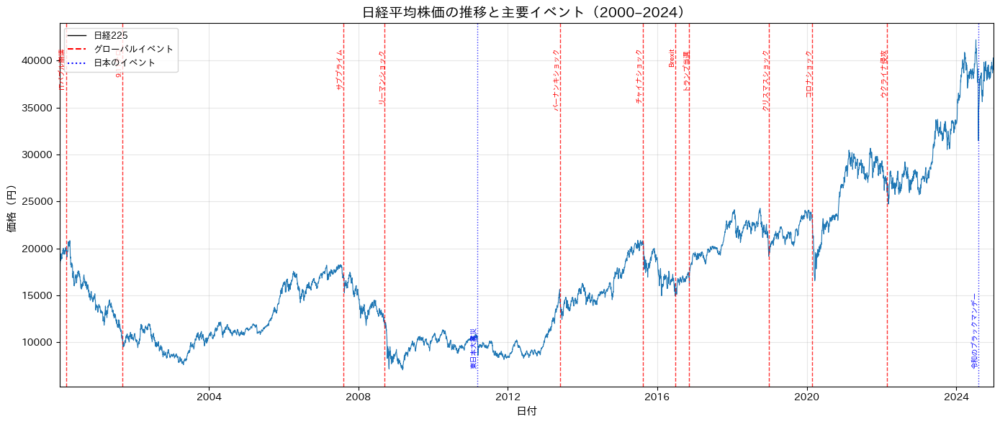

保存: fig_return_distribution.pdf
保存: fig_return_distribution.png


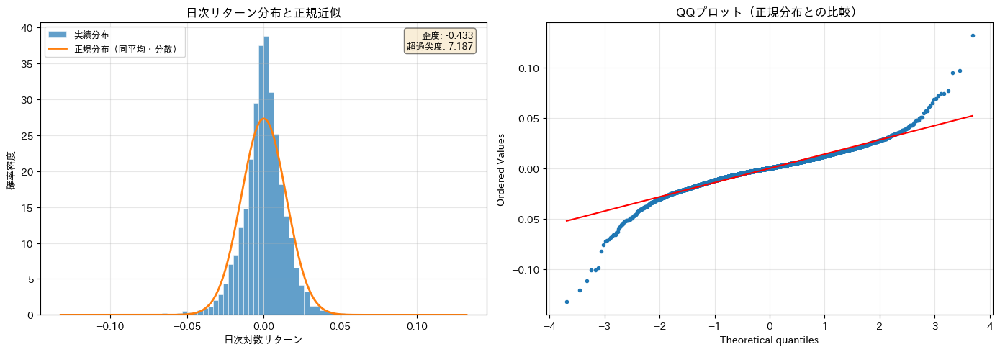

保存: fig_event_timeline.pdf
保存: fig_event_timeline.png


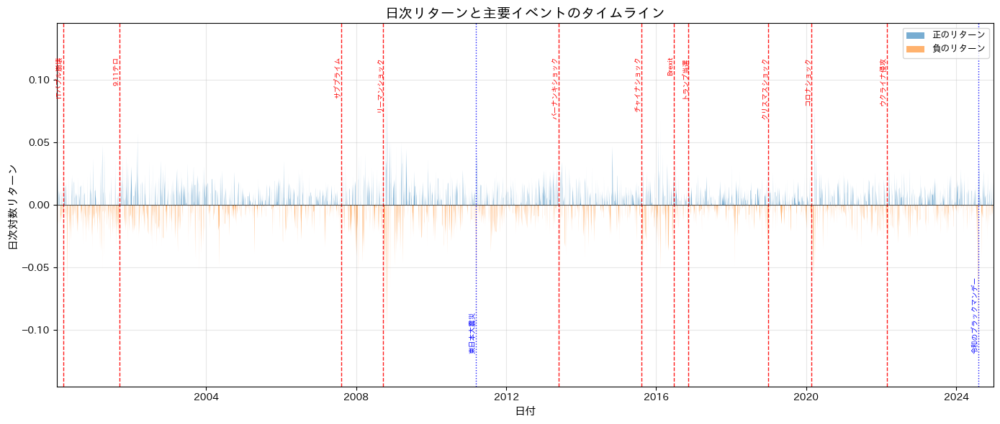


✅ 日経225専用データセット作成 完了

生成ファイル一覧:
  📊 CSVデータ:
     - nikkei_prices.csv
     - nikkei_returns.csv
     - nikkei_statistics.csv
  📈 可視化:
     - fig_price.pdf / .png
     - fig_return_distribution.pdf / .png
     - fig_event_timeline.pdf / .png

→ 次のステップ: EWMA推定（第2段階）へ


In [ ]:
"""
卒業論文：リターン分布形状のレジームダイナミクス分析
第1段階（最終版）：日経225専用データ取得・加工スクリプト
============================================

このスクリプトの目的（卒論用）:
✔ 日経225データ（価格・リターン）の作成
✔ 欠損処理・基本統計量の計算
✔ 日経225のイベントタイムライン図
✔ リターン分布（ヒスト＋QQ図）
✔ 後続の EWMA・MSモデル・リスク評価に使うCSVの生成

出力ファイル:
- nikkei_prices.csv              : 価格データ
- nikkei_returns.csv             : リターンデータ
- nikkei_statistics.csv          : 基本統計量
- fig_price.pdf(png)             : 価格推移図（イベント付き）
- fig_return_distribution.pdf(png): リターン分布＋QQ図
- fig_event_timeline.pdf(png)    : リターン＋イベントタイムライン図
============================================
"""

# 必要ならコメントアウトを解除（環境による）
!pip install japanize_matplotlib yfinance

import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
import japanize_matplotlib
from scipy.stats import skew, kurtosis, jarque_bera, norm, probplot
from datetime import datetime
import warnings

warnings.filterwarnings('ignore')

# ----------------------------------------------
# 1. 主要設定
# ----------------------------------------------
START = "2000-01-01"
END = "2024-12-31"
TICKER = "^N225"  # 日経平均株価

# 卒論分析用イベントリスト（ユーザー指定の13イベント）
# 日付は早期検知検証のため、暴落の「起点」または「決定的なトリガー日」を設定

EVENTS = [
    # 1. ITバブル崩壊 (NASDAQのピークアウト日)
    {"name": "ITバブル崩壊", "date": "2000-03-10", "region": "global"},

    # 2. 9.11テロ (発生日)
    {"name": "9.11テロ", "date": "2001-09-11", "region": "global"},

    # 4. サブプライム (BNPパリバ・ショック：世界同時株安の起点)
    {"name": "サブプライム", "date": "2007-08-09", "region": "global"},

    # 5. リーマンショック (破綻申請日)
    {"name": "リーマンショック", "date": "2008-09-15", "region": "global"},

    # 6. 東日本大震災 (発生日)
    {"name": "東日本大震災", "date": "2011-03-11", "region": "japan"},

    # 7. バーナンキショック (5.23ショック：暴落開始日)
    {"name": "バーナンキショック", "date": "2013-05-23", "region": "global"},

    # 8. チャイナショック (人民元切り下げ：世界波及のトリガー日)
    {"name": "チャイナショック", "date": "2015-08-11", "region": "global"},

    # 9. Brexit (国民投票結果判明・暴落日)
    {"name": "Brexit", "date": "2016-06-24", "region": "global"},

    {"name": "トランプ当選", "date": "2016-11-09", "region": "global"},

    # 10. 2018年末株安 (米金利上昇懸念による下落トレンド入り起点)
    {"name": "クリスマスショック", "date": "2018-12-25", "region": "global"},

    # 11. コロナショック (世界同時株安の開始日)
    {"name": "コロナショック", "date": "2020-02-24", "region": "global"},

    # 12. ウクライナ侵攻 (侵攻開始日)
    {"name": "ウクライナ侵攻", "date": "2022-02-24", "region": "global"},

    # 13. 令和のブラックマンデー (歴史的大暴落当日)
    {"name": "令和のブラックマンデー", "date": "2024-08-05", "region": "japan"}
]


# ----------------------------------------------
# 2. データ取得
# ----------------------------------------------
def download_nikkei(use_sample: bool = False) -> pd.DataFrame:
    """
    日経225データをyfinanceから取得
    use_sample=True の場合はオフライン環境用の疑似データを生成
    """
    print("=" * 50)
    print("日経225データ取得中...")
    print("=" * 50)

    if use_sample:
        # オフライン環境用：簡易な擬似データ
        print("※ サンプルデータモード（デモ用）")
        np.random.seed(42)
        dates = pd.bdate_range(start=START, end=END)
        n = len(dates)

        mu = 0.02 / 252           # 年率2%程度
        sigma = 0.20 / np.sqrt(252)  # 年率ボラ20%程度

        returns = np.zeros(n)

        for i in range(n):
            date = dates[i]
            if (pd.Timestamp('2008-09-01') <= date <= pd.Timestamp('2009-03-31')) or \
               (pd.Timestamp('2020-02-20') <= date <= pd.Timestamp('2020-04-30')):
                # 危機期間（高ボラ・負の期待リターン）
                returns[i] = np.random.normal(-0.002, sigma * 2.5)
            elif pd.Timestamp('2013-01-01') <= date <= pd.Timestamp('2015-06-30'):
                # アベノミクス的な上昇局面
                returns[i] = np.random.normal(0.001, sigma * 1.2)
            else:
                # 通常期間
                returns[i] = np.random.normal(mu, sigma)

        prices = 18000 * np.exp(np.cumsum(returns))

        df = pd.DataFrame({'Nikkei225': prices}, index=dates)
        df.index.name = 'Date'
    else:
        try:
            df = yf.download(TICKER, start=START, end=END, progress=False)

            if df.empty:
                raise ValueError("データ取得失敗")

            # yfinanceのMultiIndex対応
            if isinstance(df.columns, pd.MultiIndex):
                df.columns = df.columns.get_level_values(0)

            df = df[['Close']].copy()
            df.columns = ['Nikkei225']

            df.index = pd.to_datetime(df.index)
            df.index.name = 'Date'

        except Exception as e:
            print(f"⚠️ データ取得エラー: {e}")
            print("サンプルデータモードに切り替えます...")
            return download_nikkei(use_sample=True)

    print(f"取得期間: {df.index.min().strftime('%Y-%m-%d')} → {df.index.max().strftime('%Y-%m-%d')}")
    print(f"取得行数: {len(df):,} 営業日")

    return df


# ----------------------------------------------
# 3. リターン計算
# ----------------------------------------------
def calc_returns(df: pd.DataFrame) -> pd.DataFrame:
    """終値から日次対数リターンを計算"""
    df = df.copy()
    df['Return'] = np.log(df['Nikkei225'] / df['Nikkei225'].shift(1))
    df = df.dropna()

    print(f"\nリターン計算完了: {len(df):,} 観測値")
    print(f"  平均リターン（日次）: {df['Return'].mean() * 100:.4f}%")
    print(f"  標準偏差（日次）    : {df['Return'].std() * 100:.4f}%")

    return df


# ----------------------------------------------
# 4. 統計量計算
# ----------------------------------------------
def compute_statistics(df: pd.DataFrame) -> pd.DataFrame:
    """リターンの詳細統計量を計算し、DataFrameで返す"""
    r = df['Return']
    jb_stat, jb_p = jarque_bera(r)

    stats = {
        'Observations': len(r),
        'Mean': r.mean(),
        'Std': r.std(),
        'Min': r.min(),
        'Max': r.max(),
        'Skewness': skew(r),
        'Excess_Kurtosis': kurtosis(r, fisher=True),
        'JB_Statistic': jb_stat,
        'JB_pvalue': jb_p,
        'Annualized_Mean': r.mean() * 252,
        'Annualized_Std': r.std() * np.sqrt(252),
    }

    stats_df = pd.DataFrame([stats])

    print("\n" + "=" * 50)
    print("基本統計量")
    print("=" * 50)
    print(f"  観測数:           {stats['Observations']:,}")
    print(f"  平均（日次）:     {stats['Mean']*100:.4f}%")
    print(f"  標準偏差（日次）: {stats['Std']*100:.4f}%")
    print(f"  歪度:             {stats['Skewness']:.4f}")
    print(f"  超過尖度:         {stats['Excess_Kurtosis']:.4f}")
    print(f"  最小値:           {stats['Min']*100:.4f}%")
    print(f"  最大値:           {stats['Max']*100:.4f}%")
    print(f"  JB統計量:         {stats['JB_Statistic']:.2f} (p={stats['JB_pvalue']:.2e})")
    print(f"  年率リターン:     {stats['Annualized_Mean']*100:.2f}%")
    print(f"  年率ボラ:         {stats['Annualized_Std']*100:.2f}%")

    return stats_df


# ----------------------------------------------
# 5. 可視化：価格推移＋イベント
# ----------------------------------------------
def plot_price(df: pd.DataFrame,
               save_path_pdf: str = "fig_price.pdf",
               save_path_png: str | None = None) -> None:
    """
    日経225 価格推移 + 主要イベント（縦線＋イベント名）
    論文用：単独図／PDF出力
    """
    fig, ax = plt.subplots(figsize=(14, 6))

    # 価格時系列
    ax.plot(df.index, df['Nikkei225'],
            linewidth=0.8,
            label='日経225')

    y_min = df['Nikkei225'].min()
    y_max = df['Nikkei225'].max()

    # イベント描画
    for ev in EVENTS:
        ts = pd.Timestamp(ev["date"])
        if ts < df.index.min() or ts > df.index.max():
            continue

        color = "red" if ev["region"] == "global" else "blue"
        linestyle = "--" if ev["region"] == "global" else ":"

        ax.axvline(ts, color=color, ls=linestyle, alpha=0.8, linewidth=1.0)

        # global は上、japan は下にラベル
        if ev["region"] == "global":
            y_text = y_max * 0.98
            va = "top"
        else:
            y_text = y_min * 1.02
            va = "bottom"

        ax.text(ts, y_text, ev["name"],
                rotation=90,
                fontsize=7,
                color=color,
                ha="right",
                va=va)

    ax.set_title("日経平均株価の推移と主要イベント（2000–2024）",
                 fontsize=14, fontweight="bold")
    ax.set_xlabel("日付", fontsize=11)
    ax.set_ylabel("価格（円）", fontsize=11)
    ax.grid(alpha=0.3, linestyle="-")
    ax.set_xlim(df.index.min(), df.index.max())

    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color="black", linewidth=1, label="日経225"),
        Line2D([0], [0], color="red", linestyle="--", label="グローバルイベント"),
        Line2D([0], [0], color="blue", linestyle=":", label="日本のイベント"),
    ]
    ax.legend(handles=legend_elements, loc="upper left", fontsize=9)

    plt.tight_layout()

    plt.savefig(save_path_pdf, dpi=300, bbox_inches="tight", facecolor="white")
    print(f"保存: {save_path_pdf}")

    if save_path_png is not None:
        plt.savefig(save_path_png, dpi=300, bbox_inches="tight", facecolor="white")
        print(f"保存: {save_path_png}")

    plt.show()


# ----------------------------------------------
# 6. 可視化：リターン分布＋QQ
# ----------------------------------------------
def plot_return_distribution(df: pd.DataFrame,
                             save_path_pdf: str = "fig_return_distribution.pdf",
                             save_path_png: str | None = None) -> None:
    """
    日次リターン分布：
      左：ヒストグラム + 正規分布フィット
      右：QQプロット
    論文用の単独図
    """
    r = df["Return"]

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # --- 左：ヒストグラム + 正規分布 ---
    ax0 = axes[0]
    ax0.hist(r, bins=80, density=True, alpha=0.7,
             edgecolor="white", linewidth=0.5,
             label="実績分布")

    x = np.linspace(r.min(), r.max(), 300)
    ax0.plot(x, norm.pdf(x, r.mean(), r.std()),
             linewidth=2, label="正規分布（同平均・分散）")

    ax0.set_title("日次リターン分布と正規近似", fontsize=12, fontweight="bold")
    ax0.set_xlabel("日次対数リターン", fontsize=10)
    ax0.set_ylabel("確率密度", fontsize=10)
    ax0.legend(fontsize=9)
    ax0.grid(alpha=0.3)

    textstr = f"歪度: {skew(r):.3f}\n超過尖度: {kurtosis(r, fisher=True):.3f}"
    ax0.text(0.97, 0.97, textstr,
             transform=ax0.transAxes,
             fontsize=9,
             verticalalignment="top",
             horizontalalignment="right",
             bbox=dict(boxstyle="round", facecolor="wheat", alpha=0.5))

    # --- 右：QQプロット ---
    ax1 = axes[1]
    probplot(r, dist="norm", plot=ax1)
    ax1.set_title("QQプロット（正規分布との比較）", fontsize=12, fontweight="bold")
    ax1.grid(alpha=0.3)

    # マーカーと基準線を整える
    line_data = ax1.get_lines()[0]
    line_ref = ax1.get_lines()[1]
    line_data.set_markerfacecolor("tab:blue")
    line_data.set_markeredgecolor("tab:blue")
    line_data.set_markersize(3)
    line_ref.set_linewidth(1.5)

    plt.tight_layout()

    plt.savefig(save_path_pdf, dpi=300, bbox_inches="tight", facecolor="white")
    print(f"保存: {save_path_pdf}")

    if save_path_png is not None:
        plt.savefig(save_path_png, dpi=300, bbox_inches="tight", facecolor="white")
        print(f"保存: {save_path_png}")

    plt.show()


# ----------------------------------------------
# 7. 可視化：リターンタイムライン＋イベント
# ----------------------------------------------
def plot_event_timeline(df: pd.DataFrame,
                        save_path_pdf: str = "fig_event_timeline.pdf",
                        save_path_png: str | None = None) -> None:
    """
    日次リターンのタイムライン + 共通イベントセット
    （正のリターン/負のリターンを色分け）
    """
    r = df["Return"]

    fig, ax = plt.subplots(figsize=(14, 6))

    ax.fill_between(r.index, 0, r,
                    where=(r >= 0),
                    alpha=0.6, label="正のリターン")
    ax.fill_between(r.index, 0, r,
                    where=(r < 0),
                    alpha=0.6, label="負のリターン")

    y_min = r.min()
    y_max = r.max()

    for ev in EVENTS:
        ts = pd.Timestamp(ev["date"])
        if ts < r.index.min() or ts > r.index.max():
            continue

        color = "red" if ev["region"] == "global" else "blue"
        linestyle = "--" if ev["region"] == "global" else ":"

        ax.axvline(ts, color=color, ls=linestyle, alpha=0.9, linewidth=1.0)

        if ev["region"] == "global":
            y_text = y_max * 0.9
            va = "top"
        else:
            y_text = y_min * 0.9
            va = "bottom"

        ax.text(ts, y_text, ev["name"],
                rotation=90,
                fontsize=7,
                color=color,
                ha="right",
                va=va)

    ax.set_title("日次リターンと主要イベントのタイムライン", fontsize=14, fontweight="bold")
    ax.set_xlabel("日付", fontsize=11)
    ax.set_ylabel("日次対数リターン", fontsize=11)
    ax.set_xlim(r.index.min(), r.index.max())
    ax.axhline(0, color="black", linewidth=0.5)
    ax.grid(alpha=0.3, linestyle="-")

    ax.legend(loc="upper right", fontsize=9)

    plt.tight_layout()

    plt.savefig(save_path_pdf, dpi=300, bbox_inches="tight", facecolor="white")
    print(f"保存: {save_path_pdf}")

    if save_path_png is not None:
        plt.savefig(save_path_png, dpi=300, bbox_inches="tight", facecolor="white")
        print(f"保存: {save_path_png}")

    plt.show()


# ----------------------------------------------
# 8. メイン処理
# ----------------------------------------------
def main():
    """メイン実行関数"""
    print("\n" + "=" * 60)
    print("卒論第1段階：日経225専用データセット作成")
    print("=" * 60)

    # データ取得
    df = download_nikkei()

    # リターン計算
    df = calc_returns(df)

    # 統計量計算
    stats = compute_statistics(df)

    # CSV保存
    print("\n" + "-" * 50)
    print("CSVファイル保存")
    print("-" * 50)

    df[['Nikkei225']].to_csv("nikkei_prices.csv")
    print("保存: nikkei_prices.csv")

    df[['Return']].to_csv("nikkei_returns.csv")
    print("保存: nikkei_returns.csv")

    stats.to_csv("nikkei_statistics.csv", index=False)
    print("保存: nikkei_statistics.csv")

    # 可視化（図ごとに個別PDF＋任意でPNG）
    print("\n" + "-" * 50)
    print("可視化ファイル生成")
    print("-" * 50)

    plot_price(df,
               save_path_pdf="fig_price.pdf",
               save_path_png="fig_price.png")

    plot_return_distribution(df,
               save_path_pdf="fig_return_distribution.pdf",
               save_path_png="fig_return_distribution.png")

    plot_event_timeline(df,
               save_path_pdf="fig_event_timeline.pdf",
               save_path_png="fig_event_timeline.png")

    print("\n" + "=" * 60)
    print("✅ 日経225専用データセット作成 完了")
    print("=" * 60)
    print("\n生成ファイル一覧:")
    print("  📊 CSVデータ:")
    print("     - nikkei_prices.csv")
    print("     - nikkei_returns.csv")
    print("     - nikkei_statistics.csv")
    print("  📈 可視化:")
    print("     - fig_price.pdf / .png")
    print("     - fig_return_distribution.pdf / .png")
    print("     - fig_event_timeline.pdf / .png")
    print("\n→ 次のステップ: EWMA推定（第2段階）へ")

    return df, stats


if __name__ == "__main__":
    df, stats = main()

Step 1: EWMA時変モーメント推定（日経225専用・統合版）

[データ読み込み] nikkei_returns.csv
  ✅ 読み込み成功
  期間: 2000-01-05 ～ 2024-12-30
  行数: 6,125

EWMA時変モーメント計算

[EWMA計算]
  λ=0.90 ✓
  λ=0.94 ✓
  λ=0.97 ✓
  λ=0.99 ✓

Rolling窓モーメント計算

[Rolling計算]
  窓=60日 ✓
  窓=120日 ✓

定常性検定

[定常性検定 (ADF)]
  歪度: ADF=-7.218, p=0.0000 ✓ 定常
  超過尖度: ADF=-2.475, p=0.1216 ✗ 非定常

歪度・尖度の関係分析（3.5節）

[歪度・尖度の関係分析]
  歪度-尖度相関: -0.5137 (p=0.00e+00)

  [レジーム予備分類に使える分位点]
    歪度 33/67パーセンタイル: -0.312 / 0.026
    尖度 33/67パーセンタイル: 0.227 / 1.356

λ選択評価

[λ選択評価]
 Lambda  Skew_Std  Kurt_Std  Skew_AC1  Kurt_AC1  Skew_Change  Kurt_Change
   0.90  0.516298  2.294158  0.926266  0.961560     0.148377     0.350908
   0.94  0.505212  2.472947  0.956805  0.984727     0.092407     0.243750
   0.97  0.516195  3.060498  0.976119  0.993589     0.050215     0.155668
   0.99  0.455834  3.532152  0.984256  0.994391     0.019669     0.081625

要約統計・相関（表3-3 / 表3-4）
✅ ewma_summary_stats.csv（表3-3用）
✅ ewma_corr_matrix.csv（表3-4用）

===== 表3-3: EWMA Vol / Skew / ExKurt 記述統計 (LaT

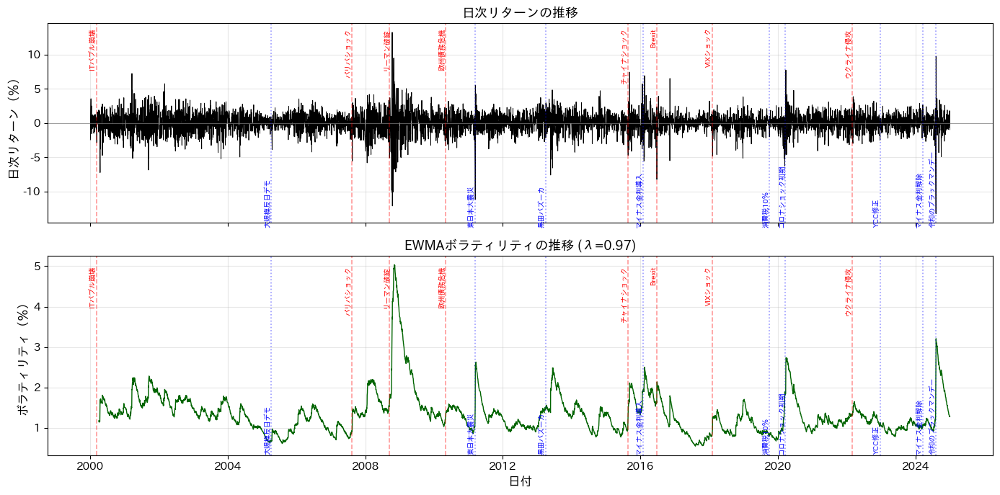

✅ 保存: fig_skew_timeseries.pdf
✅ 保存: fig_skew_timeseries.png


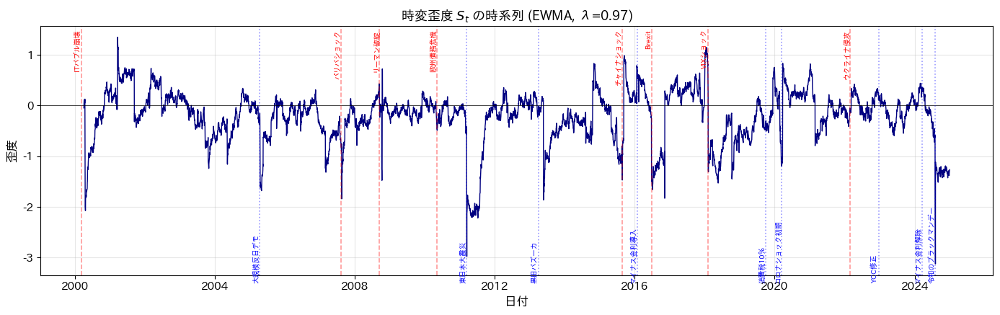

✅ 保存: fig_kurt_timeseries.pdf
✅ 保存: fig_kurt_timeseries.png


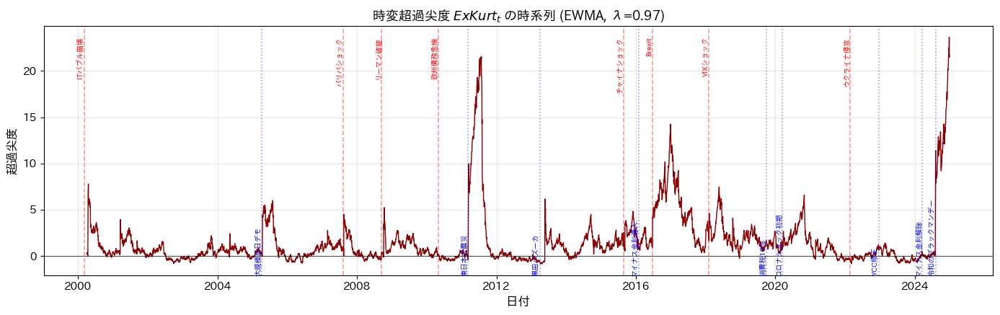

✅ 保存: fig_vol_skew_kurt_3panel.pdf
✅ 保存: fig_vol_skew_kurt_3panel.png


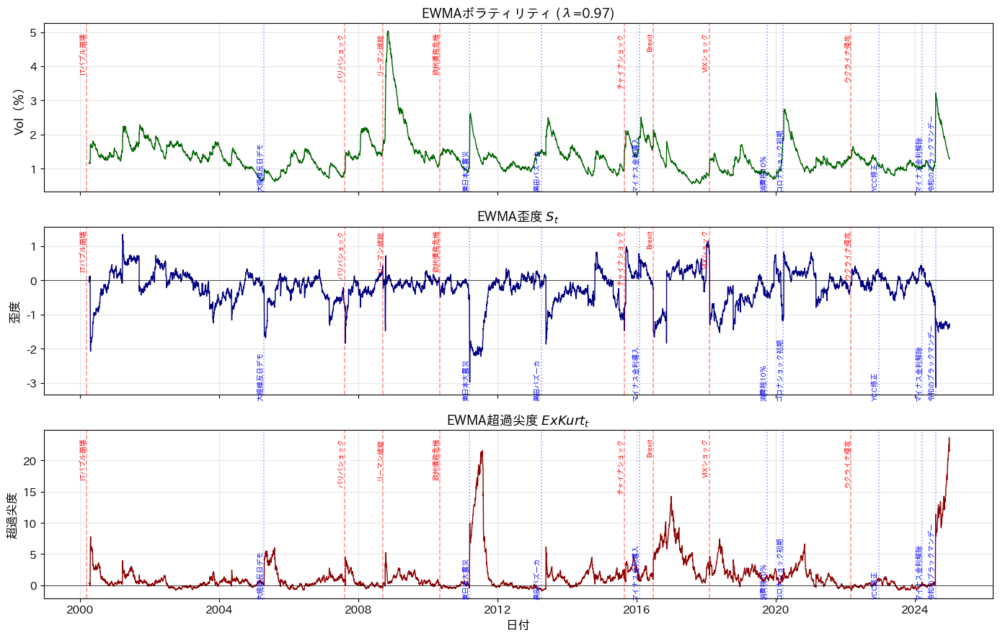

✅ 保存: fig_ewma_variance.pdf
✅ 保存: fig_ewma_variance.png


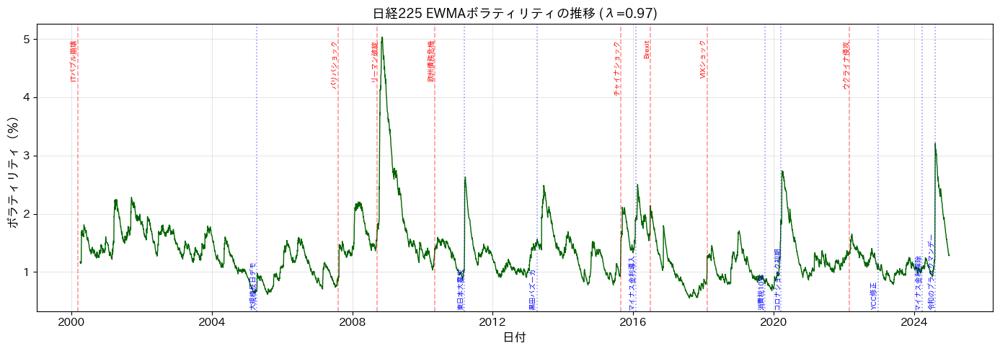

✅ 保存: fig_ewma_lambda_sensitivity.pdf
✅ 保存: fig_ewma_lambda_sensitivity.png


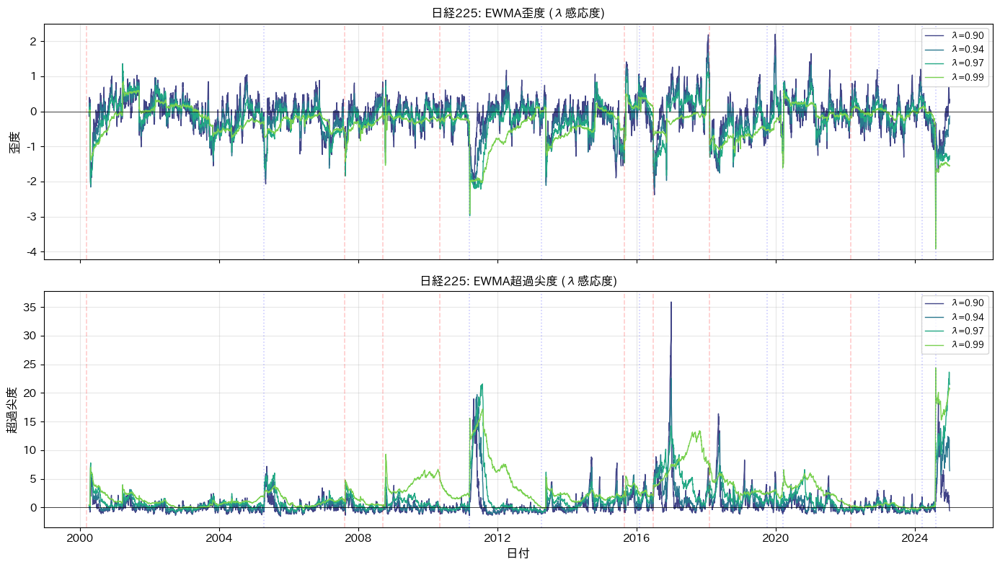

✅ 保存: fig_ewma_vs_rolling.pdf
✅ 保存: fig_ewma_vs_rolling.png


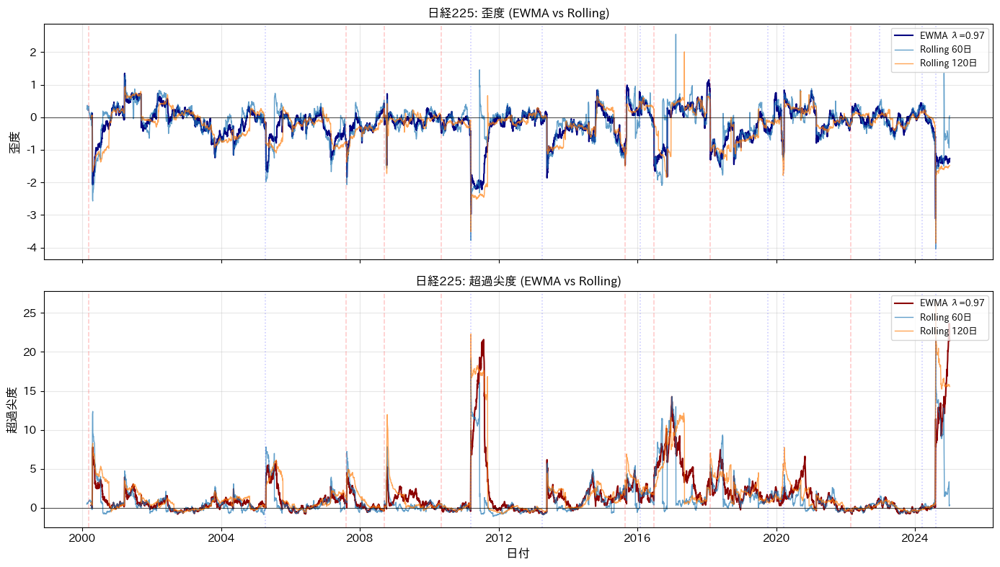

✅ 保存: fig_ewma_event_timeline.pdf
✅ 保存: fig_ewma_event_timeline.png


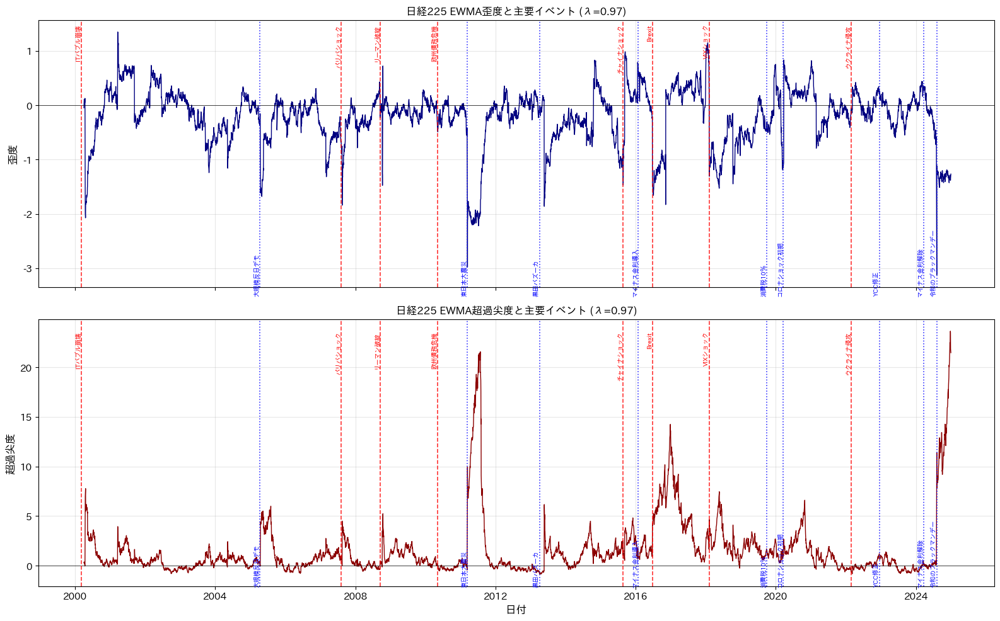

✅ 保存: fig_skew_kurt_relationship.pdf
✅ 保存: fig_skew_kurt_relationship.png


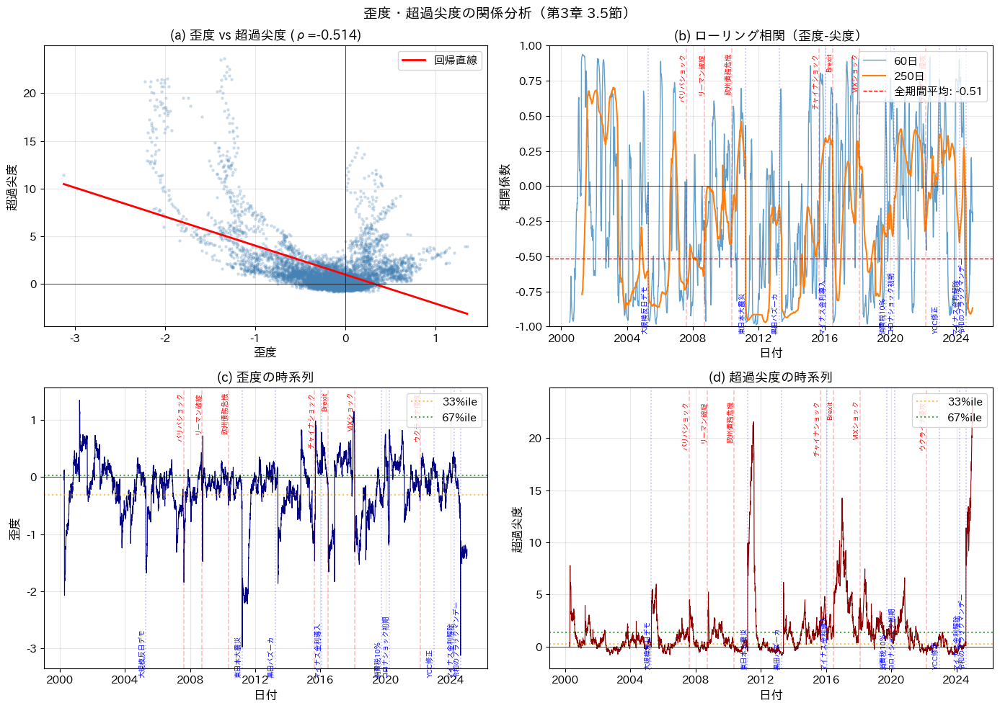


Step 1 完了サマリー

✅ EWMA時変モーメント計算完了
   - λ 候補 = [0.9, 0.94, 0.97, 0.99]
   - 本文で採用する λ = 0.97
   - ウォームアップ期間 = 60日

✅ 定常性検定（ewma_stationarity.csv）
✅ λ選択評価（ewma_lambda_evaluation.csv）
✅ 表3-3 / 表3-4 用データ
   - ewma_summary_stats.csv
   - ewma_corr_matrix.csv
   - LaTeX tabular はコンソール出力済み

✅ 歪度・尖度の関係（3.5節）
   - 歪度: 平均=-0.2150, 標準偏差=0.5162
   - 超過尖度: 平均=1.6127, 標準偏差=3.0605
   - 相関: -0.5137

→ 第4章のMSモデル推定には ewma_moments_nikkei.csv を使用



In [ ]:
"""
卒業論文：リターン分布形状のレジームダイナミクス分析
Step 1: EWMA時変モーメント推定（日経225専用・統合版）

========================================
入力:
  - nikkei_returns.csv（Step 0で作成）

本スクリプトの内容:
  1. EWMA時変歪度・超過尖度・分散の計算
     - λ = {0.90, 0.94, 0.97, 0.99}
     - ウォームアップ期間による安定した初期化

  2. Rolling窓でのサンプル歪度・尖度（比較用）
     - 窓 = 60日, 120日

  3. 追加分析
     - 定常性検定（ADF）
     - 歪度・尖度の関係分析
     - λ選択評価

  4. 可視化（卒論第3章用・PDF＋PNG）
     - 図3-3: 日次リターンとEWMAボラティリティ（2段パネル）
     - 図3-4: 時変歪度 S_t の時系列
     - 図3-5: 時変超過尖度 ExKurt_t の時系列
     - EWMA Vol / Skew / ExKurt の3段パネル図
     - EWMA Vol 単独図
     - λ感応度（歪度・超過尖度）
     - EWMA vs Rolling比較
     - EWMA歪度・尖度とイベントタイムライン（イベント名付き）
     - 歪度・尖度の関係（散布図＋ローリング相関＋時系列）

  5. 表（数値出力）
     - 表3-3: EWMA Volatility / Skewness / Excess Kurtosis の記述統計
     - 表3-4: EWMA Volatility / Skewness / Excess Kurtosis の相関係数行列
       → LaTeX tabular を標準出力に表示

出力ファイル:
  - ewma_moments_nikkei.csv
  - ewma_moments_all_lambda.csv
  - ewma_stationarity.csv
  - ewma_lambda_evaluation.csv
  - ewma_summary_stats.csv
  - ewma_corr_matrix.csv

  - fig_return_ewmavol_2panel.pdf / .png
  - fig_skew_timeseries.pdf / .png
  - fig_kurt_timeseries.pdf / .png
  - fig_vol_skew_kurt_3panel.pdf / .png
  - fig_ewma_variance.pdf / .png
  - fig_ewma_lambda_sensitivity.pdf / .png
  - fig_ewma_vs_rolling.pdf / .png
  - fig_ewma_event_timeline.pdf / .png
  - fig_skew_kurt_relationship.pdf / .png
========================================
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis, pearsonr
from statsmodels.tsa.stattools import adfuller
import warnings

warnings.filterwarnings('ignore')

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams.update({
    'font.size': 11,
    'axes.titlesize': 13,
    'axes.labelsize': 12,
    'figure.dpi': 100,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'axes.grid': True,
    'grid.alpha': 0.3,
})

print("=" * 70)
print("Step 1: EWMA時変モーメント推定（日経225専用・統合版）")
print("=" * 70)


# ============================================================================
# 1. パラメータ設定 & 卒論全体で統一して用いるイベント一覧
# ============================================================================

EWMA_LAMBDAS = [0.90, 0.94, 0.97, 0.99]
LAMBDA_BASE = 0.97           # 本文で主に使う λ
WARMUP_PERIOD = 60           # ウォームアップ期間（日数）
ROLLING_WINDOWS = [60, 120]  # Rolling窓

INPUT_FILE = "nikkei_returns.csv"



# ============================================================================
# 2. データ読み込み
# ============================================================================

def load_returns_data(path: str = INPUT_FILE) -> pd.Series:
    """Step 0 で作成した日経225リターンデータを読み込み"""
    print(f"\n[データ読み込み] {path}")
    try:
        df = pd.read_csv(path, index_col=0, parse_dates=True)
        print(f"  ✅ 読み込み成功")
        print(f"  期間: {df.index[0].date()} ～ {df.index[-1].date()}")
        print(f"  行数: {len(df):,}")
        if 'Return' in df.columns:
            returns = df['Return']
        elif 'Nikkei225_return' in df.columns:
            returns = df['Nikkei225_return']
        else:
            returns = df.iloc[:, 0]
        returns.name = 'Return'
        return returns

    except FileNotFoundError:
        print(f"  ⚠️ ファイルが見つかりません: {path}")
        print("  → サンプルデータを生成します（デモ用、論文本番では Step 0 を実行）")

        np.random.seed(42)
        dates = pd.date_range('2000-01-01', '2024-12-31', freq='B')
        n = len(dates)

        regime = np.zeros(n, dtype=int)
        current_regime = 0
        for i in range(1, n):
            if current_regime == 0:  # Normal
                if np.random.random() < 0.01:
                    current_regime = 1
            elif current_regime == 1:  # Stress
                if np.random.random() < 0.05:
                    current_regime = 2
                elif np.random.random() < 0.10:
                    current_regime = 0
            else:  # Crisis
                if np.random.random() < 0.15:
                    current_regime = 1
            regime[i] = current_regime

        returns = np.where(
            regime == 0, np.random.normal(0.0005, 0.012, n),
            np.where(regime == 1, np.random.normal(-0.001, 0.020, n),
                     np.random.normal(-0.005, 0.035, n))
        )
        returns = pd.Series(returns, index=dates, name='Return')
        returns.to_csv(path)
        print(f"  ✅ サンプルデータを生成・保存: {len(returns):,}行")
        return returns


# ============================================================================
# 3. EWMA時変モーメント計算
# ============================================================================

def compute_ewma_moments(
    returns: pd.Series,
    lam: float,
    warmup: int = 60
) -> pd.DataFrame:
    """
    EWMA による時変平均・分散・歪度・超過尖度（Excess Kurtosis）を計算
    """
    r = returns.dropna().values
    n = len(r)
    dates = returns.dropna().index

    if n < warmup:
        print(f"    ⚠️ データ数({n}) < ウォームアップ期間({warmup}) → 短縮します")
        warmup = max(20, n // 4)

    ewma_skew = np.full(n, np.nan)
    ewma_kurt = np.full(n, np.nan)
    ewma_var  = np.full(n, np.nan)

    warmup_data = r[:warmup]
    m1 = np.mean(warmup_data)
    m2 = np.mean(warmup_data ** 2)
    m3 = np.mean(warmup_data ** 3)
    m4 = np.mean(warmup_data ** 4)

    for i in range(warmup, n):
        x = r[i]
        m1 = lam * m1 + (1 - lam) * x
        m2 = lam * m2 + (1 - lam) * x ** 2
        m3 = lam * m3 + (1 - lam) * x ** 3
        m4 = lam * m4 + (1 - lam) * x ** 4

        mu = m1
        mu2 = m2 - mu ** 2
        if mu2 <= 1e-10:
            continue

        mu3 = m3 - 3 * mu * m2 + 2 * mu ** 3
        mu4 = m4 - 4 * mu * m3 + 6 * mu ** 2 * m2 - 3 * mu ** 4

        sigma2 = mu2
        sigma = np.sqrt(sigma2)

        ewma_var[i] = sigma2
        ewma_skew[i] = mu3 / (sigma ** 3)
        ewma_kurt[i] = mu4 / (sigma2 ** 2) - 3.0   # Excess Kurtosis

        ewma_skew[i] = np.clip(ewma_skew[i], -10, 10)
        ewma_kurt[i] = np.clip(ewma_kurt[i], -5, 50)

    lam_str = f"{lam:.2f}".replace(".", "")
    df = pd.DataFrame({
        f'skew_ewma_{lam_str}': ewma_skew,
        f'kurt_ewma_{lam_str}': ewma_kurt,
        f'var_ewma_{lam_str}': ewma_var,
    }, index=dates)
    return df


def compute_all_ewma(returns: pd.Series, lambdas: list, warmup: int = 60) -> pd.DataFrame:
    print(f"\n[EWMA計算]")
    dfs = []
    for lam in lambdas:
        df = compute_ewma_moments(returns, lam, warmup)
        dfs.append(df)
        print(f"  λ={lam:.2f} ✓")
    return pd.concat(dfs, axis=1)


# ============================================================================
# 4. Rolling窓での歪度・尖度計算
# ============================================================================

def compute_rolling_moments(
    returns: pd.Series,
    windows: list,
    min_frac: float = 0.5
) -> pd.DataFrame:
    """Rolling窓によるサンプル歪度・超過尖度"""
    r = returns.copy()
    df_out = pd.DataFrame(index=r.index)
    print(f"\n[Rolling計算]")
    for w in windows:
        min_periods = max(1, int(w * min_frac))
        df_out[f'skew_roll_{w}'] = r.rolling(
            window=w, min_periods=min_periods
        ).apply(lambda x: skew(x, bias=False), raw=False)
        df_out[f'kurt_roll_{w}'] = r.rolling(
            window=w, min_periods=min_periods
        ).apply(lambda x: kurtosis(x, fisher=True, bias=False), raw=False)
        print(f"  窓={w}日 ✓")
    return df_out


# ============================================================================
# 5. 定常性検定
# ============================================================================

def test_stationarity(series: pd.Series, name: str) -> dict:
    result = adfuller(series.dropna(), autolag='AIC')
    return {
        'Variable': name,
        'ADF_Statistic': result[0],
        'p_value': result[1],
        'Lags_Used': result[2],
        'Critical_1%': result[4]['1%'],
        'Critical_5%': result[4]['5%'],
        'Is_Stationary': result[1] < 0.05,
    }


def run_stationarity_tests(df: pd.DataFrame, lam: float = LAMBDA_BASE) -> pd.DataFrame:
    print("\n[定常性検定 (ADF)]")
    lam_str = f"{lam:.2f}".replace(".", "")
    test_cols = [
        (f'skew_ewma_{lam_str}', '歪度'),
        (f'kurt_ewma_{lam_str}', '超過尖度'),
    ]
    results = []
    for col, name in test_cols:
        if col in df.columns:
            result = test_stationarity(df[col], name)
            results.append(result)
            status = "✓ 定常" if result['Is_Stationary'] else "✗ 非定常"
            print(f"  {name}: ADF={result['ADF_Statistic']:.3f}, p={result['p_value']:.4f} {status}")
    return pd.DataFrame(results)


# ============================================================================
# 6. 歪度・尖度の関係分析
# ============================================================================

def analyze_skew_kurt_relationship(df: pd.DataFrame, lam: float = LAMBDA_BASE) -> dict:
    print("\n[歪度・尖度の関係分析]")
    lam_str = f"{lam:.2f}".replace(".", "")
    skew_col = f'skew_ewma_{lam_str}'
    kurt_col = f'kurt_ewma_{lam_str}'

    skew_series = df[skew_col].dropna()
    kurt_series = df[kurt_col].dropna()
    common_idx = skew_series.index.intersection(kurt_series.index)
    skew_common = skew_series.loc[common_idx]
    kurt_common = kurt_series.loc[common_idx]

    corr, p_val = pearsonr(skew_common, kurt_common)
    print(f"  歪度-尖度相関: {corr:.4f} (p={p_val:.2e})")

    rolling_corr_60 = skew_common.rolling(60).corr(kurt_common)
    rolling_corr_250 = skew_common.rolling(250).corr(kurt_common)

    stats = {
        'skew_mean': skew_common.mean(),
        'skew_std': skew_common.std(),
        'kurt_mean': kurt_common.mean(),
        'kurt_std': kurt_common.std(),
        'correlation': corr,
        'correlation_pval': p_val,
    }

    skew_q33, skew_q67 = skew_common.quantile([0.33, 0.67])
    kurt_q33, kurt_q67 = kurt_common.quantile([0.33, 0.67])

    print("\n  [レジーム予備分類に使える分位点]")
    print(f"    歪度 33/67パーセンタイル: {skew_q33:.3f} / {skew_q67:.3f}")
    print(f"    尖度 33/67パーセンタイル: {kurt_q33:.3f} / {kurt_q67:.3f}")

    return {
        'stats': stats,
        'rolling_corr_60': rolling_corr_60,
        'rolling_corr_250': rolling_corr_250,
        'skew': skew_common,
        'kurt': kurt_common,
        'quantiles': {
            'skew_q33': skew_q33, 'skew_q67': skew_q67,
            'kurt_q33': kurt_q33, 'kurt_q67': kurt_q67,
        }
    }


# ============================================================================
# 7. λ選択評価
# ============================================================================

def evaluate_lambda_selection(
    returns: pd.Series,
    lambdas: list,
    warmup: int = 60
) -> pd.DataFrame:
    print("\n[λ選択評価]")
    results = []
    for lam in lambdas:
        df = compute_ewma_moments(returns, lam, warmup)
        lam_str = f"{lam:.2f}".replace(".", "")
        skew_col = f'skew_ewma_{lam_str}'
        kurt_col = f'kurt_ewma_{lam_str}'
        skew_series = df[skew_col].dropna()
        kurt_series = df[kurt_col].dropna()
        results.append({
            'Lambda': lam,
            'Skew_Std': skew_series.std(),
            'Kurt_Std': kurt_series.std(),
            'Skew_AC1': skew_series.autocorr(lag=1),
            'Kurt_AC1': kurt_series.autocorr(lag=1),
            'Skew_Change': skew_series.diff().abs().mean(),
            'Kurt_Change': kurt_series.diff().abs().mean(),
        })
    df_eval = pd.DataFrame(results)
    print(df_eval.to_string(index=False))
    return df_eval


# ============================================================================
# 8. 要約統計・相関（表3-3 & 表3-4）
# ============================================================================

def compute_ewma_summary_and_corr(df: pd.DataFrame, lam: float = LAMBDA_BASE):
    """
    表3-3: EWMA Vol / Skew / ExKurt の記述統計
    表3-4: EWMA Vol / Skew / ExKurt の相関係数行列
    を計算し、CSV保存＋LaTeX tabular を print。
    """
    lam_str = f"{lam:.2f}".replace(".", "")
    col_var = f'var_ewma_{lam_str}'
    col_skew = f'skew_ewma_{lam_str}'
    col_kurt = f'kurt_ewma_{lam_str}'

    if not all(c in df.columns for c in [col_var, col_skew, col_kurt]):
        print("⚠️ 必要なEWMA列が不足しています。")
        return None, None

    vol = np.sqrt(df[col_var]) * 100.0  # パーセント表示
    skew_series = df[col_skew]
    kurt_series = df[col_kurt]

    data = pd.concat([
        vol.rename('Volatility'),
        skew_series.rename('Skewness'),
        kurt_series.rename('ExcessKurtosis')
    ], axis=1).dropna()

    summary = pd.DataFrame({
        'Mean': data.mean(),
        'Std': data.std(),
        'Min': data.min(),
        'Max': data.max(),
    })

    corr_mat = data.corr()

    summary.to_csv('ewma_summary_stats.csv')
    corr_mat.to_csv('ewma_corr_matrix.csv')
    print("✅ ewma_summary_stats.csv（表3-3用）")
    print("✅ ewma_corr_matrix.csv（表3-4用）")

    print("\n===== 表3-3: EWMA Vol / Skew / ExKurt 記述統計 (LaTeX) =====")
    print(summary.to_latex(float_format="%.4f"))

    print("\n===== 表3-4: EWMA Vol / Skew / ExKurt 相関行列 (LaTeX) =====")
    print(corr_mat.to_latex(float_format="%.4f"))

    return summary, corr_mat


# ============================================================================
# 9. 可視化用ユーティリティ（EVENTS を用いてイベント名付き）
# ============================================================================

def add_event_lines(ax, index, alpha=0.5, with_labels=False, label_pos=0.95):
    """
    卒論全体で統一した EVENTS に従って主要イベントに縦線を引く。
    - グローバル: 赤・破線
    - 日本     : 青・点線
    with_labels=True のときはイベント名も描画。
    """
    start, end = index[0], index[-1]

    for ev in EVENTS:
        dt = pd.Timestamp(ev["date"])
        if not (start <= dt <= end):
            continue

        if ev["region"] == "global":
            color = "red"
            ls = "--"
        else:
            color = "blue"
            ls = ":"

        ax.axvline(dt, color=color, ls=ls, alpha=alpha, lw=1.2)

        if with_labels:
            ymin, ymax = ax.get_ylim()
            if ev["region"] == "global":
                y = ymax * label_pos
                va = "top"
            else:
                y = ymin * (2 - label_pos)
                va = "bottom"
            ax.text(
                dt, y, ev["name"],
                fontsize=7, rotation=90,
                ha="right", va=va, color=color
            )


# ============================================================================
# 10. 可視化: 図3-3〜図3-5 & 3段パネルなど
# ============================================================================

def plot_return_and_volatility_2panel(df: pd.DataFrame,
                                      lam: float,
                                      save_pdf: str = "fig_return_ewmavol_2panel.pdf",
                                      save_png: str = "fig_return_ewmavol_2panel.png"):
    """
    図3-3: 日次リターンと EWMA ボラティリティの時系列（2段パネル）
    上: Return, 下: EWMA Volatility
    """
    lam_str = f"{lam:.2f}".replace(".", "")
    col_var = f'var_ewma_{lam_str}'
    if col_var not in df.columns or 'Return' not in df.columns:
        print("⚠️ Return または EWMA variance がありません。")
        return

    vol = np.sqrt(df[col_var]) * 100.0

    fig, axes = plt.subplots(2, 1, figsize=(14, 7), sharex=True)

    # 上: リターン
    ax = axes[0]
    ax.plot(df.index, df['Return'] * 100, lw=0.7, color='black')
    ax.axhline(0, color='gray', lw=0.5)
    ax.set_title("日次リターンの推移", fontweight='bold')
    ax.set_ylabel("日次リターン（％）")
    add_event_lines(ax, df.index, alpha=0.4, with_labels=True, label_pos=0.95)

    # 下: EWMAボラ
    ax = axes[1]
    ax.plot(df.index, vol, lw=1, color='darkgreen')
    ax.set_title(f"EWMAボラティリティの推移 (λ={lam:.2f})", fontweight='bold')
    ax.set_ylabel("ボラティリティ（％）")
    ax.set_xlabel("日付")
    add_event_lines(ax, df.index, alpha=0.4, with_labels=True, label_pos=0.95)

    plt.tight_layout()
    plt.savefig(save_pdf, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✅ 保存: {save_pdf}")
    if save_png is not None:
        plt.savefig(save_png, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✅ 保存: {save_png}")
    plt.show()
    plt.close()


def plot_skew_timeseries(df: pd.DataFrame,
                         lam: float,
                         save_pdf: str = "fig_skew_timeseries.pdf",
                         save_png: str = "fig_skew_timeseries.png"):
    """
    図3-4: 時変歪度 S_t の時系列
    """
    lam_str = f"{lam:.2f}".replace(".", "")
    col_skew = f'skew_ewma_{lam_str}'
    if col_skew not in df.columns:
        print("⚠️ EWMA 歪度列がありません。")
        return

    fig, ax = plt.subplots(figsize=(14, 4.5))
    ax.plot(df.index, df[col_skew], lw=1, color='navy')
    ax.axhline(0, color='black', lw=0.5)
    ax.set_title(f"時変歪度 $S_t$ の時系列 (EWMA, λ={lam:.2f})", fontweight='bold')
    ax.set_ylabel("歪度")
    ax.set_xlabel("日付")
    add_event_lines(ax, df.index, alpha=0.4, with_labels=True, label_pos=0.95)

    plt.tight_layout()
    plt.savefig(save_pdf, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✅ 保存: {save_pdf}")
    if save_png is not None:
        plt.savefig(save_png, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✅ 保存: {save_png}")
    plt.show()
    plt.close()


def plot_kurt_timeseries(df: pd.DataFrame,
                         lam: float,
                         save_pdf: str = "fig_kurt_timeseries.pdf",
                         save_png: str = "fig_kurt_timeseries.png"):
    """
    図3-5: 時変超過尖度 ExKurt_t の時系列
    """
    lam_str = f"{lam:.2f}".replace(".", "")
    col_kurt = f'kurt_ewma_{lam_str}'
    if col_kurt not in df.columns:
        print("⚠️ EWMA 超過尖度列がありません。")
        return

    fig, ax = plt.subplots(figsize=(14, 4.5))
    ax.plot(df.index, df[col_kurt], lw=1, color='darkred')
    ax.axhline(0, color='black', lw=0.5)
    ax.set_title(f"時変超過尖度 $ExKurt_t$ の時系列 (EWMA, λ={lam:.2f})", fontweight='bold')
    ax.set_ylabel("超過尖度")
    ax.set_xlabel("日付")
    add_event_lines(ax, df.index, alpha=0.4, with_labels=True, label_pos=0.95)

    plt.tight_layout()
    plt.savefig(save_pdf, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✅ 保存: {save_pdf}")
    if save_png is not None:
        plt.savefig(save_png, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✅ 保存: {save_png}")
    plt.show()
    plt.close()


def plot_vol_skew_kurt_3panel(df: pd.DataFrame,
                              lam: float,
                              save_pdf: str = "fig_vol_skew_kurt_3panel.pdf",
                              save_png: str = "fig_vol_skew_kurt_3panel.png"):
    """
    EWMA Volatility / Skewness / Excess Kurtosis の3段パネル図
    """
    lam_str = f"{lam:.2f}".replace(".", "")
    col_var = f'var_ewma_{lam_str}'
    col_skew = f'skew_ewma_{lam_str}'
    col_kurt = f'kurt_ewma_{lam_str}'

    if not all(c in df.columns for c in [col_var, col_skew, col_kurt]):
        print("⚠️ EWMA 列が不足しています。")
        return

    vol = np.sqrt(df[col_var]) * 100.0

    fig, axes = plt.subplots(3, 1, figsize=(14, 9), sharex=True)

    ax = axes[0]
    ax.plot(df.index, vol, lw=1, color='darkgreen')
    ax.set_title(f"EWMAボラティリティ (λ={lam:.2f})", fontweight='bold')
    ax.set_ylabel("Vol（％）")
    add_event_lines(ax, df.index, alpha=0.4, with_labels=True, label_pos=0.95)

    ax = axes[1]
    ax.plot(df.index, df[col_skew], lw=1, color='navy')
    ax.axhline(0, color='black', lw=0.5)
    ax.set_title("EWMA歪度 $S_t$", fontweight='bold')
    ax.set_ylabel("歪度")
    add_event_lines(ax, df.index, alpha=0.4, with_labels=True, label_pos=0.95)

    ax = axes[2]
    ax.plot(df.index, df[col_kurt], lw=1, color='darkred')
    ax.axhline(0, color='black', lw=0.5)
    ax.set_title("EWMA超過尖度 $ExKurt_t$", fontweight='bold')
    ax.set_ylabel("超過尖度")
    ax.set_xlabel("日付")
    add_event_lines(ax, df.index, alpha=0.4, with_labels=True, label_pos=0.95)

    plt.tight_layout()
    plt.savefig(save_pdf, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✅ 保存: {save_pdf}")
    if save_png is not None:
        plt.savefig(save_png, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✅ 保存: {save_png}")
    plt.show()
    plt.close()


def plot_ewma_variance(df: pd.DataFrame,
                       lam: float,
                       save_path_pdf: str = "fig_ewma_variance.pdf",
                       save_path_png: str = "fig_ewma_variance.png") -> None:
    """EWMAボラティリティ単独の図"""
    lam_str = f"{lam:.2f}".replace(".", "")
    col_var = f'var_ewma_{lam_str}'
    if col_var not in df.columns:
        print(f"⚠️ {col_var} が見つかりません")
        return
    vol = np.sqrt(df[col_var]) * 100
    fig, ax = plt.subplots(figsize=(14, 5))
    ax.plot(df.index, vol, lw=1, color="darkgreen")
    ax.set_title(f"日経225 EWMAボラティリティの推移 (λ={lam:.2f})",
                 fontsize=13, fontweight="bold")
    ax.set_ylabel("ボラティリティ（％）")
    ax.set_xlabel("日付")
    add_event_lines(ax, df.index, alpha=0.4, with_labels=True, label_pos=0.95)
    ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(save_path_pdf, dpi=300, bbox_inches="tight", facecolor="white")
    print(f"✅ 保存: {save_path_pdf}")
    if save_path_png is not None:
        plt.savefig(save_path_png, dpi=300, bbox_inches="tight", facecolor="white")
        print(f"✅ 保存: {save_path_png}")
    plt.show()
    plt.close()


def plot_lambda_sensitivity(df: pd.DataFrame,
                            lambdas: list,
                            save_path_pdf: str = 'fig_ewma_lambda_sensitivity.pdf',
                            save_path_png: str = 'fig_ewma_lambda_sensitivity.png') -> None:
    """λ感応度図（歪度・超過尖度）"""
    fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)
    colors = plt.cm.viridis(np.linspace(0.2, 0.8, len(lambdas)))

    ax = axes[0]
    for i, lam in enumerate(lambdas):
        lam_str = f"{lam:.2f}".replace(".", "")
        col = f'skew_ewma_{lam_str}'
        if col in df.columns:
            ax.plot(df.index, df[col], lw=1, color=colors[i], label=f'λ={lam:.2f}')
    ax.axhline(0, color='black', lw=0.5)
    ax.set_title('日経225: EWMA歪度 (λ感応度)', fontsize=12, fontweight='bold')
    ax.set_ylabel('歪度')
    ax.legend(loc='upper right', fontsize=9)
    add_event_lines(ax, df.index, alpha=0.2, with_labels=False)

    ax = axes[1]
    for i, lam in enumerate(lambdas):
        lam_str = f"{lam:.2f}".replace(".", "")
        col = f'kurt_ewma_{lam_str}'
        if col in df.columns:
            ax.plot(df.index, df[col], lw=1, color=colors[i], label=f'λ={lam:.2f}')
    ax.axhline(0, color='black', lw=0.5)
    ax.set_title('日経225: EWMA超過尖度 (λ感応度)', fontsize=12, fontweight='bold')
    ax.set_ylabel('超過尖度')
    ax.set_xlabel('日付')
    ax.legend(loc='upper right', fontsize=9)
    add_event_lines(ax, df.index, alpha=0.2, with_labels=False)

    plt.tight_layout()
    plt.savefig(save_path_pdf, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✅ 保存: {save_path_pdf}")
    if save_path_png is not None:
        plt.savefig(save_path_png, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✅ 保存: {save_path_png}")
    plt.show()
    plt.close()


def plot_ewma_vs_rolling(df: pd.DataFrame,
                         lam: float,
                         windows: list,
                         save_path_pdf: str = 'fig_ewma_vs_rolling.pdf',
                         save_path_png: str = 'fig_ewma_vs_rolling.png') -> None:
    """EWMA vs Rolling の比較図（歪度・超過尖度）"""
    lam_str = f"{lam:.2f}".replace(".", "")

    fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

    ax = axes[0]
    col_ewma = f'skew_ewma_{lam_str}'
    if col_ewma in df.columns:
        ax.plot(df.index, df[col_ewma], lw=1.5, color='navy', label=f'EWMA λ={lam:.2f}')
    for w in windows:
        col_roll = f'skew_roll_{w}'
        if col_roll in df.columns:
            ax.plot(df.index, df[col_roll], lw=1, alpha=0.7, label=f'Rolling {w}日')
    ax.axhline(0, color='black', lw=0.5)
    ax.set_title('日経225: 歪度 (EWMA vs Rolling)', fontsize=12, fontweight='bold')
    ax.set_ylabel('歪度')
    ax.legend(loc='upper right', fontsize=9)
    add_event_lines(ax, df.index, alpha=0.2, with_labels=False)

    ax = axes[1]
    col_ewma = f'kurt_ewma_{lam_str}'
    if col_ewma in df.columns:
        ax.plot(df.index, df[col_ewma], lw=1.5, color='darkred', label=f'EWMA λ={lam:.2f}')
    for w in windows:
        col_roll = f'kurt_roll_{w}'
        if col_roll in df.columns:
            ax.plot(df.index, df[col_roll], lw=1, alpha=0.7, label=f'Rolling {w}日')
    ax.axhline(0, color='black', lw=0.5)
    ax.set_title('日経225: 超過尖度 (EWMA vs Rolling)', fontsize=12, fontweight='bold')
    ax.set_ylabel('超過尖度')
    ax.set_xlabel('日付')
    ax.legend(loc='upper right', fontsize=9)
    add_event_lines(ax, df.index, alpha=0.2, with_labels=False)

    plt.tight_layout()
    plt.savefig(save_path_pdf, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✅ 保存: {save_path_pdf}")
    if save_path_png is not None:
        plt.savefig(save_path_png, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✅ 保存: {save_path_png}")
    plt.show()
    plt.close()


def plot_event_timeline(df: pd.DataFrame,
                        lam: float,
                        save_path_pdf: str = 'fig_ewma_event_timeline.pdf',
                        save_path_png: str = 'fig_ewma_event_timeline.png') -> None:
    """EWMA歪度・超過尖度とイベント名を明示したタイムライン図"""
    lam_str = f"{lam:.2f}".replace(".", "")
    fig, axes = plt.subplots(2, 1, figsize=(16, 10), sharex=True)

    ax = axes[0]
    col = f'skew_ewma_{lam_str}'
    if col in df.columns:
        ax.plot(df.index, df[col], lw=1, color='navy')
    ax.axhline(0, color='black', lw=0.5)
    ax.set_title(f'日経225 EWMA歪度と主要イベント (λ={lam:.2f})', fontsize=12, fontweight='bold')
    ax.set_ylabel('歪度')
    add_event_lines(ax, df.index, alpha=0.8, with_labels=True, label_pos=0.95)

    ax = axes[1]
    col = f'kurt_ewma_{lam_str}'
    if col in df.columns:
        ax.plot(df.index, df[col], lw=1, color='darkred')
    ax.axhline(0, color='black', lw=0.5)
    ax.set_title(f'日経225 EWMA超過尖度と主要イベント (λ={lam:.2f})', fontsize=12, fontweight='bold')
    ax.set_ylabel('超過尖度')
    ax.set_xlabel('日付')
    add_event_lines(ax, df.index, alpha=0.8, with_labels=True, label_pos=0.95)

    plt.tight_layout()
    plt.savefig(save_path_pdf, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✅ 保存: {save_path_pdf}")
    if save_path_png is not None:
        plt.savefig(save_path_png, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✅ 保存: {save_path_png}")
    plt.show()
    plt.close()


def plot_skew_kurt_relationship_fig(
    analysis: dict,
    save_path_pdf: str = 'fig_skew_kurt_relationship.pdf',
    save_path_png: str = 'fig_skew_kurt_relationship.png'
) -> None:
    """歪度・尖度の関係可視化（散布図＋ローリング相関＋時系列）"""
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    skew_series = analysis['skew']
    kurt_series = analysis['kurt']
    stats = analysis['stats']
    q = analysis['quantiles']

    ax = axes[0, 0]
    ax.scatter(skew_series, kurt_series, alpha=0.2, s=5, c='steelblue')
    z = np.polyfit(skew_series, kurt_series, 1)
    p = np.poly1d(z)
    x_line = np.linspace(skew_series.min(), skew_series.max(), 100)
    ax.plot(x_line, p(x_line), 'r-', lw=2, label='回帰直線')
    ax.axhline(0, color='black', lw=0.5)
    ax.axvline(0, color='black', lw=0.5)
    ax.set_xlabel('歪度')
    ax.set_ylabel('超過尖度')
    ax.set_title(f'(a) 歪度 vs 超過尖度 (ρ={stats["correlation"]:.3f})', fontweight='bold')
    ax.legend()
    ax.grid(alpha=0.3)

    ax = axes[0, 1]
    ax.plot(analysis['rolling_corr_60'].index, analysis['rolling_corr_60'],
            lw=1, alpha=0.7, label='60日')
    ax.plot(analysis['rolling_corr_250'].index, analysis['rolling_corr_250'],
            lw=1.5, label='250日')
    ax.axhline(0, color='black', lw=0.5)
    ax.axhline(stats['correlation'], color='red', ls='--', lw=1,
               label=f'全期間平均: {stats["correlation"]:.2f}')
    ax.set_ylabel('相関係数')
    ax.set_xlabel('日付')
    ax.set_title('(b) ローリング相関（歪度-尖度）', fontweight='bold')
    ax.legend(loc='upper right')
    ax.set_ylim(-1, 1)
    add_event_lines(ax, skew_series.index, alpha=0.25, with_labels=True, label_pos=0.95)

    ax = axes[1, 0]
    ax.plot(skew_series.index, skew_series, lw=0.8, color='navy')
    ax.axhline(0, color='black', lw=0.5)
    ax.axhline(q['skew_q33'], color='orange', ls=':', alpha=0.7, label='33%ile')
    ax.axhline(q['skew_q67'], color='green', ls=':', alpha=0.7, label='67%ile')
    ax.set_ylabel('歪度')
    ax.set_xlabel('日付')
    ax.set_title('(c) 歪度の時系列', fontweight='bold')
    ax.legend(loc='upper right')
    add_event_lines(ax, skew_series.index, alpha=0.25, with_labels=True, label_pos=0.95)

    ax = axes[1, 1]
    ax.plot(kurt_series.index, kurt_series, lw=0.8, color='darkred')
    ax.axhline(0, color='black', lw=0.5)
    ax.axhline(q['kurt_q33'], color='orange', ls=':', alpha=0.7, label='33%ile')
    ax.axhline(q['kurt_q67'], color='green', ls=':', alpha=0.7, label='67%ile')
    ax.set_ylabel('超過尖度')
    ax.set_xlabel('日付')
    ax.set_title('(d) 超過尖度の時系列', fontweight='bold')
    ax.legend(loc='upper right')
    add_event_lines(ax, kurt_series.index, alpha=0.25, with_labels=True, label_pos=0.95)

    plt.suptitle('歪度・超過尖度の関係分析（第3章 3.5節）',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(save_path_pdf, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"✅ 保存: {save_path_pdf}")
    if save_path_png is not None:
        plt.savefig(save_path_png, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✅ 保存: {save_path_png}")
    plt.show()
    plt.close()


# ============================================================================
# 11. メイン実行
# ============================================================================

def main():
    # 1. データ読み込み
    returns = load_returns_data(INPUT_FILE)
    if returns is None:
        print("\n❌ データが読み込めません。Step 0を先に実行してください。")
        return None

    # 2. EWMA時変モーメント
    print("\n" + "=" * 70)
    print("EWMA時変モーメント計算")
    print("=" * 70)
    df_ewma = compute_all_ewma(returns, EWMA_LAMBDAS, WARMUP_PERIOD)

    # 3. Rollingモーメント
    print("\n" + "=" * 70)
    print("Rolling窓モーメント計算")
    print("=" * 70)
    df_roll = compute_rolling_moments(returns, ROLLING_WINDOWS)

    # 結合
    df = pd.concat([returns, df_ewma, df_roll], axis=1)

    # 4. 定常性検定
    print("\n" + "=" * 70)
    print("定常性検定")
    print("=" * 70)
    stationarity_results = run_stationarity_tests(df, LAMBDA_BASE)

    # 5. 歪度・尖度の関係分析
    print("\n" + "=" * 70)
    print("歪度・尖度の関係分析（3.5節）")
    print("=" * 70)
    skew_kurt_analysis = analyze_skew_kurt_relationship(df, LAMBDA_BASE)

    # 6. λ選択評価
    print("\n" + "=" * 70)
    print("λ選択評価")
    print("=" * 70)
    lambda_eval = evaluate_lambda_selection(returns, EWMA_LAMBDAS, WARMUP_PERIOD)

    # 7. 要約統計・相関（表3-3 / 3-4）
    print("\n" + "=" * 70)
    print("要約統計・相関（表3-3 / 表3-4）")
    print("=" * 70)
    summary_stats, corr_mat = compute_ewma_summary_and_corr(df, LAMBDA_BASE)

    # 8. データ保存
    print("\n" + "=" * 70)
    print("データ保存")
    print("=" * 70)
    lam_str = f"{LAMBDA_BASE:.2f}".replace(".", "")
    df_for_ms = df[[
        'Return',
        f'skew_ewma_{lam_str}',
        f'kurt_ewma_{lam_str}',
        f'var_ewma_{lam_str}',
    ]].copy()
    df_for_ms.columns = ['Return', 'Skewness', 'ExcessKurtosis', 'Variance']
    df_for_ms.to_csv('ewma_moments_nikkei.csv')
    print("✅ ewma_moments_nikkei.csv（Step 2: MSモデルへの入力）")

    df.to_csv('ewma_moments_all_lambda.csv')
    print("✅ ewma_moments_all_lambda.csv（全λのデータ）")

    stationarity_results.to_csv('ewma_stationarity.csv', index=False)
    print("✅ ewma_stationarity.csv")

    lambda_eval.to_csv('ewma_lambda_evaluation.csv', index=False)
    print("✅ ewma_lambda_evaluation.csv")

    # 9. 可視化（第3章用）
    print("\n" + "=" * 70)
    print("可視化（卒論第3章用図表）")
    print("=" * 70)

    # 図3-3
    plot_return_and_volatility_2panel(df, LAMBDA_BASE)

    # 図3-4
    plot_skew_timeseries(df, LAMBDA_BASE)

    # 図3-5
    plot_kurt_timeseries(df, LAMBDA_BASE)

    # Vol / Skew / Kurt 3段パネル
    plot_vol_skew_kurt_3panel(df, LAMBDA_BASE)

    # EWMA Vol 単独
    plot_ewma_variance(df, LAMBDA_BASE)

    # λ感応度
    plot_lambda_sensitivity(df, EWMA_LAMBDAS)

    # EWMA vs Rolling
    plot_ewma_vs_rolling(df, LAMBDA_BASE, ROLLING_WINDOWS)

    # EWMA歪度・尖度とイベント名
    plot_event_timeline(df, LAMBDA_BASE)

    # 歪度・尖度の関係図
    plot_skew_kurt_relationship_fig(skew_kurt_analysis)

    # サマリー
    print("\n" + "=" * 70)
    print("Step 1 完了サマリー")
    print("=" * 70)

    if summary_stats is not None:
        stats = skew_kurt_analysis['stats']
        print(f"""
✅ EWMA時変モーメント計算完了
   - λ 候補 = {EWMA_LAMBDAS}
   - 本文で採用する λ = {LAMBDA_BASE}
   - ウォームアップ期間 = {WARMUP_PERIOD}日

✅ 定常性検定（ewma_stationarity.csv）
✅ λ選択評価（ewma_lambda_evaluation.csv）
✅ 表3-3 / 表3-4 用データ
   - ewma_summary_stats.csv
   - ewma_corr_matrix.csv
   - LaTeX tabular はコンソール出力済み

✅ 歪度・尖度の関係（3.5節）
   - 歪度: 平均={stats['skew_mean']:.4f}, 標準偏差={stats['skew_std']:.4f}
   - 超過尖度: 平均={stats['kurt_mean']:.4f}, 標準偏差={stats['kurt_std']:.4f}
   - 相関: {stats['correlation']:.4f}

→ 第4章のMSモデル推定には ewma_moments_nikkei.csv を使用
""")

    return {
        'df': df,
        'df_for_ms': df_for_ms,
        'stationarity_results': stationarity_results,
        'skew_kurt_analysis': skew_kurt_analysis,
        'lambda_eval': lambda_eval,
        'summary_stats': summary_stats,
        'corr_mat': corr_mat,
    }


if __name__ == "__main__":
    results = main()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 kB 2.9 MB/s eta 0:00:00
Step 2: 3レジーム Gaussian HMM 分析（完全統合版）- 可視化改善版
  日本語フォント設定: IPAexGothic

出力ディレクトリ: /content/step2_outputs

[データ読み込み]
  ✅ 読み込み完了: 6,066 行
  期間: 2000-03-31 ～ 2024-12-30

[危機因子の構築]
  基本統計量:
    LogVolatility: mean=-4.3830, std=0.3639
    Skewness: mean=-0.0534, std=0.7049
    ExcessKurtosis: mean=0.8842, std=2.3983
    SKFactor: mean=-0.0000, std=0.7942

[log(Volatility)]

  [レジーム数選択]
    k=2 推定中... AIC=-132.2, BIC=-98.6
    k=3 推定中... AIC=-4379.5, BIC=-4305.6
    k=4 推定中... AIC=-7292.1, BIC=-7164.6
    → AIC最小: 4, BIC最小: 4

[Skewness]

  [レジーム数選択]
    k=2 推定中... AIC=8402.4, BIC=8436.0
    k=3 推定中... AIC=5021.2, BIC=5095.0
    k=4 推定中... AIC=2720.3, BIC=2847.7
    → AIC最小: 4, BIC最小: 4

[Excess Kurtosis]

  [レジーム数選択]
    k=2 推定中... AIC=15972.2, BIC=16005.8
    k=3 推定中... AIC=11133.9, BIC=11207.7
    k=4 推定中... AIC=8650.0, BIC=8777.5
    → AIC最小: 4, BIC最小: 4

[SK Factor]

  [レジーム数選択]
    k=2 推定中... AIC=7936.4, BIC

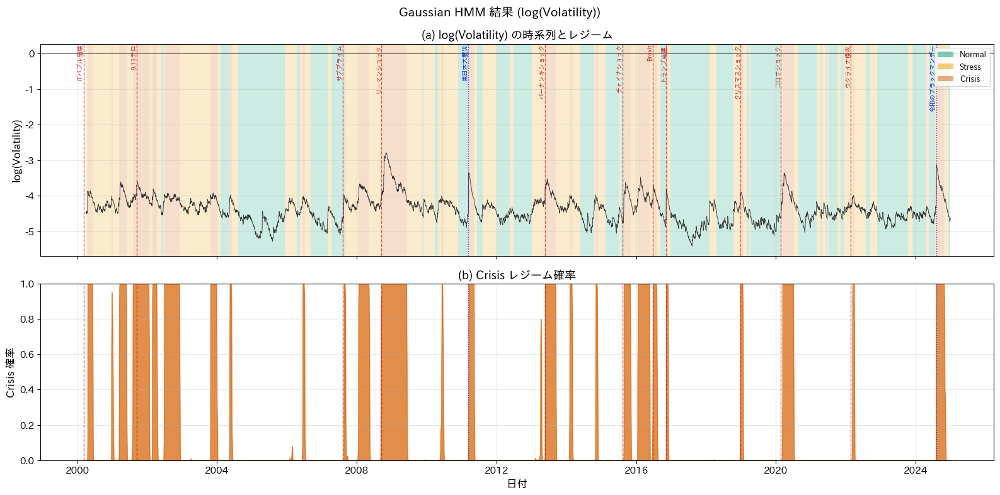

  ✅ 保存: step2_outputs/11_regime_chars_logvol.pdf


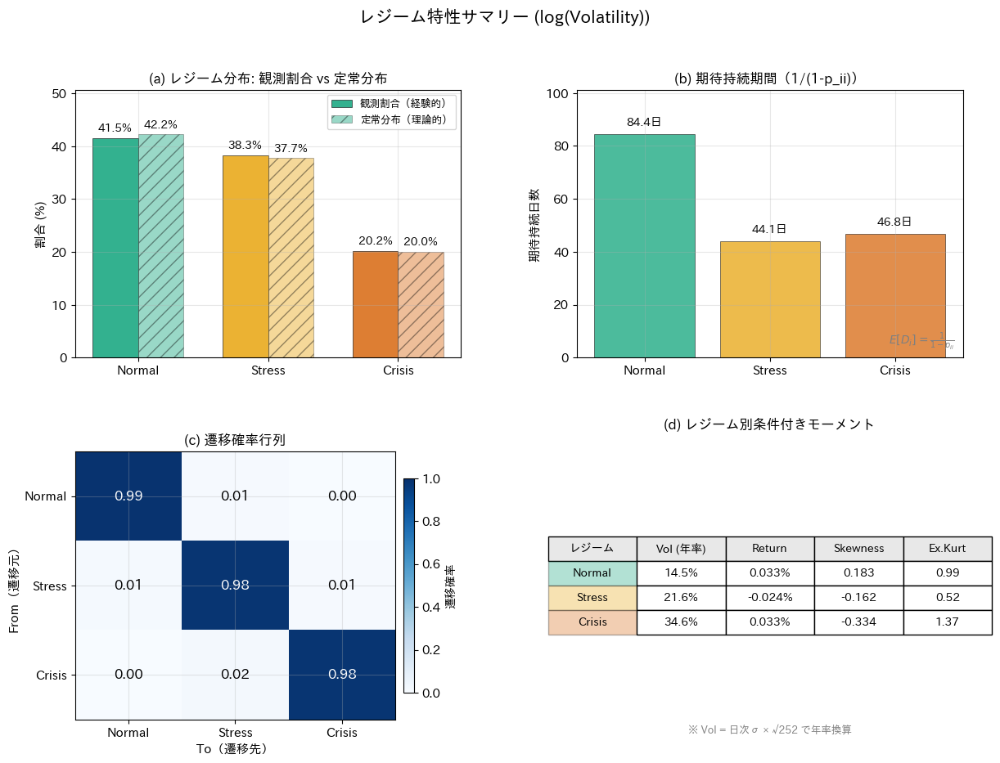

  ✅ regime_probabilities_logvol.csv

--------------------------------------------------
[Skewness] 3レジームモデル
--------------------------------------------------
  レジーム並べ替え (descending):
    Regime_1 (mean=0.6370) → Normal
    Regime_2 (mean=-0.1188) → Stress
    Regime_0 (mean=-0.9052) → Crisis

  レジーム特性:
Regime_Name  Pct_weight  Return_Mean
     Normal   37.162342     0.001207
     Stress   35.430548    -0.000247
     Crisis   27.407110    -0.000915

  期待持続期間: {'Normal': np.float64(31.33931141186766), 'Stress': np.float64(17.615196952468633), 'Crisis': np.float64(21.299807767483912)}
  定常分布: {'Normal': np.float64(0.3690941242563132), 'Stress': np.float64(0.3561387022337588), 'Crisis': np.float64(0.2747671735099279)}
  ✅ 保存: step2_outputs/10_regime_prob_skew.pdf


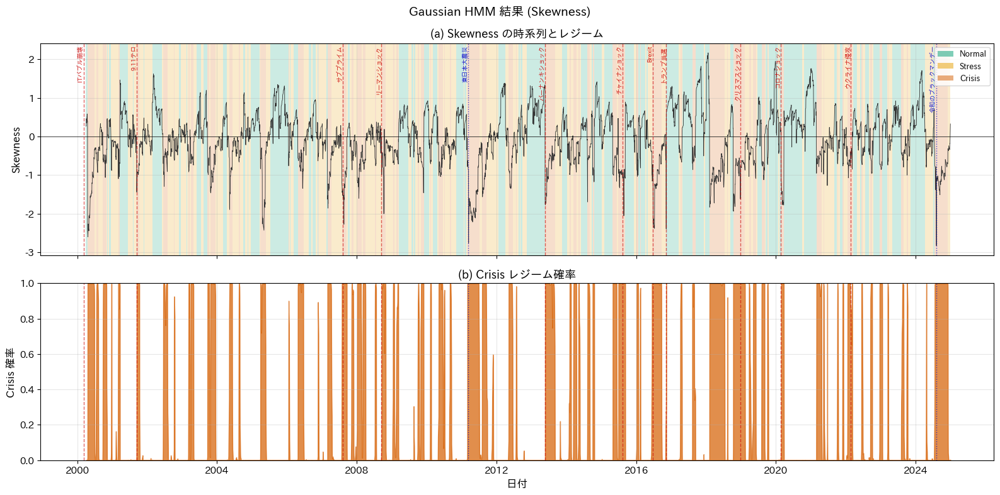

  ✅ 保存: step2_outputs/11_regime_chars_skew.pdf


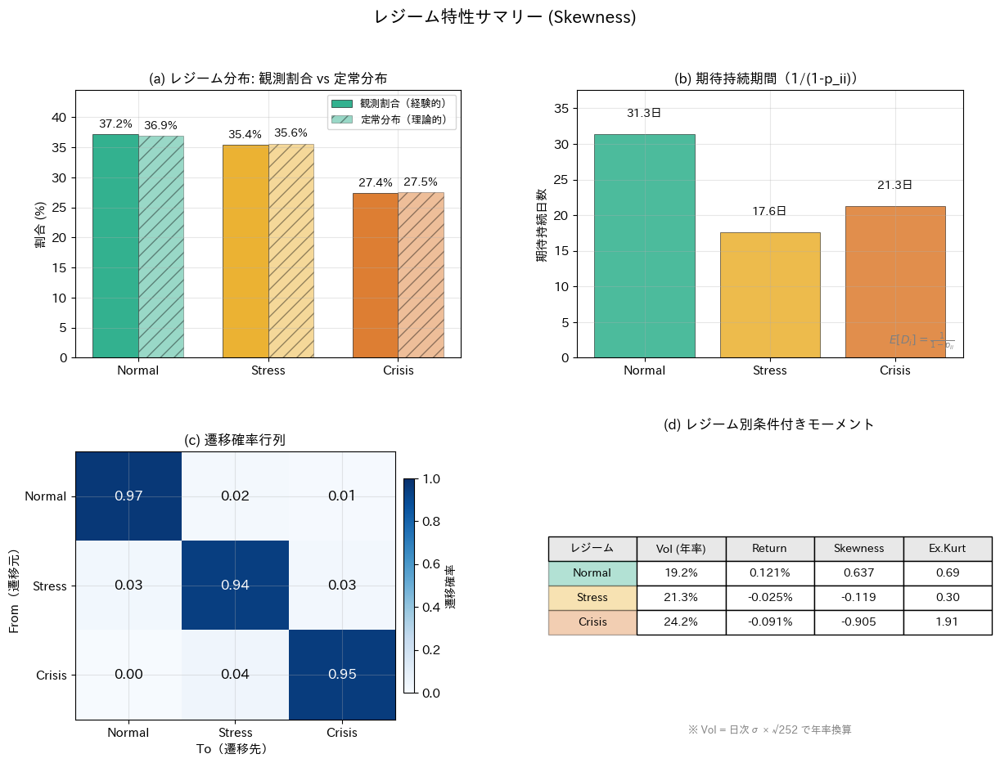

  ✅ regime_probabilities_skew.csv

--------------------------------------------------
[Excess Kurtosis] 3レジームモデル
--------------------------------------------------
  レジーム並べ替え (ascending):
    Regime_2 (mean=-0.3832) → Normal
    Regime_1 (mean=0.7073) → Stress
    Regime_0 (mean=5.0335) → Crisis

  レジーム特性:
Regime_Name  Pct_weight  Return_Mean
     Normal   45.235255     0.000310
     Stress   39.274290    -0.000109
     Crisis   15.490455     0.000082

  期待持続期間: {'Normal': np.float64(42.08843696900672), 'Stress': np.float64(26.18158084244759), 'Crisis': np.float64(28.456593422945588)}
  定常分布: {'Normal': np.float64(0.45029230027901973), 'Stress': np.float64(0.39098970321278237), 'Crisis': np.float64(0.15871799650819787)}
  ✅ 保存: step2_outputs/10_regime_prob_kurt.pdf


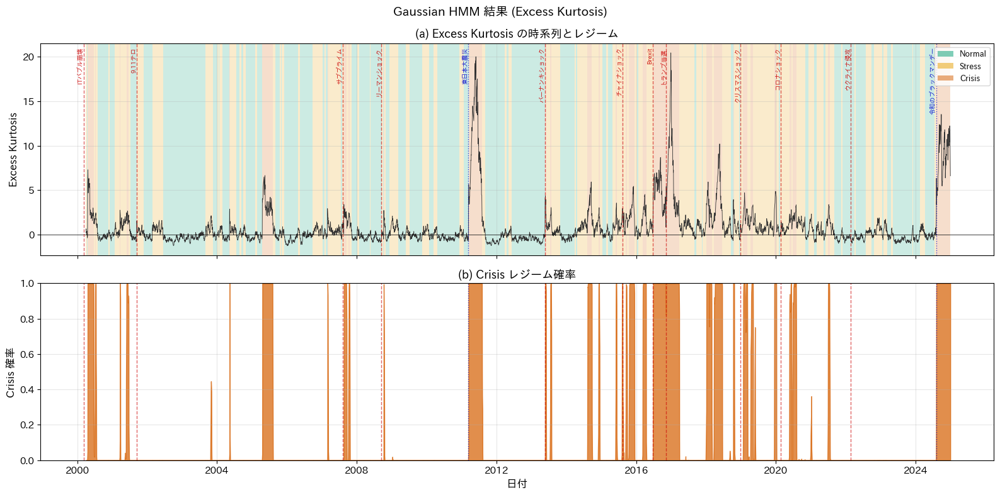

  ✅ 保存: step2_outputs/11_regime_chars_kurt.pdf


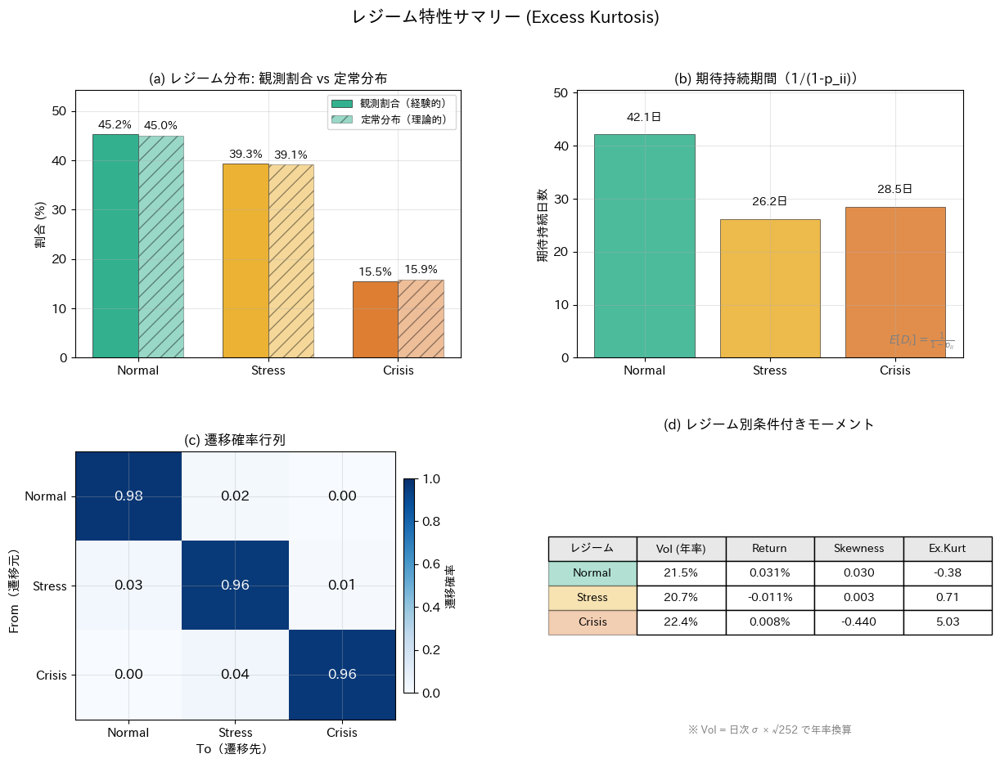

  ✅ regime_probabilities_kurt.csv

--------------------------------------------------
[SK Factor] 3レジームモデル
--------------------------------------------------
  レジーム並べ替え (ascending):
    Regime_0 (mean=-0.5910) → Normal
    Regime_2 (mean=0.0310) → Stress
    Regime_1 (mean=1.3585) → Crisis

  レジーム特性:
Regime_Name  Pct_weight  Return_Mean
     Normal   39.626591     0.001076
     Stress   44.146040    -0.000505
     Crisis   16.227370    -0.000575

  期待持続期間: {'Normal': np.float64(30.800239263735065), 'Stress': np.float64(26.418856943901083), 'Crisis': np.float64(28.609192509775117)}
  定常分布: {'Normal': np.float64(0.3917072187464857), 'Stress': np.float64(0.44186996002728507), 'Crisis': np.float64(0.1664228212262293)}
  ✅ 保存: step2_outputs/10_regime_prob_skfactor.pdf


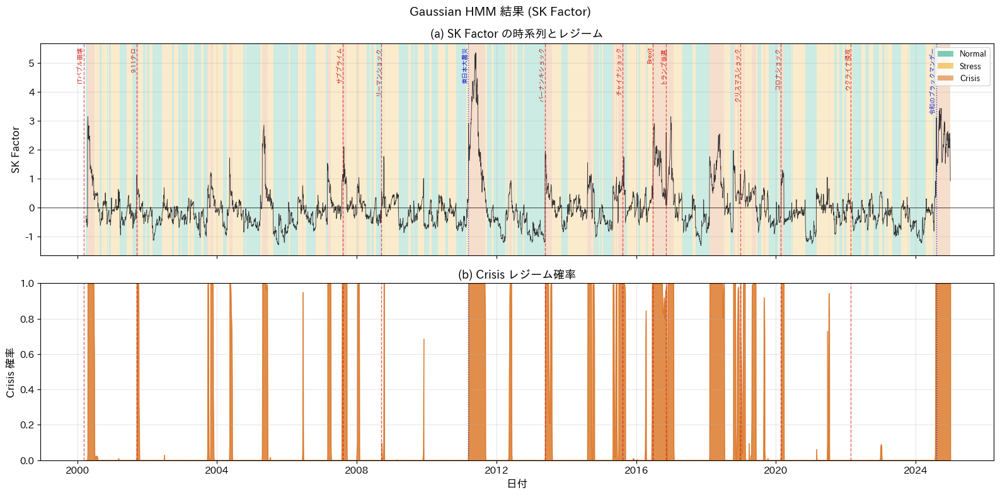

  ✅ 保存: step2_outputs/11_regime_chars_skfactor.pdf


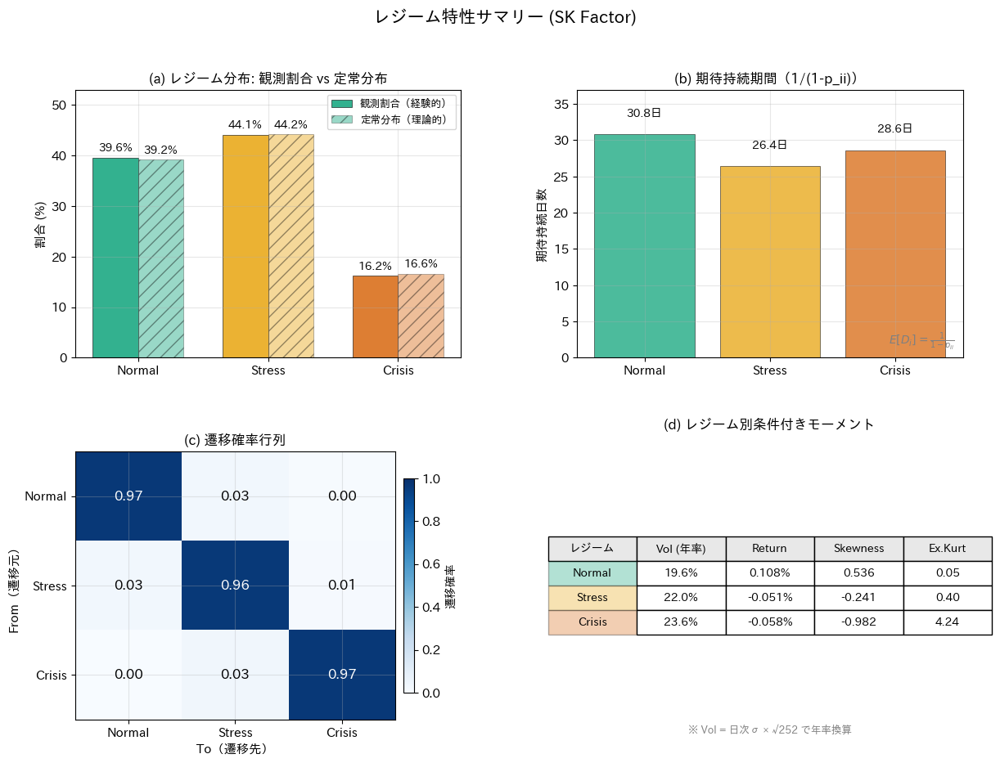

  ✅ regime_probabilities_skfactor.csv

イベント応答分析

[平均イベント応答プロット]
  ✅ 保存: step2_outputs/31_avg_event_response_all_models.pdf


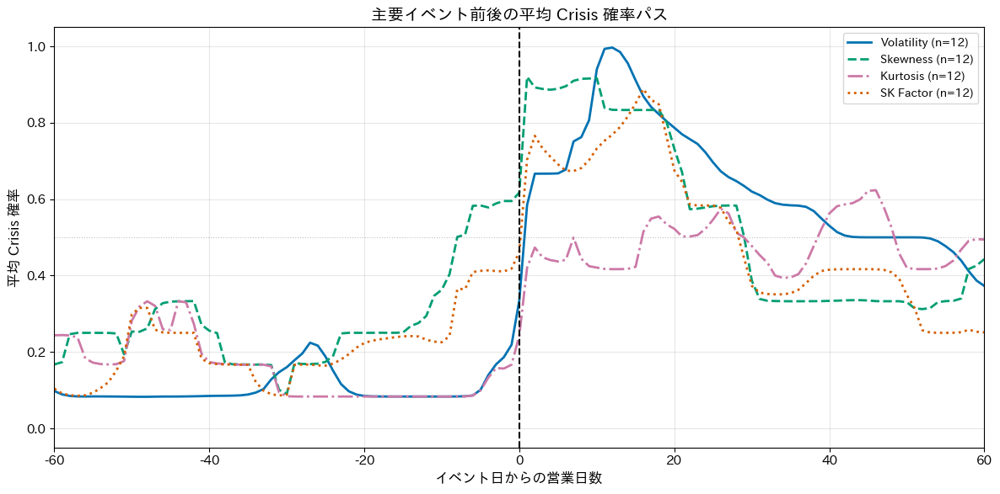


[全イベントの詳細プロット]
  - ITバブル崩壊: 対象期間外
  ✅ 9.11テロ


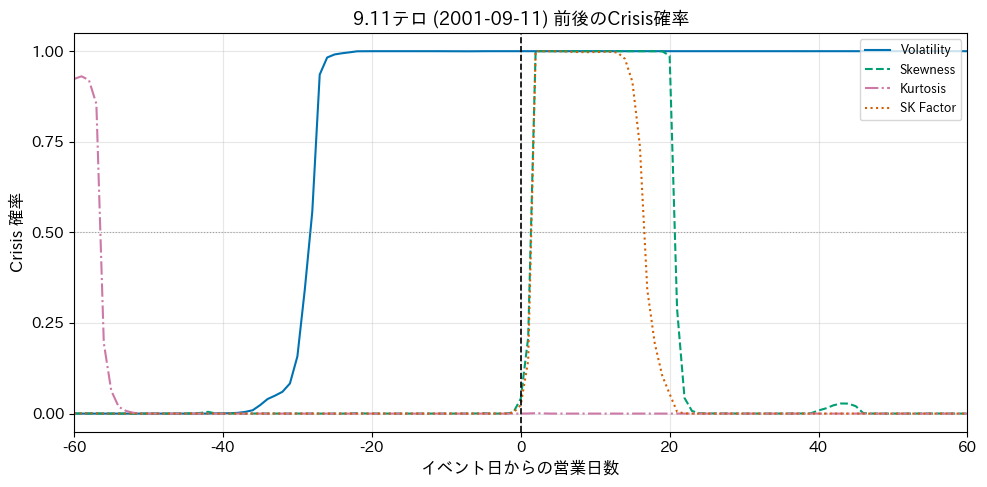

  ✅ サブプライム


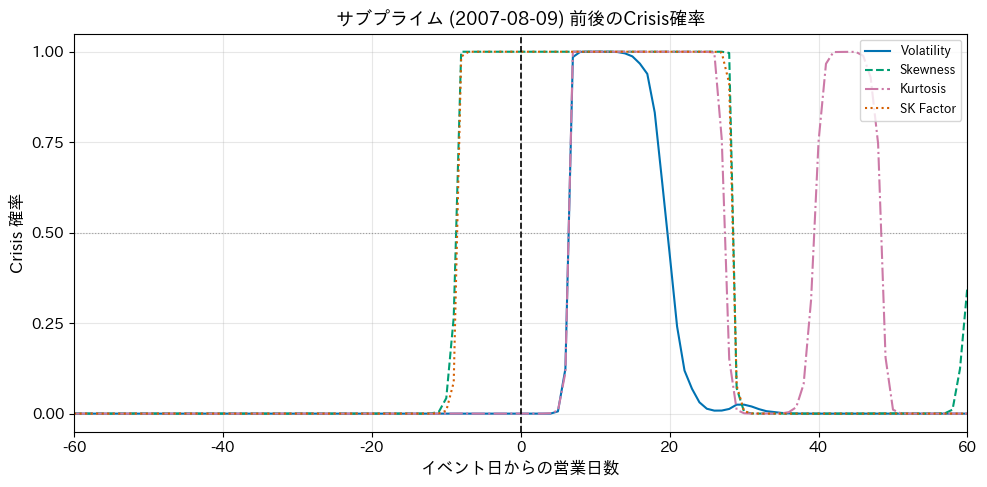

  ✅ リーマンショック


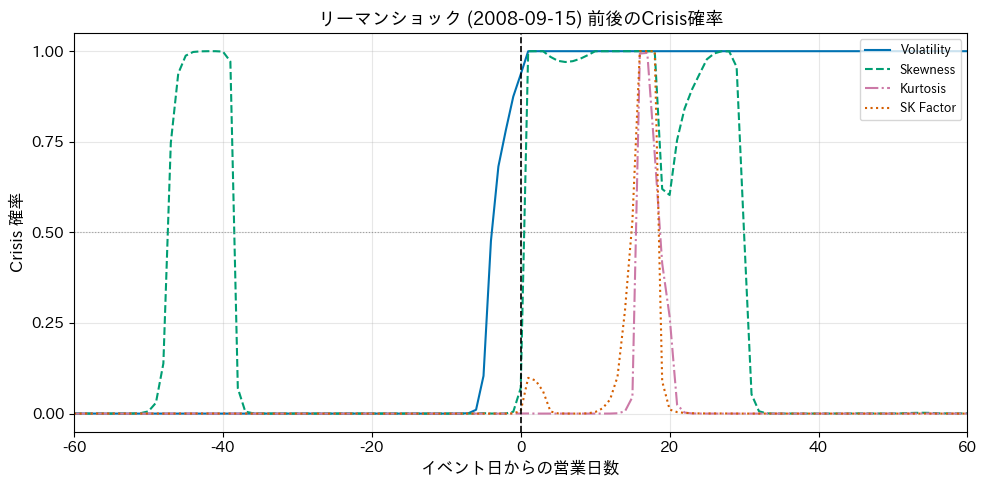

  ✅ 東日本大震災


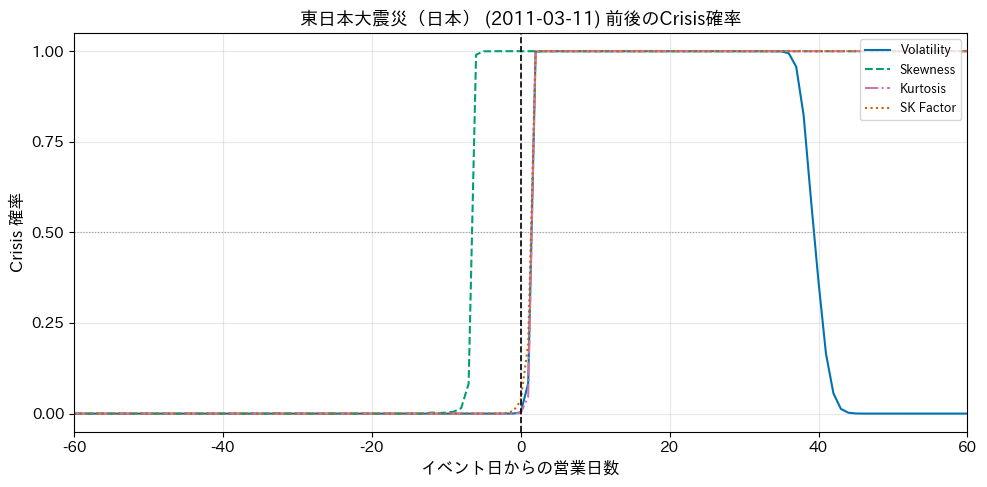

  ✅ バーナンキショック


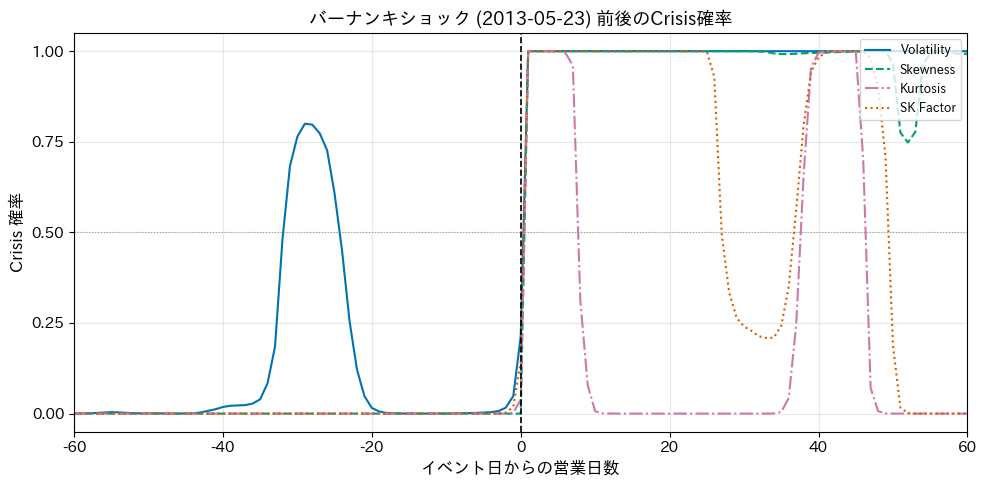

  ✅ チャイナショック


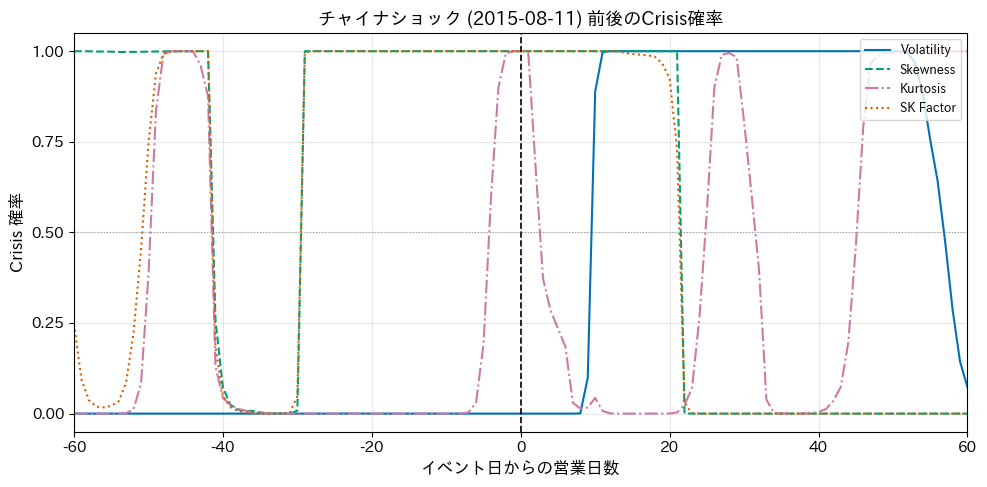

  ✅ Brexit


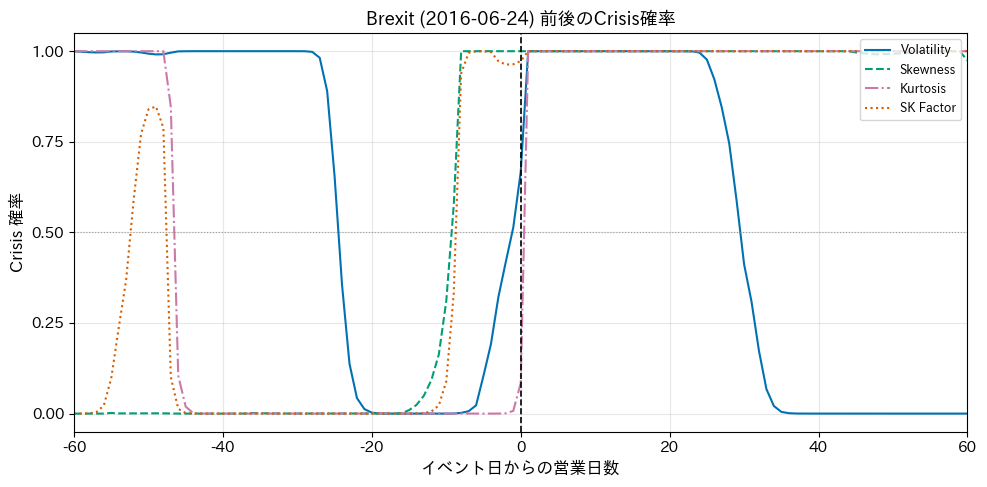

  ✅ トランプ当選


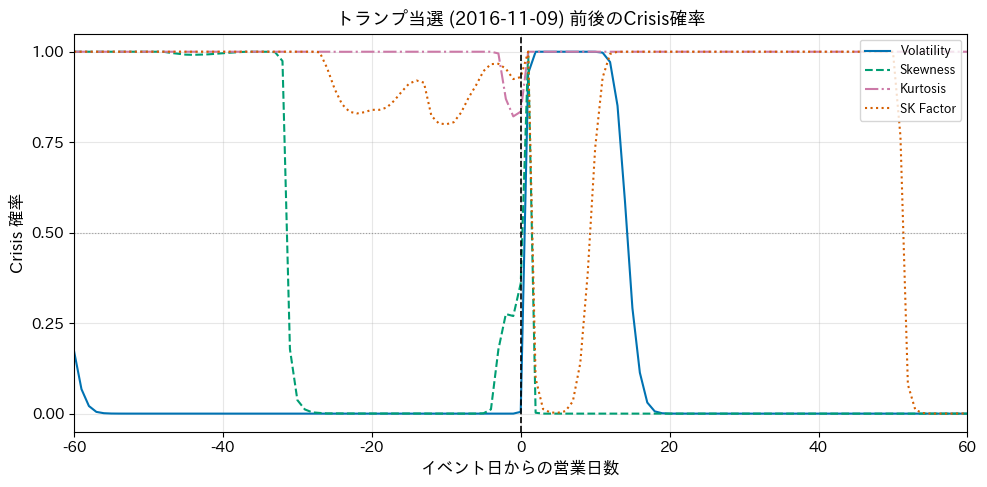

  ✅ クリスマスショック


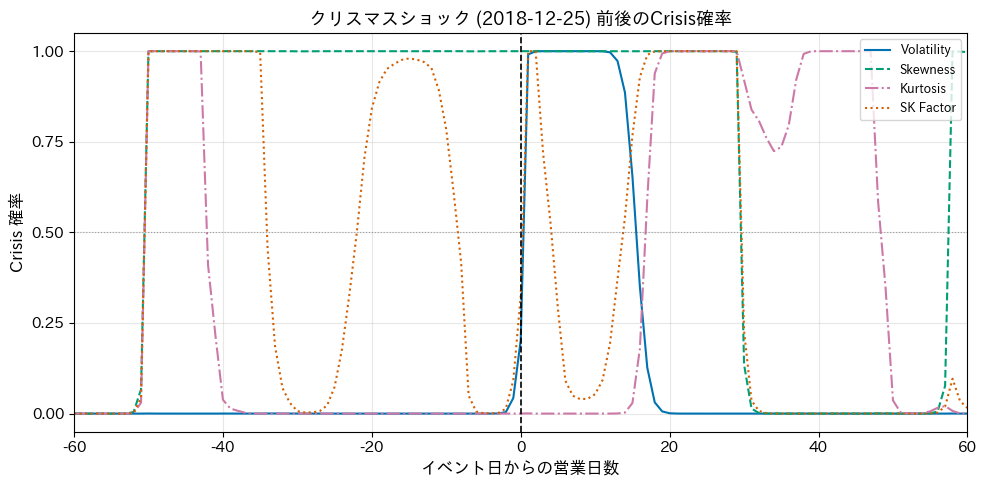

  ✅ コロナショック


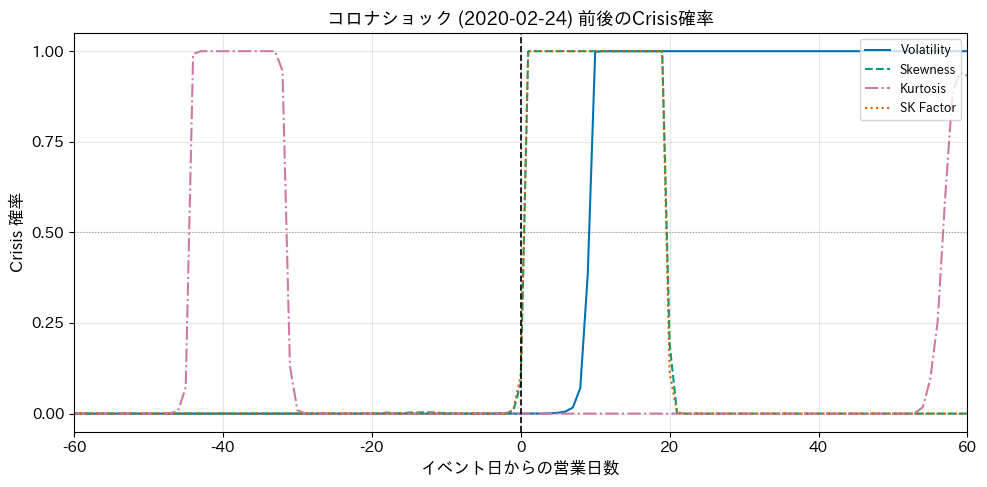

  ✅ ウクライナ侵攻


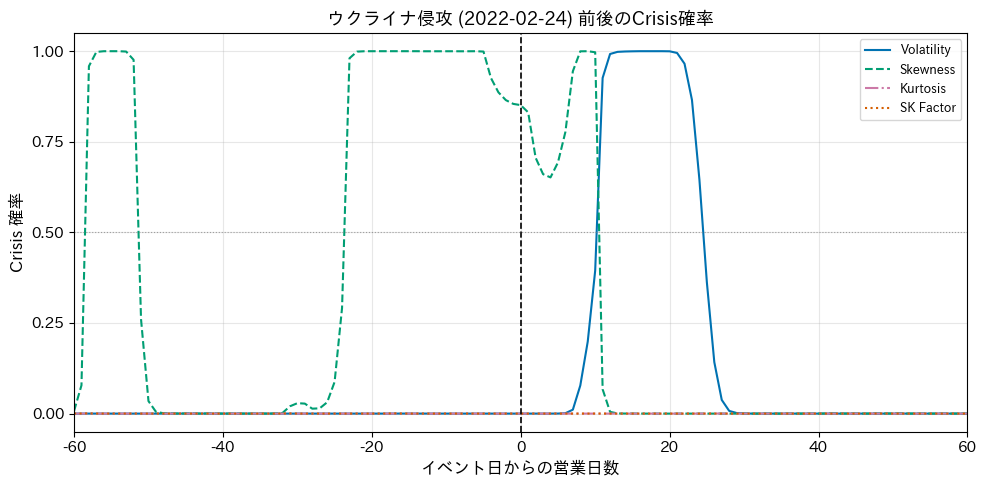

  ✅ 令和のブラックマンデー


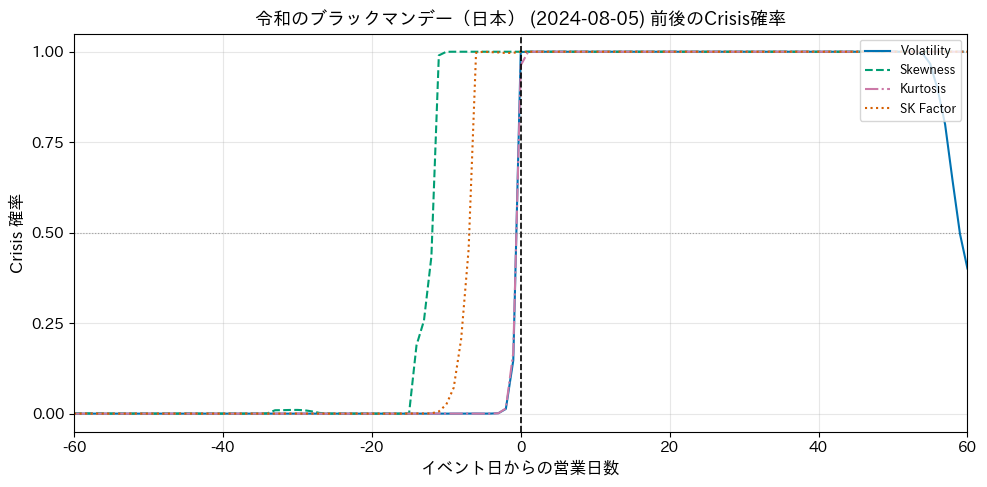

  ✅ 保存: step2_outputs/33_selected_events_grid.pdf


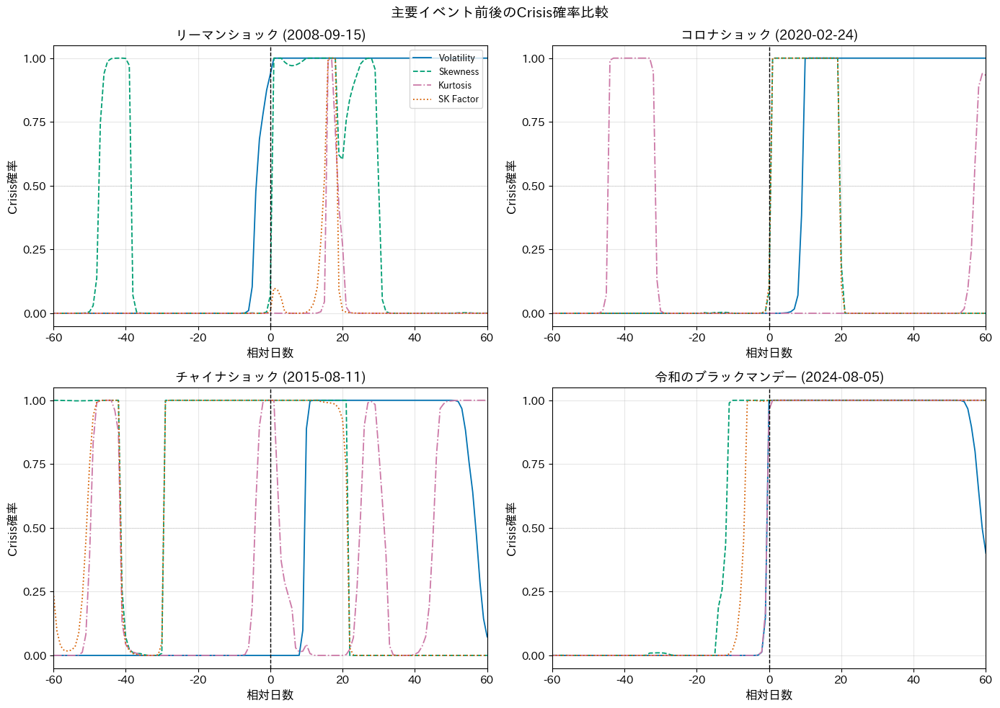


イベント前後の因子推移分析

[イベント前後の因子推移プロット]
  ✅ 9.11テロ


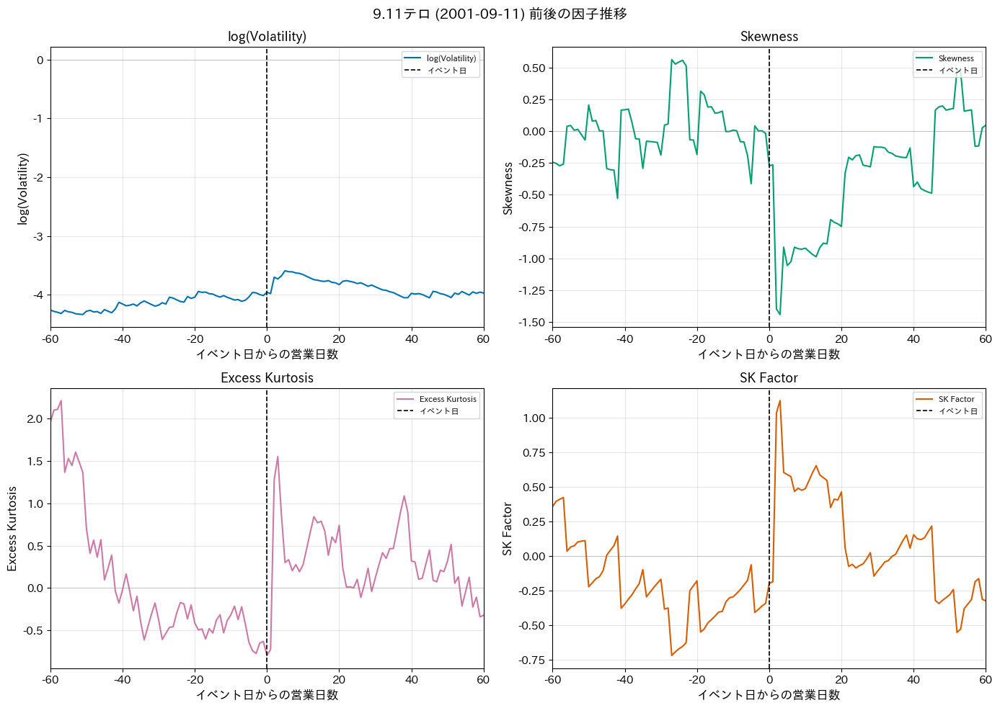

  ✅ サブプライム


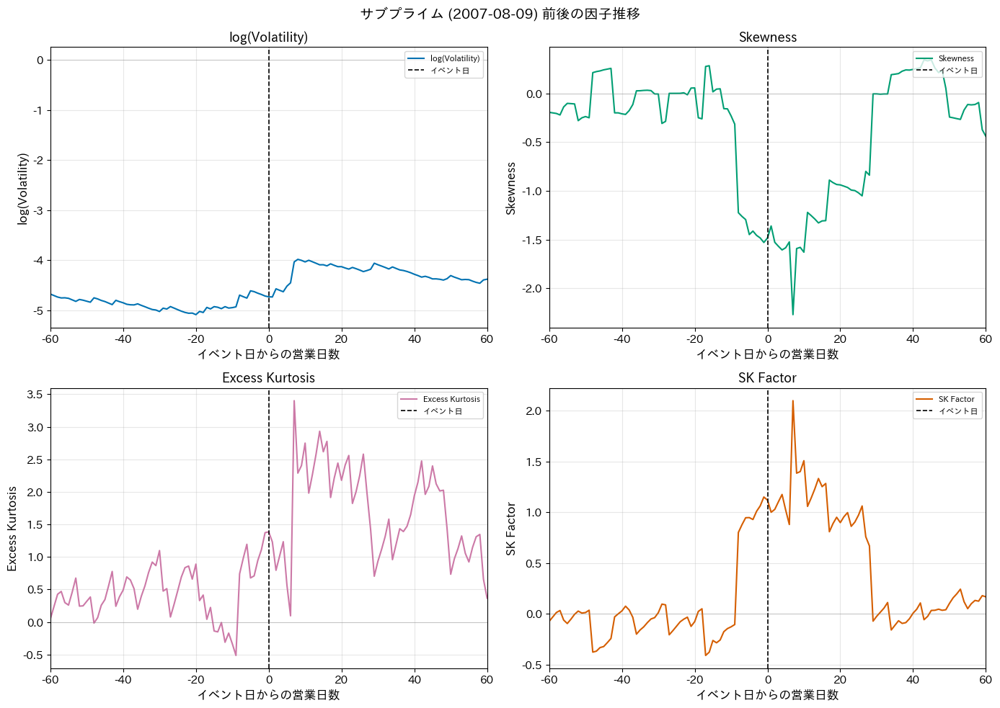

  ✅ リーマンショック


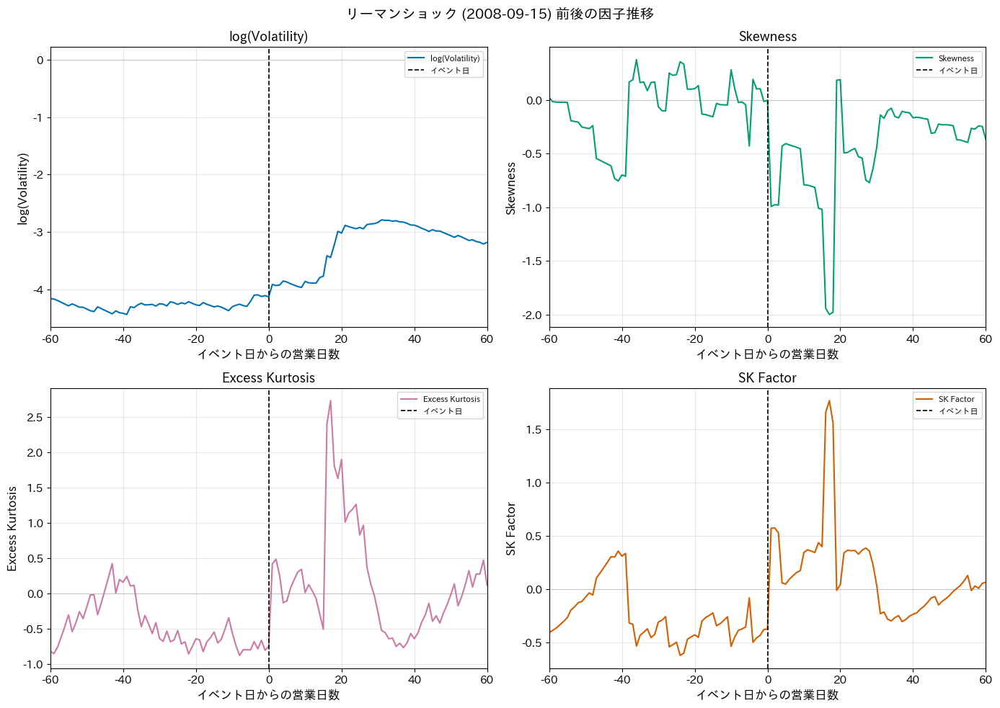

  ✅ 東日本大震災


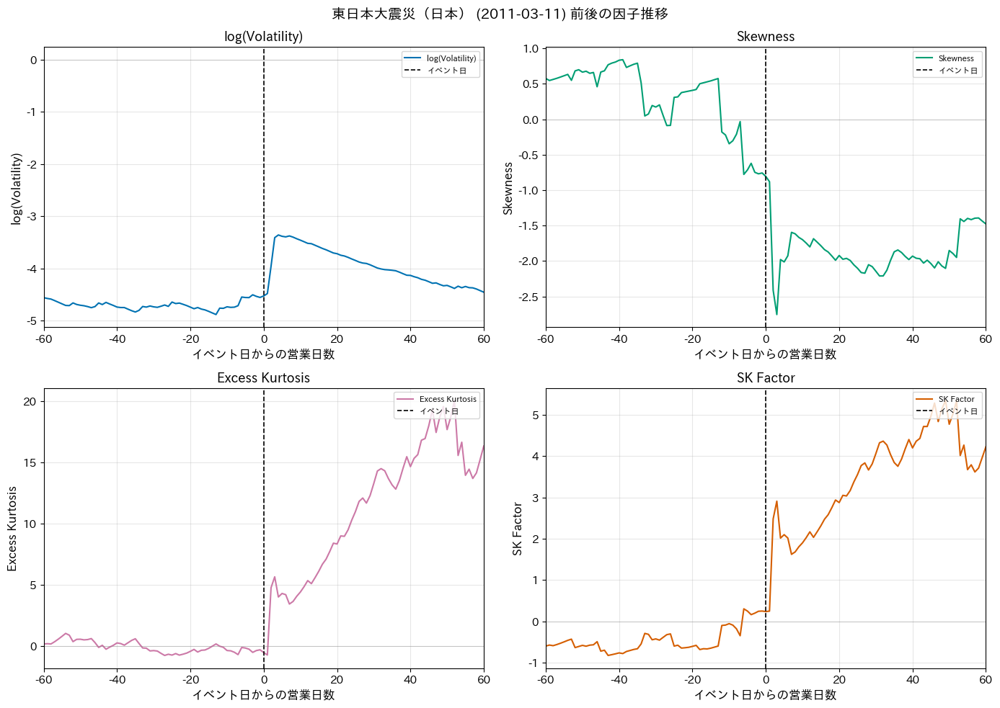

  ✅ バーナンキショック


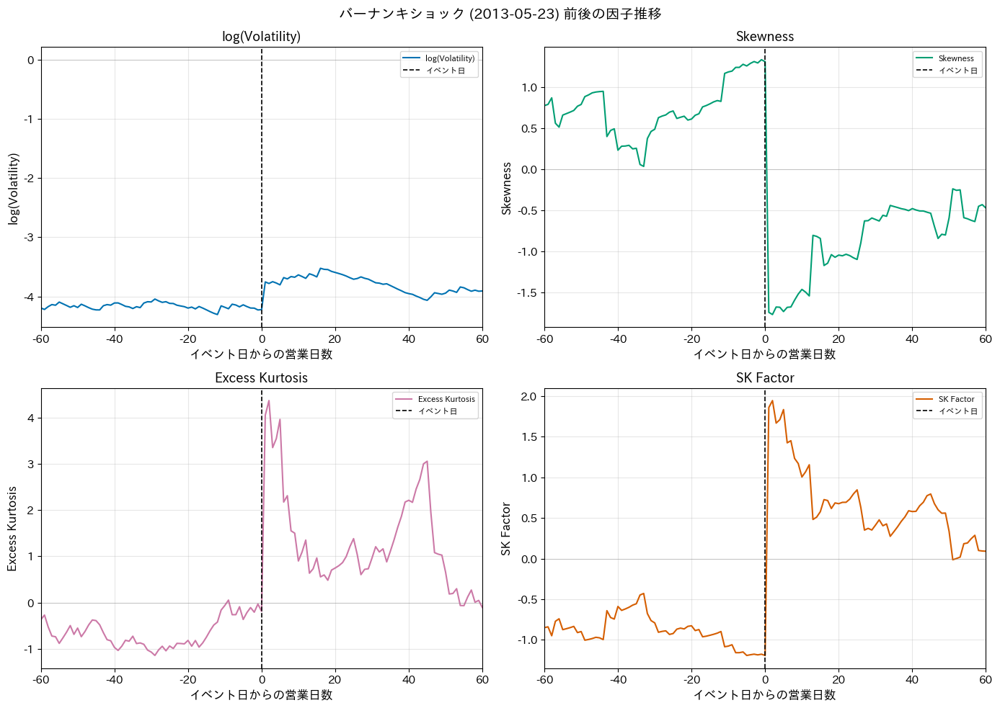

  ✅ チャイナショック


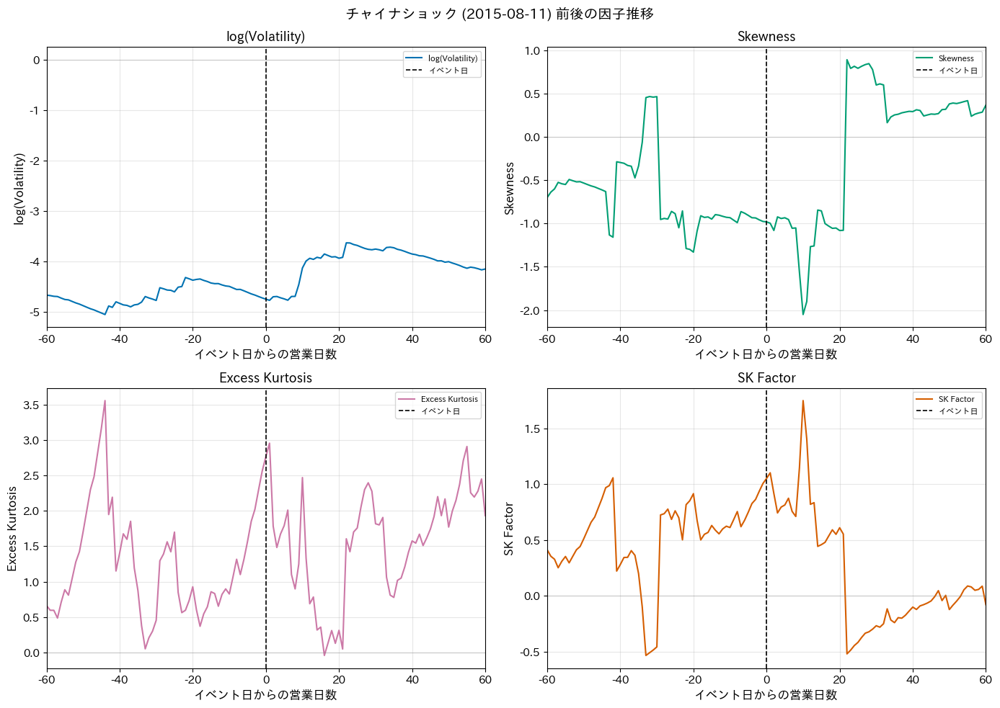

  ✅ Brexit


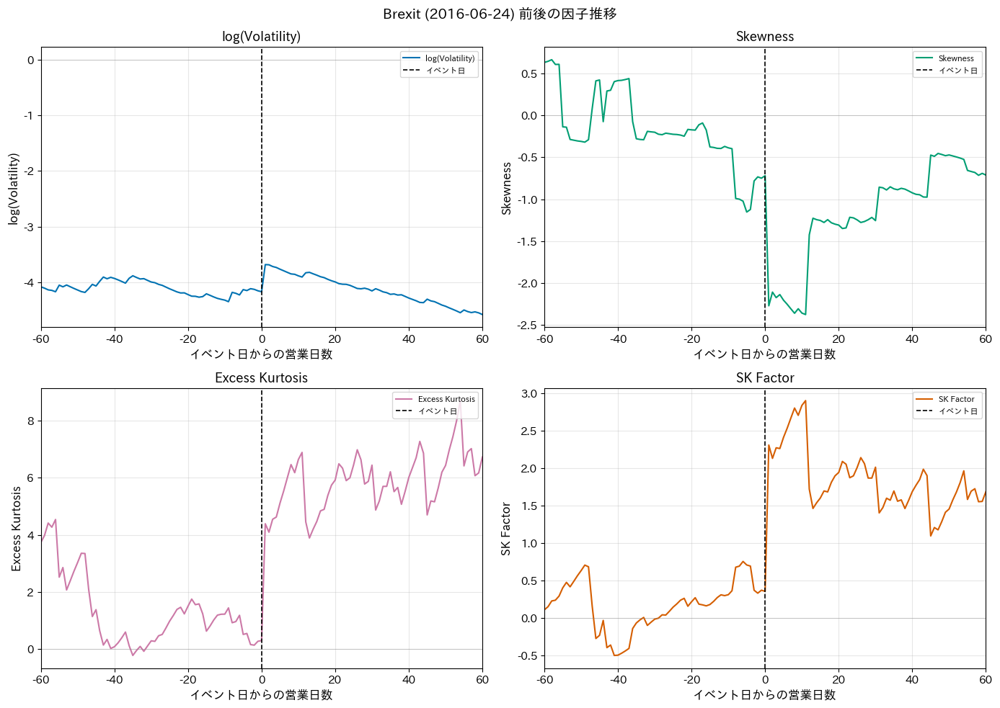

  ✅ トランプ当選


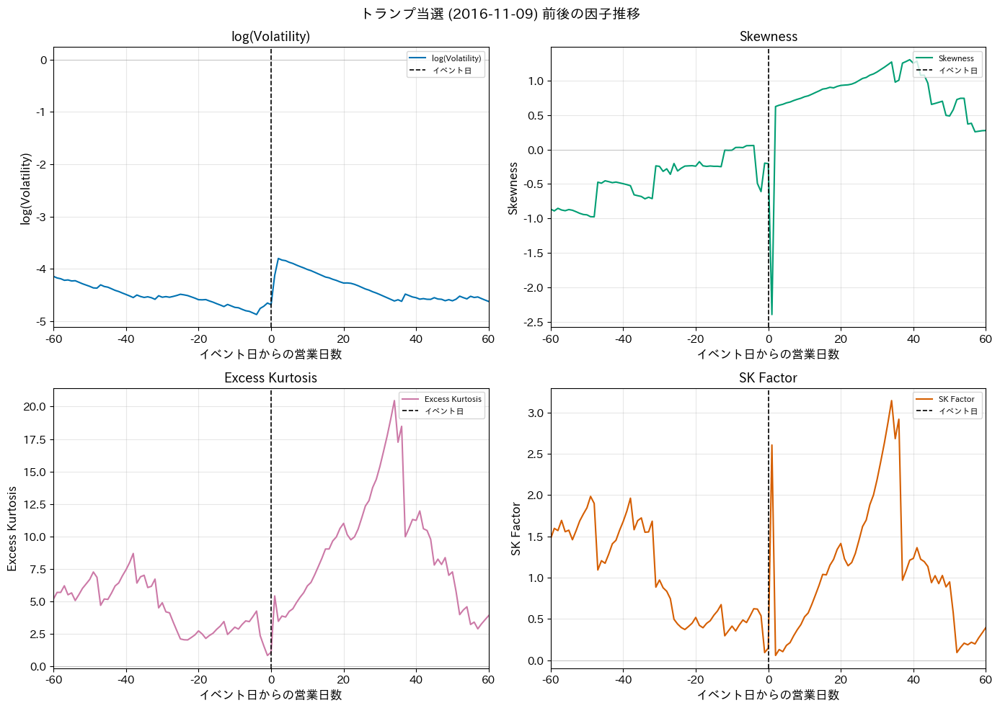

  ✅ クリスマスショック


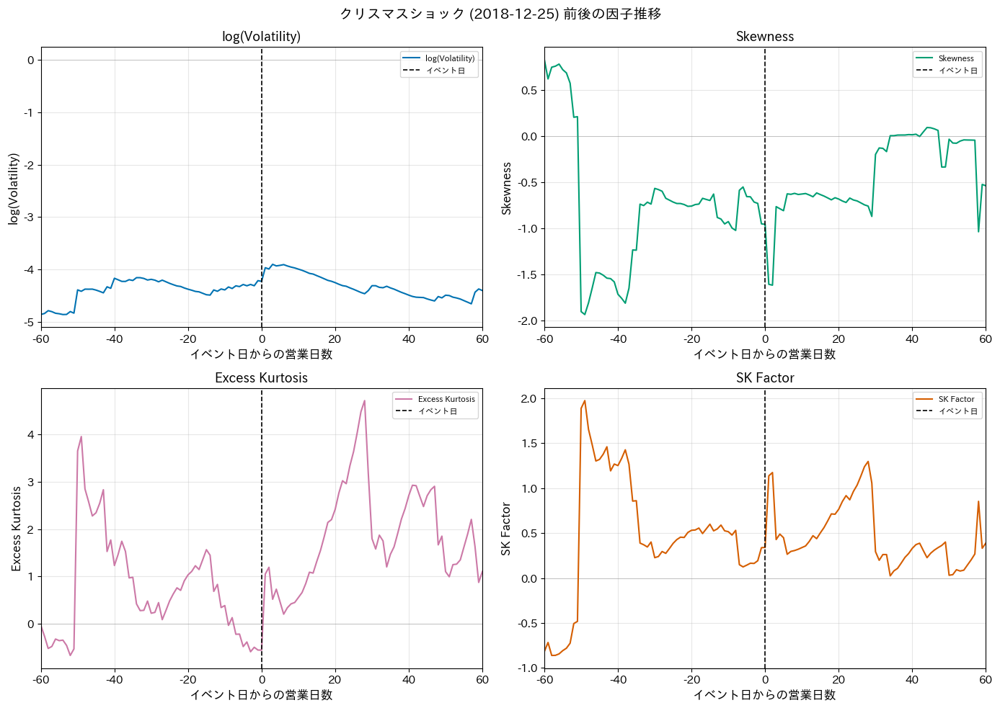

  ✅ コロナショック


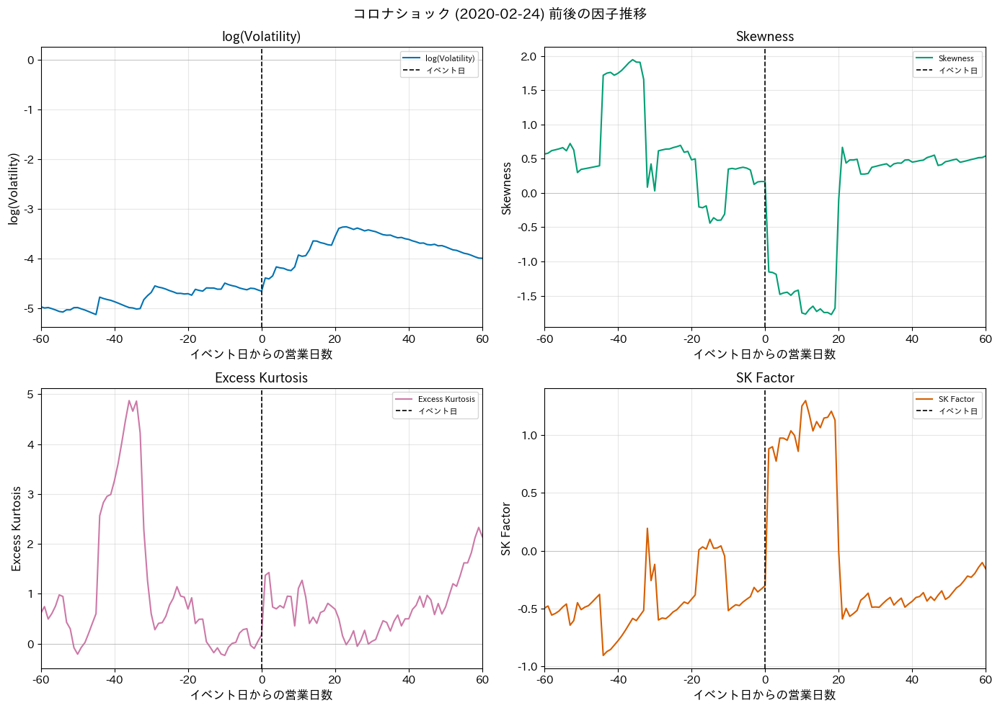

  ✅ ウクライナ侵攻


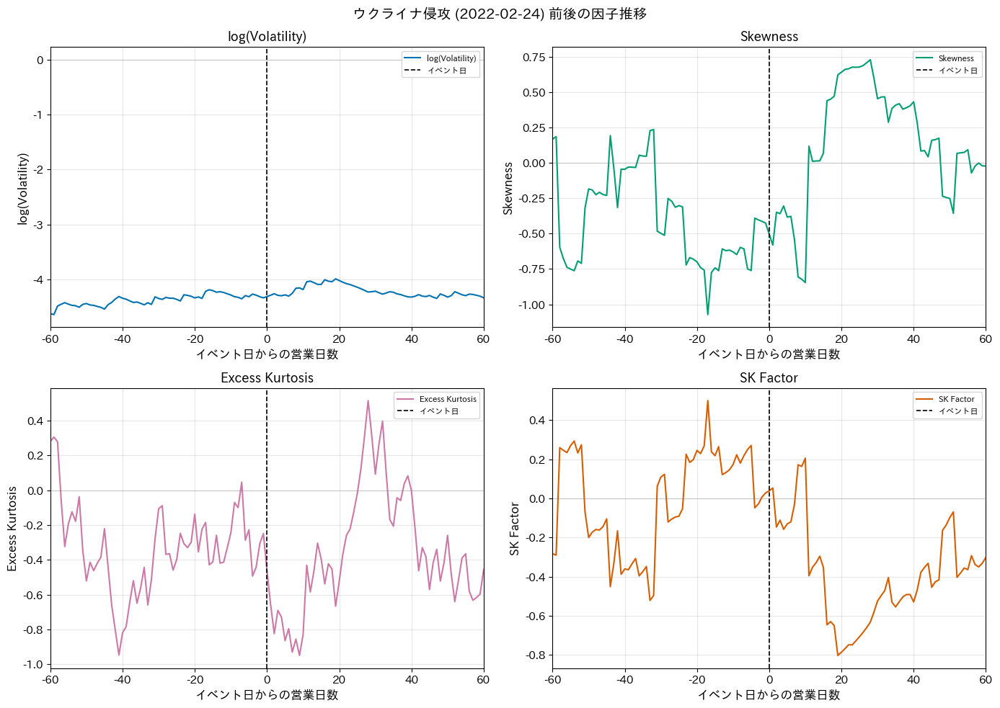

  ✅ 令和のブラックマンデー


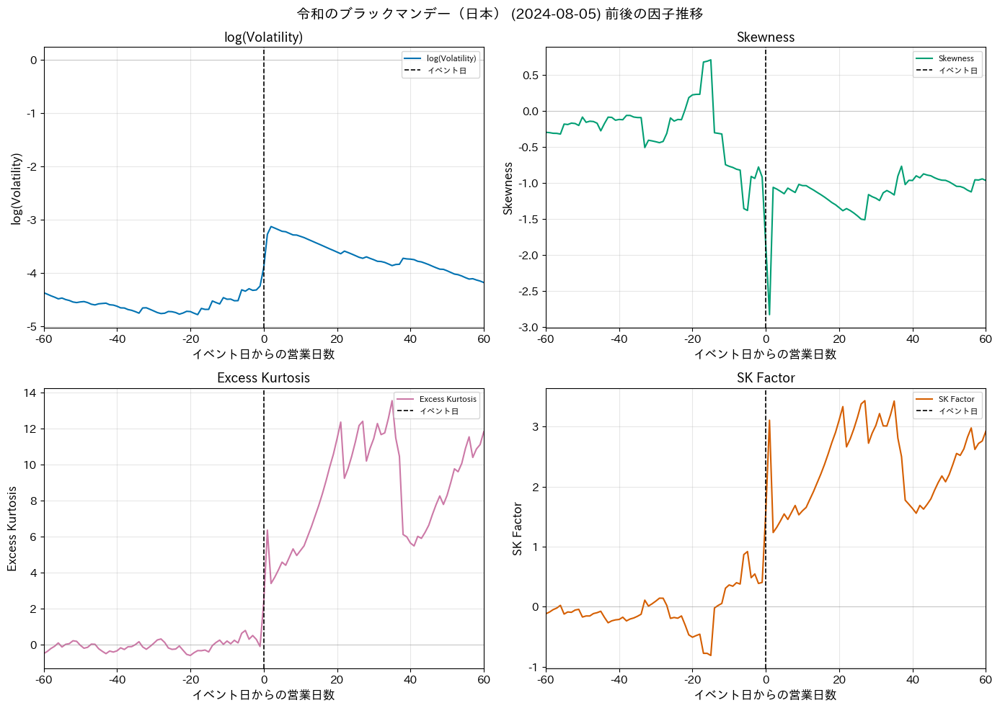


[主要イベントの因子推移グリッド]
  ✅ 保存: step2_outputs/41_selected_events_factors_grid.pdf


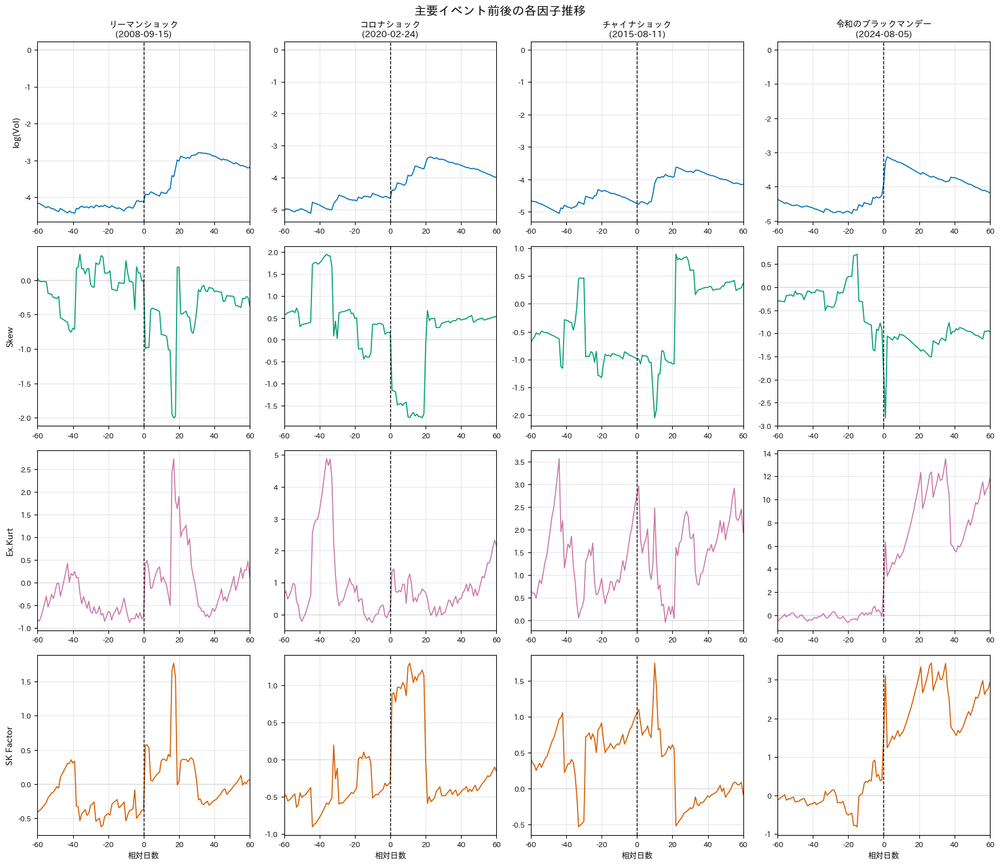


[平均因子推移プロット]
  ✅ 保存: step2_outputs/42_avg_factor_response.pdf


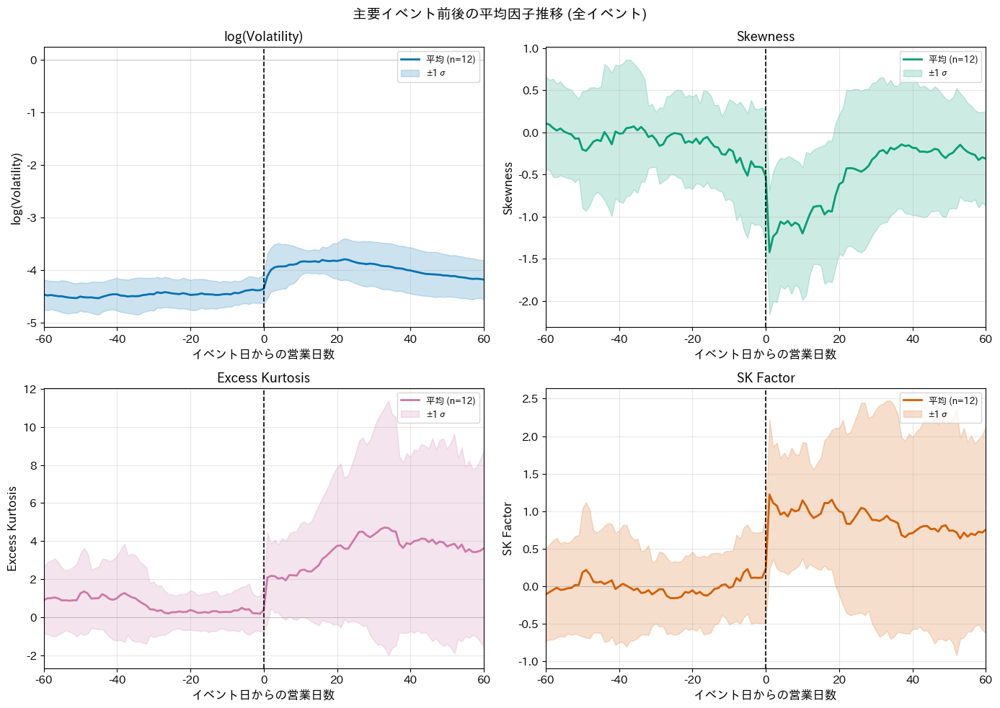


モデル間比較分析

[モデル間レジーム一致度（時系列）]
  カテゴリ別日数:
    全Normal: 523日 (8.6%)
    全Stress: 242日 (4.0%)
    全Crisis: 197日 (3.2%)
    不一致: 5104日 (84.1%)
  ✅ 保存: step2_outputs/34_regime_agreement_timeline.pdf


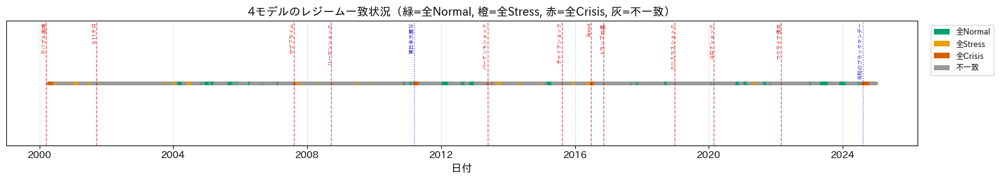

  ✅ 保存: step2_outputs/35_crisis_prob_comparison_4models.pdf


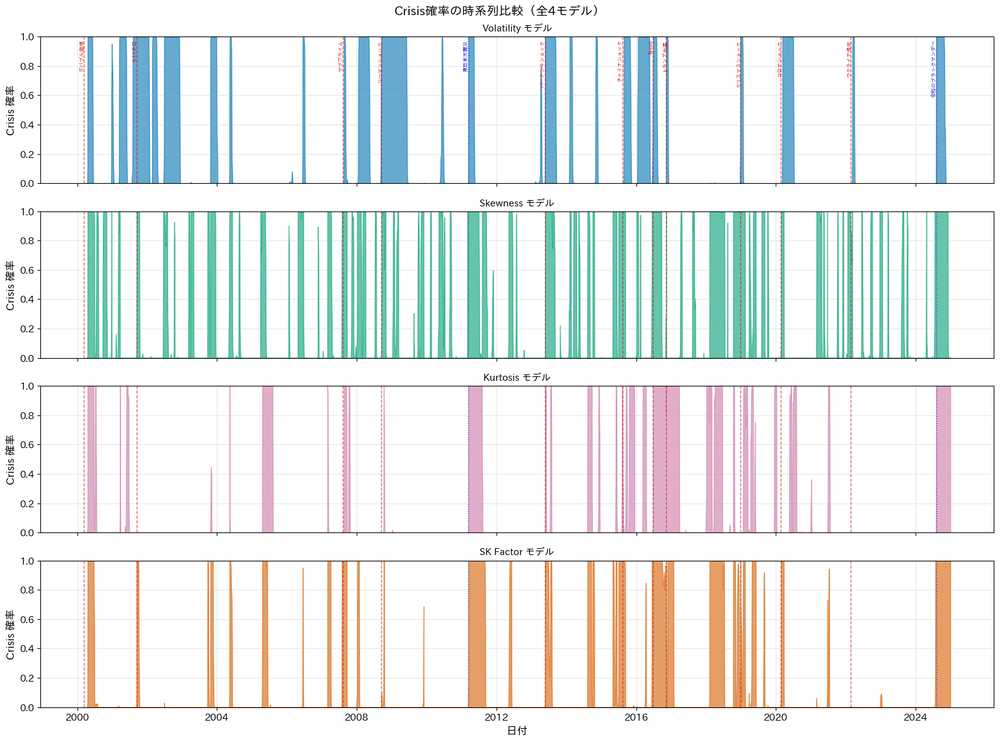


追加分析（論文用）

[条件付きリターン分布]
  ✅ 保存: step2_outputs/36_conditional_return_distribution.pdf


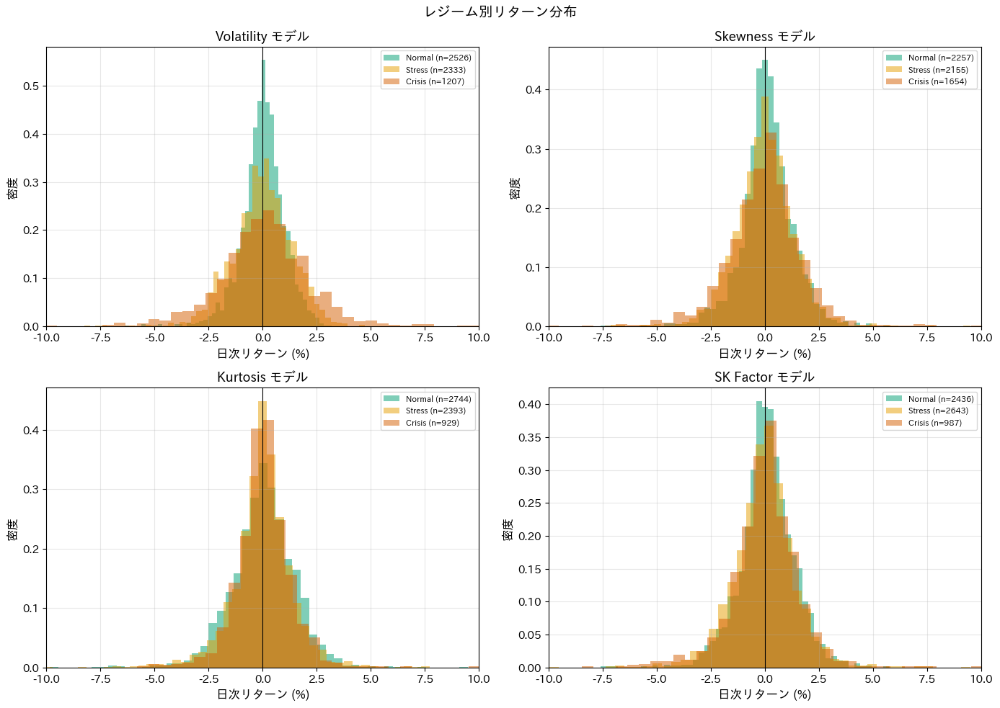


[モーメント空間でのレジーム可視化]
  ✅ 保存: step2_outputs/37_moment_space_regimes.pdf


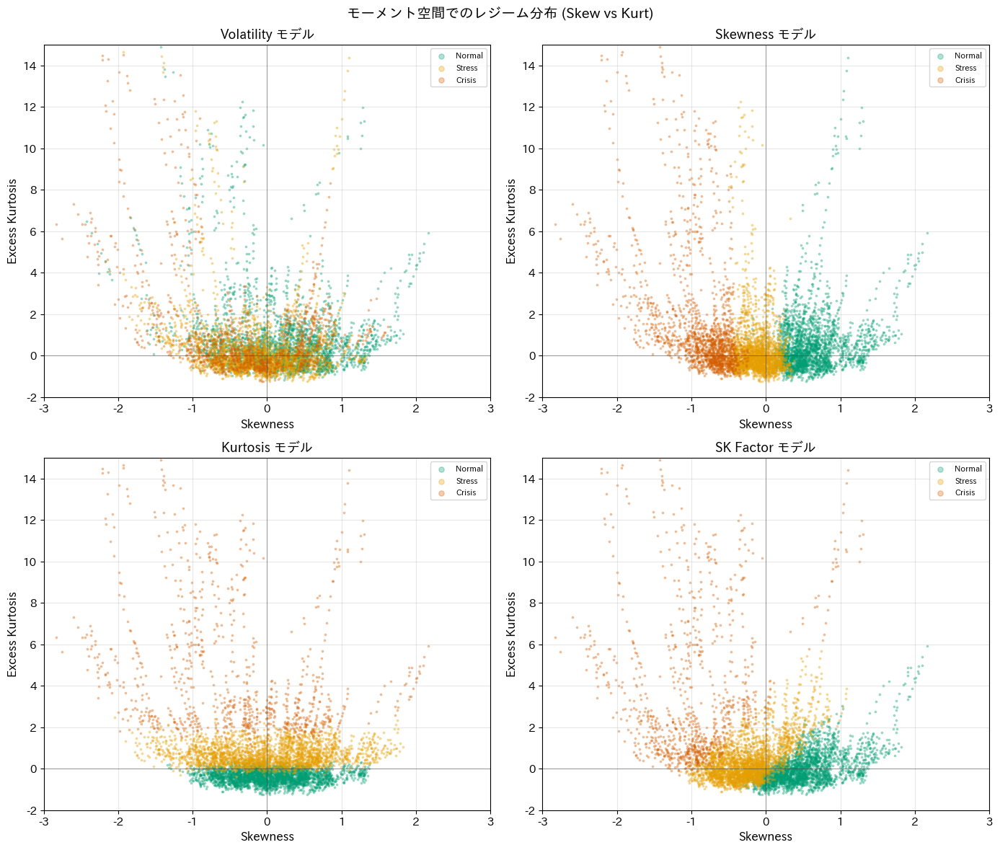


[累積Crisis日数]
  ✅ 保存: step2_outputs/38_cumulative_crisis_days.pdf


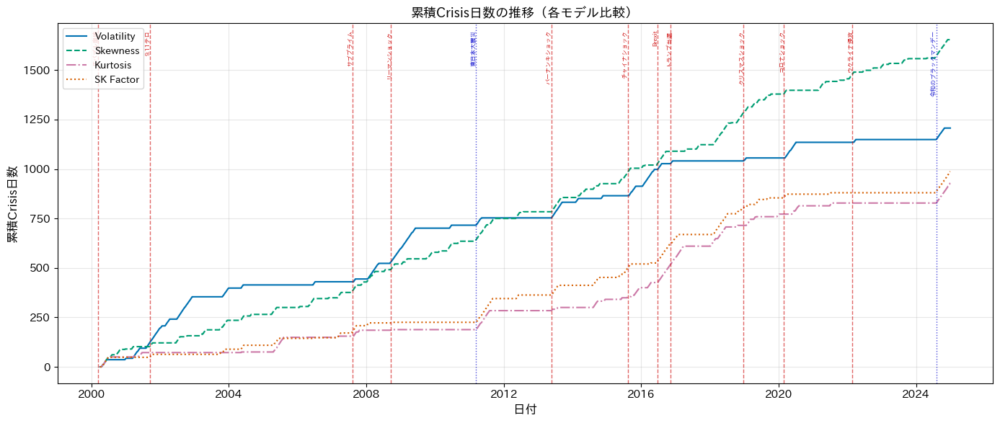


[LaTeX用サマリー表]
  ✅ table_regime_characteristics_logvol.tex 保存
  ✅ table_regime_characteristics_skew.tex 保存
  ✅ table_regime_characteristics_kurt.tex 保存
  ✅ table_regime_characteristics_skfactor.tex 保存

Step 2 完了サマリー
  出力ディレクトリ: /content/step2_outputs

  主要な出力ファイル:
    [基本分析]
      10-11_regime_*: 各モデルのレジーム分析（可視化改善版）
    [イベント応答分析]
      31_avg_event_response_all_models.pdf
    [イベント詳細]
      32_event_*.pdf: 全イベントの詳細プロット
      33_selected_events_grid.pdf
    [イベント前後の因子推移]
      40_factors_*.pdf: 各イベントの因子推移
      41_selected_events_factors_grid.pdf
      42_avg_factor_response.pdf
    [モデル比較]
      34_regime_agreement_timeline.pdf
      35_crisis_prob_comparison_4models.pdf
    [追加分析]
      36_conditional_return_distribution.pdf
      37_moment_space_regimes.pdf
      38_cumulative_crisis_days.pdf
    [LaTeX用]
      table_*.tex


In [ ]:
"""
卒業論文：リターン分布形状のレジームダイナミクス分析
Step 2: 3レジーム Gaussian HMM 分析（完全統合版）- 可視化改善版

【改善点】
  - レジーム特性プロットの視認性向上
  - 観測割合と定常分布の比較を明示
  - 期待持続期間を独立したサブプロットに
  - 文字重なりの解消

【主な機能】
  1. 4つの危機因子（logVol, Skew, Kurt, SKFactor）でHMM推定
  2. 全イベントでの前後Crisis確率プロット
  3. イベント前後での各因子（Vol, Skew, Kurt, SK）の推移
  4. モデル間比較（時系列カラーマップ）
  5. 条件付きリターン分布・モーメント空間可視化
  6. LaTeX用サマリー表の出力
"""

!pip install hmmlearn

from __future__ import annotations

import copy
import shutil
import warnings
from dataclasses import dataclass, field
from pathlib import Path
from typing import Optional

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap
from hmmlearn.hmm import GaussianHMM
from scipy import stats

# ============================================================================
# 0. matplotlib 設定
# ============================================================================

warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', message='KMeans is known to have a memory leak')


def setup_matplotlib():
    """matplotlib の日本語フォント設定"""
    import matplotlib.font_manager as fm

    plt.rcParams.update({
        'axes.unicode_minus': False,
        'font.size': 11,
        'axes.titlesize': 13,
        'axes.labelsize': 12,
        'figure.dpi': 100,
        'savefig.dpi': 300,
        'savefig.bbox': 'tight',
        'axes.grid': True,
        'grid.alpha': 0.3,
        'figure.facecolor': 'white',
        'axes.facecolor': 'white',
        'figure.autolayout': False,
    })

    jp_fonts = ['IPAexGothic', 'Hiragino Sans', 'Yu Gothic', 'Meiryo', 'MS Gothic']
    available_fonts = [f.name for f in fm.fontManager.ttflist]

    for font in jp_fonts:
        if font in available_fonts:
            plt.rcParams['font.family'] = font
            print(f"  日本語フォント設定: {font}")
            return

    print("  ⚠️ 日本語フォントが見つかりません")


# ============================================================================
# 1. 設定クラスとイベント一覧
# ============================================================================

@dataclass
class Config:
    input_file: str = "ewma_moments_nikkei.csv"
    output_dir: str = "step2_outputs"

    regime_candidates: tuple[int, ...] = (2, 3, 4)
    n_states: int = 3
    n_init: int = 10
    n_iter: int = 1000
    random_state: int = 42
    convergence_tol: float = 1e-4

    regime_names: dict[int, str] = field(default_factory=lambda: {
        0: "Normal",
        1: "Stress",
        2: "Crisis",
    })

    # 色覚バリアフリー対応
    regime_colors: dict[int, str] = field(default_factory=lambda: {
        0: "#009E73",  # 緑
        1: "#E69F00",  # オレンジ
        2: "#D55E00",  # 赤
    })


# ユーザー指定のイベント一覧
EVENTS = [
    {"name": "ITバブル崩壊", "date": "2000-03-10", "region": "global"},
    {"name": "9.11テロ", "date": "2001-09-11", "region": "global"},
    {"name": "サブプライム", "date": "2007-08-09", "region": "global"},
    {"name": "リーマンショック", "date": "2008-09-15", "region": "global"},
    {"name": "東日本大震災", "date": "2011-03-11", "region": "japan"},
    {"name": "バーナンキショック", "date": "2013-05-23", "region": "global"},
    {"name": "チャイナショック", "date": "2015-08-11", "region": "global"},
    {"name": "Brexit", "date": "2016-06-24", "region": "global"},
    {"name": "トランプ当選", "date": "2016-11-09", "region": "global"},
    {"name": "クリスマスショック", "date": "2018-12-25", "region": "global"},
    {"name": "コロナショック", "date": "2020-02-24", "region": "global"},
    {"name": "ウクライナ侵攻", "date": "2022-02-24", "region": "global"},
    {"name": "令和のブラックマンデー", "date": "2024-08-05", "region": "japan"},
]


# モデル表示設定
MODEL_INFO = {
    "logvol": {"label": "Volatility", "color": "#0072B2", "linestyle": "-"},
    "skew":   {"label": "Skewness",   "color": "#009E73", "linestyle": "--"},
    "kurt":   {"label": "Kurtosis",   "color": "#CC79A7", "linestyle": "-."},
    "skfactor": {"label": "SK Factor", "color": "#D55E00", "linestyle": ":"},
}


# ============================================================================
# 2. イベント線描画（画像スタイル準拠）
# ============================================================================

def add_event_lines(ax, show_labels: bool = True, label_fontsize: int = 7):
    """
    イベント線を描画（画像のスタイルに準拠）
    - global: 赤の破線
    - japan: 青の点線
    """
    ymin, ymax = ax.get_ylim()

    for ev in EVENTS:
        dt = pd.Timestamp(ev["date"])
        region = ev.get("region", "global")

        if region == "japan":
            color = "#0000CC"  # 青
            linestyle = ":"
            alpha = 0.7
        else:
            color = "#CC0000"  # 赤
            linestyle = "--"
            alpha = 0.6

        ax.axvline(dt, color=color, ls=linestyle, alpha=alpha, lw=1.0)

        if show_labels:
            # 縦書き風にイベント名を表示
            ax.text(dt, ymax * 0.98, ev["name"],
                    fontsize=label_fontsize,
                    rotation=90, ha="right", va="top",
                    color=color, alpha=0.9)


def add_event_lines_relative(ax, event_day: int = 0, show_label: bool = True):
    """相対日数プロットでのイベント日マーカー"""
    ax.axvline(event_day, color="black", lw=1.5, ls="--")
    if show_label:
        ax.text(event_day + 1, ax.get_ylim()[1] * 0.95, "イベント日",
                fontsize=9, va="top")


# ============================================================================
# 3. データ読み込みと危機因子構築
# ============================================================================

def load_data(config: Config) -> pd.DataFrame | None:
    print("\n[データ読み込み]")
    path = Path(config.input_file)

    if not path.exists():
        print(f"  ❌ {path} が見つかりません")
        return None

    try:
        df = pd.read_csv(path, index_col=0, parse_dates=True)

        required_cols = ['Return', 'Skewness', 'ExcessKurtosis', 'Variance']
        missing = [c for c in required_cols if c not in df.columns]
        if missing:
            print(f"  ❌ 必須列が不足: {missing}")
            return None

        df = df.dropna(subset=required_cols)
        print(f"  ✅ 読み込み完了: {len(df):,} 行")
        print(f"  期間: {df.index[0].date()} ～ {df.index[-1].date()}")
        return df

    except Exception as e:
        print(f"  ❌ 読み込みエラー: {e}")
        return None


def construct_factors(df: pd.DataFrame) -> pd.DataFrame:
    """危機因子の構築"""
    print("\n[危機因子の構築]")

    variance = df["Variance"].copy()
    vol_raw = np.sqrt(np.maximum(variance.values, 0.0))
    vol_raw_safe = np.where(vol_raw <= 0, 1e-8, vol_raw)
    log_vol = np.log(vol_raw_safe)

    vol_raw = pd.Series(vol_raw, index=df.index, name="VolatilityRaw")
    log_vol = pd.Series(log_vol, index=df.index, name="LogVolatility")

    skew = df["Skewness"].copy()
    kurt = df["ExcessKurtosis"].copy()

    # SKFactor: Z(-Skewness) + Z(ExcessKurtosis) の平均
    neg_skew = -skew
    neg_skew_z = (neg_skew - neg_skew.mean()) / neg_skew.std() if neg_skew.std() > 0 else 0
    kurt_z = (kurt - kurt.mean()) / kurt.std() if kurt.std() > 0 else 0
    sk_factor = 0.5 * (neg_skew_z + kurt_z)

    df_factors = pd.DataFrame({
        "Return": df["Return"],
        "VolatilityRaw": vol_raw,
        "LogVolatility": log_vol,
        "Skewness": skew,
        "ExcessKurtosis": kurt,
        "Variance": variance,
        "SKFactor": sk_factor,
    })

    print("  基本統計量:")
    for col in ["LogVolatility", "Skewness", "ExcessKurtosis", "SKFactor"]:
        s = df_factors[col]
        print(f"    {col}: mean={s.mean():.4f}, std={s.std():.4f}")

    return df_factors


# ============================================================================
# 4. Gaussian HMM 推定
# ============================================================================

@dataclass
class HMMResult:
    model: GaussianHMM
    n_states: int
    log_likelihood: float
    aic: float
    bic: float
    posterior: pd.DataFrame
    viterbi: pd.Series
    converged: bool
    n_iter_used: int


def count_hmm_params(n_states: int) -> int:
    return n_states**2 + n_states - 1


def fit_hmm_single(X: np.ndarray, n_states: int,
                   random_state: int, n_iter: int, tol: float):
    model = GaussianHMM(
        n_components=n_states,
        covariance_type="full",
        n_iter=n_iter,
        tol=tol,
        random_state=random_state,
        init_params="stmc",
        verbose=False,
    )
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        model.fit(X)
    return model, model.score(X), model.monitor_.converged


def fit_hmm_robust(series: pd.Series, n_states: int, config: Config) -> HMMResult:
    y = series.dropna()
    X = y.values.reshape(-1, 1)
    n = len(y)

    best_model, best_ll, best_converged = None, -np.inf, False

    for i in range(config.n_init):
        model, ll, converged = fit_hmm_single(
            X, n_states, config.random_state + i, config.n_iter, config.convergence_tol
        )
        if ll > best_ll:
            best_ll, best_model, best_converged = ll, model, converged

    if best_model is None:
        raise RuntimeError(f"HMM推定に失敗")

    k = count_hmm_params(n_states)
    aic = 2 * k - 2 * best_ll
    bic = k * np.log(n) - 2 * best_ll

    posterior = best_model.predict_proba(X)
    viterbi_states = best_model.predict(X)

    return HMMResult(
        model=best_model,
        n_states=n_states,
        log_likelihood=best_ll,
        aic=aic,
        bic=bic,
        posterior=pd.DataFrame(posterior, index=y.index, columns=list(range(n_states))),
        viterbi=pd.Series(viterbi_states, index=y.index, name="Regime"),
        converged=best_converged,
        n_iter_used=best_model.monitor_.iter,
    )


def select_num_states(series: pd.Series, config: Config) -> dict[int, HMMResult]:
    print("\n  [レジーム数選択]")
    results = {}

    for k in config.regime_candidates:
        print(f"    k={k} 推定中...", end="", flush=True)
        try:
            res = fit_hmm_robust(series, k, config)
            results[k] = res
            print(f" AIC={res.aic:.1f}, BIC={res.bic:.1f}")
        except Exception as e:
            print(f" 失敗: {e}")

    if results:
        best_aic = min(results, key=lambda k: results[k].aic)
        best_bic = min(results, key=lambda k: results[k].bic)
        print(f"    → AIC最小: {best_aic}, BIC最小: {best_bic}")

    return results


# ============================================================================
# 5. レジーム特性分析
# ============================================================================

@dataclass
class RegimeCharacteristics:
    posterior: pd.DataFrame
    viterbi: pd.Series
    regime_stats: pd.DataFrame
    regime_moments: pd.DataFrame
    transition_matrix: pd.DataFrame
    model_transition_matrix: pd.DataFrame
    expected_durations: dict[str, float]
    stationary_distribution: dict[str, float]
    regime_mapping: dict[int, int] | None = None


def compute_stationary_distribution(trans_mat: np.ndarray) -> np.ndarray:
    eigvals, eigvecs = np.linalg.eig(trans_mat.T)
    idx = np.argmin(np.abs(eigvals - 1.0))
    stationary = np.abs(np.real(eigvecs[:, idx]))
    return stationary / stationary.sum()


def weighted_stats(values: pd.Series, weights: pd.Series):
    mask = values.notna() & weights.notna()
    v, w = values[mask].values, weights[mask].values.astype(float)
    if len(v) == 0 or w.sum() == 0:
        return np.nan, np.nan
    mean = np.average(v, weights=w)
    var = np.average((v - mean) ** 2, weights=w)
    return mean, np.sqrt(var)


def analyze_regimes(hmm_result: HMMResult, df_factors: pd.DataFrame,
                    factor_col: str, config: Config) -> RegimeCharacteristics:
    posterior = hmm_result.posterior
    viterbi = hmm_result.viterbi
    model = hmm_result.model
    n_states = hmm_result.n_states

    factor = df_factors[factor_col].loc[posterior.index]
    ret = df_factors["Return"].loc[posterior.index]
    vol_raw = df_factors["VolatilityRaw"].loc[posterior.index]
    skew = df_factors["Skewness"].loc[posterior.index]
    kurt = df_factors["ExcessKurtosis"].loc[posterior.index]
    n_obs = len(posterior)

    stats_list = []
    moments_list = []

    for s in range(n_states):
        w = posterior[s]
        w_sum = w.sum()
        mean_factor, std_factor = weighted_stats(factor, w)
        mean_ret, _ = weighted_stats(ret, w)
        mean_vol, _ = weighted_stats(vol_raw, w)
        mean_skew, _ = weighted_stats(skew, w)
        mean_kurt, _ = weighted_stats(kurt, w)

        regime_mask = viterbi == s
        f_regime = factor[regime_mask]
        model_var = model.covars_[s, 0, 0] if model.covariance_type == "full" else model.covars_[s, 0]

        stats_list.append({
            "Regime": s, "Regime_Name": config.regime_names.get(s),
            "N_weight": w_sum, "Pct_weight": w_sum / n_obs * 100,
            "Factor_Mean": mean_factor, "Factor_Std": std_factor,
            "Return_Mean": mean_ret, "VolatilityRaw_Mean": mean_vol,
            "Skewness_Mean": mean_skew, "ExcessKurtosis_Mean": mean_kurt,
            "Model_Mean": model.means_[s, 0], "Model_Var": model_var,
        })
        moments_list.append({
            "Regime": s, "Regime_Name": config.regime_names.get(s),
            "Skew_Mean": mean_skew, "Kurt_Mean": mean_kurt,
        })

    # 遷移確率
    model_trans = model.transmat_
    trans_df = pd.DataFrame(
        model_trans,
        index=[config.regime_names.get(i) for i in range(n_states)],
        columns=[config.regime_names.get(i) for i in range(n_states)],
    )

    # 経験的遷移確率
    trans_counts = np.zeros((n_states, n_states))
    v = viterbi.values
    for i in range(1, len(v)):
        trans_counts[v[i-1], v[i]] += 1
    row_sums = trans_counts.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1
    empirical_trans = trans_counts / row_sums

    # 期待持続期間・定常分布
    expected_durations = {
        config.regime_names.get(i): 1 / (1 - model_trans[i, i]) if model_trans[i, i] < 1 else np.inf
        for i in range(n_states)
    }
    stationary_vec = compute_stationary_distribution(model_trans)
    stationary_distribution = {
        config.regime_names.get(i): stationary_vec[i] for i in range(n_states)
    }

    return RegimeCharacteristics(
        posterior=posterior, viterbi=viterbi,
        regime_stats=pd.DataFrame(stats_list),
        regime_moments=pd.DataFrame(moments_list),
        transition_matrix=pd.DataFrame(empirical_trans,
            index=[config.regime_names.get(i) for i in range(n_states)],
            columns=[config.regime_names.get(i) for i in range(n_states)]),
        model_transition_matrix=trans_df,
        expected_durations=expected_durations,
        stationary_distribution=stationary_distribution,
    )


def reorder_regimes(hmm_result: HMMResult, df_factors: pd.DataFrame,
                    factor_col: str, factor_type: str, config: Config):
    model = hmm_result.model
    n_states = hmm_result.n_states
    means = model.means_.flatten()

    if factor_type == "ascending":
        sorted_indices = np.argsort(means)
    else:
        sorted_indices = np.argsort(means)[::-1]

    mapping = {old: new for new, old in enumerate(sorted_indices)}

    print(f"  レジーム並べ替え ({factor_type}):")
    for old in sorted_indices:
        print(f"    Regime_{old} (mean={means[old]:.4f}) → {config.regime_names[mapping[old]]}")

    posterior_new = hmm_result.posterior.iloc[:, sorted_indices].copy()
    posterior_new.columns = list(range(n_states))
    viterbi_new = hmm_result.viterbi.map(mapping)

    new_model = copy.deepcopy(model)
    new_model.startprob_ = model.startprob_[sorted_indices]
    new_model.transmat_ = model.transmat_[sorted_indices][:, sorted_indices]
    new_model.means_ = model.means_[sorted_indices]
    new_model.covars_ = model.covars_[sorted_indices]

    hmm_new = HMMResult(
        model=new_model, n_states=n_states,
        log_likelihood=hmm_result.log_likelihood,
        aic=hmm_result.aic, bic=hmm_result.bic,
        posterior=posterior_new, viterbi=viterbi_new,
        converged=hmm_result.converged, n_iter_used=hmm_result.n_iter_used,
    )

    chars = analyze_regimes(hmm_new, df_factors, factor_col, config)
    chars.regime_mapping = mapping
    return hmm_new, chars


# ============================================================================
# 6. 平均イベント応答（相対日数プロット）
# ============================================================================

def compute_avg_event_response_all(factor_models: dict, window: int = 60):
    """全モデルの平均イベント応答を計算"""
    results = {}

    for model_key, (_, chars) in factor_models.items():
        crisis_prob = chars.posterior[2]
        dates = crisis_prob.index
        paths = []

        for ev in EVENTS:
            dt = pd.Timestamp(ev["date"])
            if dt < dates[0] or dt > dates[-1]:
                continue
            pos = dates.get_indexer([dt], method="nearest")[0]
            if pos - window < 0 or pos + window >= len(dates):
                continue
            seg = crisis_prob.iloc[pos - window:pos + window + 1].values
            if len(seg) == 2 * window + 1:
                paths.append(seg)

        if paths:
            arr = np.vstack(paths)
            mean_path = arr.mean(axis=0)
        else:
            mean_path = np.zeros(2 * window + 1)

        rel_days = np.arange(-window, window + 1)
        results[model_key] = (rel_days, mean_path, len(paths))

    return results


def plot_avg_event_response_all_models(factor_models: dict, config: Config,
                                        output_dir: Path, window: int = 60):
    """全4モデルの平均イベント応答プロット（視認性改善版）"""
    print("\n[平均イベント応答プロット]")

    responses = compute_avg_event_response_all(factor_models, window)

    fig, ax = plt.subplots(figsize=(12, 6))

    for model_key in ["logvol", "skew", "kurt", "skfactor"]:
        if model_key not in responses:
            continue
        rel_days, mean_path, n_events = responses[model_key]
        info = MODEL_INFO[model_key]
        ax.plot(rel_days, mean_path,
                label=f"{info['label']} (n={n_events})",
                color=info["color"], linestyle=info["linestyle"], lw=2)

    ax.axvline(0, color="black", lw=1.5, ls="--")
    ax.axhline(0.5, color="gray", lw=0.8, ls=":", alpha=0.5)

    ax.set_xlabel("イベント日からの営業日数", fontsize=12)
    ax.set_ylabel("平均 Crisis 確率", fontsize=12)
    ax.set_title("主要イベント前後の平均 Crisis 確率パス", fontsize=14, fontweight="bold")
    ax.set_xlim(-window, window)
    ax.set_ylim(-0.05, 1.05)
    ax.legend(loc="upper right", fontsize=10)
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    fig_path = output_dir / "31_avg_event_response_all_models.pdf"
    plt.savefig(fig_path)
    print(f"  ✅ 保存: {fig_path}")
    plt.show()
    plt.close()


# ============================================================================
# 7. 個別イベントの詳細分析（全イベント）- 視認性改善版
# ============================================================================

def plot_all_events_crisis_probs(factor_models: dict, config: Config,
                                  output_dir: Path, window: int = 60):
    """全イベントの前後Crisis確率プロット（視認性改善版）"""
    print("\n[全イベントの詳細プロット]")

    base_key = "logvol" if "logvol" in factor_models else list(factor_models.keys())[0]
    _, base_chars = factor_models[base_key]
    base_dates = base_chars.posterior.index

    for ev in EVENTS:
        event_name = ev["name"]
        dt = pd.Timestamp(ev["date"])

        if dt < base_dates[0] or dt > base_dates[-1]:
            print(f"  - {event_name}: 対象期間外")
            continue

        pos = base_dates.get_indexer([dt], method="nearest")[0]
        if pos - window < 0 or pos + window >= len(base_dates):
            print(f"  - {event_name}: 端点に近い")
            continue

        window_idx = base_dates[pos - window: pos + window + 1]
        rel_days = np.arange(-window, window + 1)

        fig, ax = plt.subplots(figsize=(10, 5))

        for model_key in ["logvol", "skew", "kurt", "skfactor"]:
            if model_key not in factor_models:
                continue
            _, chars = factor_models[model_key]
            p = chars.posterior[2]
            idx = window_idx.intersection(p.index)
            if len(idx) == 0:
                continue
            p_values = p.loc[idx].values
            info = MODEL_INFO[model_key]
            ax.plot(rel_days[:len(p_values)], p_values,
                    label=info["label"], color=info["color"],
                    linestyle=info["linestyle"], lw=1.5)

        ax.axvline(0, color="black", lw=1.2, ls="--")
        ax.axhline(0.5, color="gray", lw=0.8, ls=":", alpha=0.7)

        ax.set_ylim(-0.05, 1.05)
        ax.set_xlim(-window, window)
        ax.set_ylabel("Crisis 確率")
        ax.set_xlabel("イベント日からの営業日数")

        region_str = "（日本）" if ev.get("region") == "japan" else ""
        ax.set_title(f"{event_name}{region_str} ({ev['date']}) 前後のCrisis確率", fontweight="bold")
        ax.legend(loc="upper right", fontsize=9)
        ax.grid(True, alpha=0.3)

        ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])

        plt.tight_layout()
        safe_name = event_name.replace("/", "_").replace(" ", "_")
        fig_path = output_dir / f"32_event_{dt.strftime('%Y%m%d')}_{safe_name}.pdf"
        plt.savefig(fig_path)
        print(f"  ✅ {event_name}")
        plt.show()
        plt.close()


def plot_selected_events_grid(factor_models: dict, config: Config, output_dir: Path, window: int = 60):
    """主要4イベントのグリッド表示（視認性改善版）"""
    selected = ["リーマンショック", "コロナショック", "チャイナショック", "令和のブラックマンデー"]
    event_dict = {ev["name"]: ev for ev in EVENTS}

    base_key = "logvol" if "logvol" in factor_models else list(factor_models.keys())[0]
    _, base_chars = factor_models[base_key]
    base_dates = base_chars.posterior.index

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    for i, name in enumerate(selected):
        if name not in event_dict:
            continue
        ev = event_dict[name]
        dt = pd.Timestamp(ev["date"])
        ax = axes[i]

        if dt < base_dates[0] or dt > base_dates[-1]:
            continue
        pos = base_dates.get_indexer([dt], method="nearest")[0]
        if pos - window < 0 or pos + window >= len(base_dates):
            continue

        window_idx = base_dates[pos - window: pos + window + 1]
        rel_days = np.arange(-window, window + 1)

        for model_key in ["logvol", "skew", "kurt", "skfactor"]:
            if model_key not in factor_models:
                continue
            _, chars = factor_models[model_key]
            p = chars.posterior[2]
            idx = window_idx.intersection(p.index)
            if len(idx) == 0:
                continue
            p_values = p.loc[idx].values
            info = MODEL_INFO[model_key]
            ax.plot(rel_days[:len(p_values)], p_values,
                    label=info["label"] if i == 0 else "",
                    color=info["color"], linestyle=info["linestyle"], lw=1.3)

        ax.axvline(0, color="black", lw=1, ls="--")
        ax.axhline(0.5, color="gray", lw=0.5, ls=":", alpha=0.5)
        ax.set_ylim(-0.05, 1.05)
        ax.set_xlim(-window, window)
        ax.set_title(f"{name} ({ev['date']})", fontweight="bold")
        ax.set_xlabel("相対日数")
        ax.set_ylabel("Crisis確率")
        ax.grid(True, alpha=0.3)
        ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])

    axes[0].legend(loc="upper right", fontsize=9)
    plt.suptitle("主要イベント前後のCrisis確率比較", fontsize=14, fontweight="bold")
    plt.tight_layout()

    fig_path = output_dir / "33_selected_events_grid.pdf"
    plt.savefig(fig_path)
    print(f"  ✅ 保存: {fig_path}")
    plt.show()
    plt.close()


# ============================================================================
# 8. イベント前後での各因子（Vol, Skew, Kurt, SK）の推移
# ============================================================================

def plot_event_factor_dynamics(df_factors: pd.DataFrame, config: Config,
                                output_dir: Path, window: int = 60):
    """全イベント前後での各因子の推移"""
    print("\n[イベント前後の因子推移プロット]")

    factor_cols = {
        "LogVolatility": {"label": "log(Volatility)", "color": "#0072B2"},
        "Skewness": {"label": "Skewness", "color": "#009E73"},
        "ExcessKurtosis": {"label": "Excess Kurtosis", "color": "#CC79A7"},
        "SKFactor": {"label": "SK Factor", "color": "#D55E00"},
    }

    dates = df_factors.index

    for ev in EVENTS:
        event_name = ev["name"]
        dt = pd.Timestamp(ev["date"])

        if dt < dates[0] or dt > dates[-1]:
            continue

        pos = dates.get_indexer([dt], method="nearest")[0]
        if pos - window < 0 or pos + window >= len(dates):
            continue

        window_idx = dates[pos - window: pos + window + 1]
        rel_days = np.arange(-window, window + 1)

        fig, axes = plt.subplots(2, 2, figsize=(14, 10))
        axes = axes.flatten()

        for i, (col, info) in enumerate(factor_cols.items()):
            ax = axes[i]
            values = df_factors[col].loc[window_idx].values

            ax.plot(rel_days[:len(values)], values,
                    color=info["color"], lw=1.5, label=info["label"])
            ax.axvline(0, color="black", lw=1.2, ls="--", label="イベント日")
            ax.axhline(0, color="gray", lw=0.5, alpha=0.5)

            ax.set_xlabel("イベント日からの営業日数")
            ax.set_ylabel(info["label"])
            ax.set_title(f"{info['label']}", fontweight="bold")
            ax.set_xlim(-window, window)
            ax.grid(True, alpha=0.3)
            ax.legend(loc="upper right", fontsize=8)

        region_str = "（日本）" if ev.get("region") == "japan" else ""
        plt.suptitle(f"{event_name}{region_str} ({ev['date']}) 前後の因子推移",
                     fontsize=14, fontweight="bold")
        plt.tight_layout()

        safe_name = event_name.replace("/", "_").replace(" ", "_")
        fig_path = output_dir / f"40_factors_{dt.strftime('%Y%m%d')}_{safe_name}.pdf"
        plt.savefig(fig_path)
        print(f"  ✅ {event_name}")
        plt.show()
        plt.close()


def plot_selected_events_factor_grid(df_factors: pd.DataFrame, config: Config,
                                      output_dir: Path, window: int = 60):
    """主要4イベントの因子推移グリッド表示"""
    print("\n[主要イベントの因子推移グリッド]")

    selected = ["リーマンショック", "コロナショック", "チャイナショック", "令和のブラックマンデー"]
    event_dict = {ev["name"]: ev for ev in EVENTS}

    factor_info = [
        ("LogVolatility", "log(Vol)", "#0072B2"),
        ("Skewness", "Skew", "#009E73"),
        ("ExcessKurtosis", "Ex.Kurt", "#CC79A7"),
        ("SKFactor", "SK Factor", "#D55E00"),
    ]

    dates = df_factors.index

    fig, axes = plt.subplots(4, 4, figsize=(16, 14))

    for col_idx, name in enumerate(selected):
        if name not in event_dict:
            continue
        ev = event_dict[name]
        dt = pd.Timestamp(ev["date"])

        if dt < dates[0] or dt > dates[-1]:
            continue
        pos = dates.get_indexer([dt], method="nearest")[0]
        if pos - window < 0 or pos + window >= len(dates):
            continue

        window_idx = dates[pos - window: pos + window + 1]
        rel_days = np.arange(-window, window + 1)

        for row_idx, (col, label, color) in enumerate(factor_info):
            ax = axes[row_idx, col_idx]
            values = df_factors[col].loc[window_idx].values

            ax.plot(rel_days[:len(values)], values, color=color, lw=1.2)
            ax.axvline(0, color="black", lw=1, ls="--")
            ax.axhline(0, color="gray", lw=0.3, alpha=0.5)

            if row_idx == 0:
                ax.set_title(f"{name}\n({ev['date']})", fontsize=10, fontweight="bold")
            if col_idx == 0:
                ax.set_ylabel(label, fontsize=10)
            if row_idx == 3:
                ax.set_xlabel("相対日数", fontsize=9)

            ax.set_xlim(-window, window)
            ax.grid(True, alpha=0.3)
            ax.tick_params(labelsize=8)

    plt.suptitle("主要イベント前後の各因子推移", fontsize=14, fontweight="bold")
    plt.tight_layout()

    fig_path = output_dir / "41_selected_events_factors_grid.pdf"
    plt.savefig(fig_path)
    print(f"  ✅ 保存: {fig_path}")
    plt.show()
    plt.close()


def plot_avg_factor_response(df_factors: pd.DataFrame, config: Config,
                              output_dir: Path, window: int = 60):
    """全イベントの平均因子推移"""
    print("\n[平均因子推移プロット]")

    factor_cols = {
        "LogVolatility": {"label": "log(Volatility)", "color": "#0072B2"},
        "Skewness": {"label": "Skewness", "color": "#009E73"},
        "ExcessKurtosis": {"label": "Excess Kurtosis", "color": "#CC79A7"},
        "SKFactor": {"label": "SK Factor", "color": "#D55E00"},
    }

    dates = df_factors.index
    rel_days = np.arange(-window, window + 1)

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    for i, (col, info) in enumerate(factor_cols.items()):
        ax = axes[i]
        paths = []

        for ev in EVENTS:
            dt = pd.Timestamp(ev["date"])
            if dt < dates[0] or dt > dates[-1]:
                continue
            pos = dates.get_indexer([dt], method="nearest")[0]
            if pos - window < 0 or pos + window >= len(dates):
                continue
            seg = df_factors[col].iloc[pos - window:pos + window + 1].values
            if len(seg) == 2 * window + 1:
                paths.append(seg)

        if paths:
            arr = np.vstack(paths)
            mean_path = arr.mean(axis=0)
            std_path = arr.std(axis=0)

            ax.plot(rel_days, mean_path, color=info["color"], lw=2,
                    label=f"平均 (n={len(paths)})")
            ax.fill_between(rel_days, mean_path - std_path, mean_path + std_path,
                           color=info["color"], alpha=0.2, label="±1σ")

        ax.axvline(0, color="black", lw=1.2, ls="--")
        ax.axhline(0, color="gray", lw=0.5, alpha=0.5)

        ax.set_xlabel("イベント日からの営業日数")
        ax.set_ylabel(info["label"])
        ax.set_title(f"{info['label']}", fontweight="bold")
        ax.set_xlim(-window, window)
        ax.grid(True, alpha=0.3)
        ax.legend(loc="upper right", fontsize=9)

    plt.suptitle("主要イベント前後の平均因子推移 (全イベント)", fontsize=14, fontweight="bold")
    plt.tight_layout()

    fig_path = output_dir / "42_avg_factor_response.pdf"
    plt.savefig(fig_path)
    print(f"  ✅ 保存: {fig_path}")
    plt.show()
    plt.close()


# ============================================================================
# 9. 基本可視化
# ============================================================================

def plot_regime_probabilities_compact(chars: RegimeCharacteristics, df_factors: pd.DataFrame,
                                       factor_col: str, factor_label: str,
                                       config: Config, save_path: str):
    """レジーム確率の時系列プロット"""
    posterior = chars.posterior
    viterbi = chars.viterbi
    factor = df_factors[factor_col].loc[posterior.index]

    fig, axes = plt.subplots(2, 1, figsize=(16, 8), sharex=True,
                             gridspec_kw={'height_ratios': [1.2, 1]})

    # (a) 因子 + レジーム背景
    ax = axes[0]
    ax.plot(factor.index, factor.values, lw=0.6, color="#333333")
    ax.axhline(0, color="black", lw=0.5)

    for i in range(len(factor) - 1):
        s = int(viterbi.iloc[i])
        ax.axvspan(factor.index[i], factor.index[i + 1],
                   alpha=0.2, color=config.regime_colors.get(s, "gray"), lw=0)

    ax.set_ylabel(factor_label)
    ax.set_title(f"(a) {factor_label} の時系列とレジーム", fontweight="bold")
    add_event_lines(ax, show_labels=True)

    legend_elems = [Patch(facecolor=config.regime_colors[i], alpha=0.5,
                          label=config.regime_names[i]) for i in range(3)]
    ax.legend(handles=legend_elems, loc="upper right", fontsize=9)

    # (b) Crisis確率
    ax = axes[1]
    ax.fill_between(posterior.index, 0, posterior[2],
                    color=config.regime_colors[2], alpha=0.7)
    ax.set_ylim(0, 1)
    ax.set_ylabel("Crisis 確率")
    ax.set_xlabel("日付")
    ax.set_title("(b) Crisis レジーム確率", fontweight="bold")
    add_event_lines(ax, show_labels=False)

    plt.suptitle(f"Gaussian HMM 結果 ({factor_label})", fontsize=14, fontweight="bold")
    plt.tight_layout()
    plt.savefig(save_path)
    print(f"  ✅ 保存: {save_path}")
    plt.show()
    plt.close()


# ============================================================================
# 10. ★改善版★ レジーム特性サマリープロット
# ============================================================================

def plot_regime_characteristics_improved(chars: RegimeCharacteristics, factor_label: str,
                                          config: Config, save_path: str):
    """
    レジーム特性サマリー（改善版）

    改善点:
    - 観測割合と定常分布を並べて比較
    - 期待持続期間を独立したサブプロットに
    - 文字の重なりを解消
    - 2x2のグリッドレイアウト
    """
    stats = chars.regime_stats
    trans = chars.model_transition_matrix
    durations = chars.expected_durations
    stationary = chars.stationary_distribution

    n_regimes = len(stats)
    regime_names = stats["Regime_Name"].tolist()
    colors = [config.regime_colors.get(i, "gray") for i in range(n_regimes)]

    fig = plt.figure(figsize=(14, 10))
    gs = GridSpec(2, 2, wspace=0.3, hspace=0.35)

    # =========================================================================
    # (a) 観測割合 vs 定常分布の比較
    # =========================================================================
    ax = fig.add_subplot(gs[0, 0])

    x = np.arange(n_regimes)
    width = 0.35

    # 観測割合（経験的分布）
    obs_pct = stats["Pct_weight"].values
    bars1 = ax.bar(x - width/2, obs_pct, width, color=colors, alpha=0.8,
                   label="観測割合（経験的）", edgecolor="black", linewidth=0.5)

    # 定常分布（理論的）
    stat_pct = [stationary[name] * 100 for name in regime_names]
    bars2 = ax.bar(x + width/2, stat_pct, width, color=colors, alpha=0.4,
                   hatch="//", label="定常分布（理論的）", edgecolor="black", linewidth=0.5)

    # バーの上に数値を表示
    for bar, val in zip(bars1, obs_pct):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.8,
                f"{val:.1f}%", ha="center", va="bottom", fontsize=10)
    for bar, val in zip(bars2, stat_pct):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.8,
                f"{val:.1f}%", ha="center", va="bottom", fontsize=10, style="italic")

    ax.set_ylabel("割合 (%)", fontsize=11)
    ax.set_xticks(x)
    ax.set_xticklabels(regime_names, fontsize=11)
    ax.set_title("(a) レジーム分布: 観測割合 vs 定常分布", fontweight="bold", fontsize=12)
    ax.legend(loc="upper right", fontsize=9)
    ax.set_ylim(0, max(max(obs_pct), max(stat_pct)) * 1.2)
    ax.grid(True, alpha=0.3, axis="y")

    # =========================================================================
    # (b) 期待持続期間
    # =========================================================================
    ax = fig.add_subplot(gs[0, 1])

    dur_vals = [min(durations[name], 200) for name in regime_names]  # 上限200日
    bars = ax.bar(x, dur_vals, color=colors, alpha=0.7, edgecolor="black", linewidth=0.5)

    # バーの上に数値を表示
    for bar, name in zip(bars, regime_names):
        val = durations[name]
        if val > 200:
            label = f"{val:.0f}日"
        else:
            label = f"{val:.1f}日"
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 2,
                label, ha="center", va="bottom", fontsize=10)

    ax.set_ylabel("期待持続日数", fontsize=11)
    ax.set_xticks(x)
    ax.set_xticklabels(regime_names, fontsize=11)
    ax.set_title("(b) 期待持続期間（1/(1-p_ii)）", fontweight="bold", fontsize=12)
    ax.set_ylim(0, max(dur_vals) * 1.2)
    ax.grid(True, alpha=0.3, axis="y")

    # 計算式の注釈
    ax.text(0.98, 0.02, r"$E[D_i] = \frac{1}{1 - p_{ii}}$",
            transform=ax.transAxes, ha="right", va="bottom",
            fontsize=10, style="italic", color="gray")

    # =========================================================================
    # (c) 遷移確率行列
    # =========================================================================
    ax = fig.add_subplot(gs[1, 0])

    im = ax.imshow(trans.values, cmap="Blues", vmin=0, vmax=1, aspect="auto")

    ax.set_xticks(range(len(trans.columns)))
    ax.set_yticks(range(len(trans.index)))
    ax.set_xticklabels(trans.columns, fontsize=11)
    ax.set_yticklabels(trans.index, fontsize=11)
    ax.set_xlabel("To（遷移先）", fontsize=11)
    ax.set_ylabel("From（遷移元）", fontsize=11)
    ax.set_title("(c) 遷移確率行列", fontweight="bold", fontsize=12)

    # 各セルに確率を表示
    for i in range(len(trans.index)):
        for j in range(len(trans.columns)):
            v = trans.iloc[i, j]
            text_color = "white" if v > 0.5 else "black"
            ax.text(j, i, f"{v:.2f}", ha="center", va="center",
                    color=text_color, fontsize=12, fontweight="bold" if i == j else "normal")

    # カラーバー
    cbar = plt.colorbar(im, ax=ax, shrink=0.8, pad=0.02)
    cbar.set_label("遷移確率", fontsize=10)

    # =========================================================================
    # (d) レジーム別条件付きモーメント（ボラティリティ追加）
    # =========================================================================
    ax = fig.add_subplot(gs[1, 1])

    # テーブル形式で表示
    ax.axis("off")

    # データ準備（ボラティリティ追加）
    table_data = []
    headers = ["レジーム", "Vol (年率)", "Return", "Skewness", "Ex.Kurt"]

    for _, row in stats.iterrows():
        # ボラティリティは年率換算（日次×√252）で表示
        vol_annualized = row['VolatilityRaw_Mean'] * np.sqrt(252) * 100
        table_data.append([
            row["Regime_Name"],
            f"{vol_annualized:.1f}%",
            f"{row['Return_Mean']*100:.3f}%",
            f"{row['Skewness_Mean']:.3f}",
            f"{row['ExcessKurtosis_Mean']:.2f}"
        ])

    # テーブル作成
    table = ax.table(cellText=table_data, colLabels=headers,
                     loc="center", cellLoc="center",
                     colColours=["#E8E8E8"]*5)
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1.15, 1.8)

    # ヘッダー行のスタイル
    for j in range(len(headers)):
        table[(0, j)].set_text_props(fontweight="bold")

    # レジーム列に色を付ける
    for i, (idx, row) in enumerate(stats.iterrows()):
        table[(i+1, 0)].set_facecolor(colors[i])
        table[(i+1, 0)].set_alpha(0.3)

    # 注釈
    ax.text(0.5, -0.02, "※ Vol = 日次σ × √252 で年率換算",
            transform=ax.transAxes, ha="center", va="top",
            fontsize=9, style="italic", color="gray")

    ax.set_title("(d) レジーム別条件付きモーメント", fontweight="bold", fontsize=12, pad=20)

    # =========================================================================
    # 全体タイトル
    # =========================================================================
    plt.suptitle(f"レジーム特性サマリー ({factor_label})", fontsize=15, fontweight="bold", y=0.98)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(save_path)
    print(f"  ✅ 保存: {save_path}")
    plt.show()
    plt.close()


def plot_regime_characteristics_compact(chars: RegimeCharacteristics, factor_label: str,
                                         config: Config, save_path: str):
    """
    レジーム特性サマリー（旧版 - 互換性のため残す）
    新しい改善版は plot_regime_characteristics_improved を使用
    """
    # 改善版を呼び出す
    plot_regime_characteristics_improved(chars, factor_label, config, save_path)


# ============================================================================
# 11. モデル間比較（時系列カラーマップ）
# ============================================================================

def plot_regime_agreement_timeline(factor_models: dict, config: Config, output_dir: Path):
    """モデル間のレジーム一致を時系列カラーマップで表示"""
    print("\n[モデル間レジーム一致度（時系列）]")

    model_keys = [k for k in ["logvol", "skew", "kurt", "skfactor"] if k in factor_models]
    if len(model_keys) < 2:
        return

    # Viterbi系列取得
    viterbi_dict = {k: factor_models[k][1].viterbi for k in model_keys}
    common_idx = viterbi_dict[model_keys[0]].index
    for k in model_keys[1:]:
        common_idx = common_idx.intersection(viterbi_dict[k].index)

    # カテゴリ計算
    n = len(common_idx)
    category = np.zeros(n, dtype=int)

    for i, dt in enumerate(common_idx):
        states = [viterbi_dict[k].loc[dt] for k in model_keys]
        if all(s == 0 for s in states):
            category[i] = 0
        elif all(s == 1 for s in states):
            category[i] = 1
        elif all(s == 2 for s in states):
            category[i] = 2
        else:
            category[i] = 3

    # 集計
    unique, counts = np.unique(category, return_counts=True)
    print("  カテゴリ別日数:")
    labels = {0: "全Normal", 1: "全Stress", 2: "全Crisis", 3: "不一致"}
    for u, c in zip(unique, counts):
        print(f"    {labels[u]}: {c}日 ({c/n*100:.1f}%)")

    # プロット
    fig, ax = plt.subplots(figsize=(16, 3))

    cmap_colors = ["#009E73", "#E69F00", "#D55E00", "#999999"]
    cmap = ListedColormap(cmap_colors)

    y = np.zeros(n)
    scatter = ax.scatter(common_idx, y, c=category, cmap=cmap, s=8, marker="s", vmin=0, vmax=3)

    ax.set_yticks([])
    ax.set_xlabel("日付")
    ax.set_title("4モデルのレジーム一致状況（緑=全Normal, 橙=全Stress, 赤=全Crisis, 灰=不一致）",
                 fontweight="bold")
    add_event_lines(ax, show_labels=True, label_fontsize=6)

    legend_elems = [Patch(facecolor=cmap_colors[i], label=labels[i]) for i in range(4)]
    ax.legend(handles=legend_elems, loc="upper left", bbox_to_anchor=(1.01, 1.0), fontsize=9)

    plt.tight_layout()
    fig_path = output_dir / "34_regime_agreement_timeline.pdf"
    plt.savefig(fig_path)
    print(f"  ✅ 保存: {fig_path}")
    plt.show()
    plt.close()


def plot_crisis_prob_comparison(factor_models: dict, config: Config, output_dir: Path):
    """全4モデルのCrisis確率時系列比較"""
    fig, axes = plt.subplots(4, 1, figsize=(16, 12), sharex=True)

    for i, model_key in enumerate(["logvol", "skew", "kurt", "skfactor"]):
        if model_key not in factor_models:
            continue
        ax = axes[i]
        _, chars = factor_models[model_key]
        p = chars.posterior[2]
        info = MODEL_INFO[model_key]

        ax.fill_between(p.index, 0, p, color=info["color"], alpha=0.6)
        ax.set_ylim(0, 1)
        ax.set_ylabel("Crisis 確率")
        ax.set_title(f"{info['label']} モデル", fontweight="bold", fontsize=11)
        add_event_lines(ax, show_labels=(i == 0), label_fontsize=6)

    axes[-1].set_xlabel("日付")
    plt.suptitle("Crisis確率の時系列比較（全4モデル）", fontsize=14, fontweight="bold")
    plt.tight_layout()

    fig_path = output_dir / "35_crisis_prob_comparison_4models.pdf"
    plt.savefig(fig_path)
    print(f"  ✅ 保存: {fig_path}")
    plt.show()
    plt.close()


# ============================================================================
# 12. 追加分析（論文に必要）
# ============================================================================

def plot_conditional_return_distribution(factor_models: dict, df_factors: pd.DataFrame,
                                          config: Config, output_dir: Path):
    """レジーム別のリターン分布（各モデル）"""
    print("\n[条件付きリターン分布]")

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    for i, model_key in enumerate(["logvol", "skew", "kurt", "skfactor"]):
        if model_key not in factor_models:
            continue
        ax = axes[i]
        _, chars = factor_models[model_key]
        viterbi = chars.viterbi
        ret = df_factors["Return"].loc[viterbi.index] * 100

        for s in range(3):
            data = ret[viterbi == s].dropna()
            if len(data) > 10:
                ax.hist(data, bins=50, density=True, alpha=0.5,
                        color=config.regime_colors[s],
                        label=f"{config.regime_names[s]} (n={len(data)})")

        ax.axvline(0, color="black", lw=0.8)
        ax.set_xlabel("日次リターン (%)")
        ax.set_ylabel("密度")
        ax.set_title(f"{MODEL_INFO[model_key]['label']} モデル", fontweight="bold")
        ax.legend(fontsize=8)
        ax.set_xlim(-10, 10)

    plt.suptitle("レジーム別リターン分布", fontsize=14, fontweight="bold")
    plt.tight_layout()

    fig_path = output_dir / "36_conditional_return_distribution.pdf"
    plt.savefig(fig_path)
    print(f"  ✅ 保存: {fig_path}")
    plt.show()
    plt.close()


def plot_moment_space_regimes(factor_models: dict, df_factors: pd.DataFrame,
                               config: Config, output_dir: Path):
    """Skew vs Kurt のモーメント空間でのレジーム可視化"""
    print("\n[モーメント空間でのレジーム可視化]")

    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    axes = axes.flatten()

    skew = df_factors["Skewness"]
    kurt = df_factors["ExcessKurtosis"]

    for i, model_key in enumerate(["logvol", "skew", "kurt", "skfactor"]):
        if model_key not in factor_models:
            continue
        ax = axes[i]
        _, chars = factor_models[model_key]
        viterbi = chars.viterbi

        common_idx = skew.index.intersection(viterbi.index)

        for s in range(3):
            mask = viterbi.loc[common_idx] == s
            ax.scatter(skew.loc[common_idx][mask], kurt.loc[common_idx][mask],
                       s=3, alpha=0.3, color=config.regime_colors[s],
                       label=config.regime_names[s])

        ax.axhline(0, color="black", lw=0.5, alpha=0.5)
        ax.axvline(0, color="black", lw=0.5, alpha=0.5)
        ax.set_xlabel("Skewness")
        ax.set_ylabel("Excess Kurtosis")
        ax.set_title(f"{MODEL_INFO[model_key]['label']} モデル", fontweight="bold")
        ax.legend(fontsize=8, markerscale=3)
        ax.set_xlim(-3, 3)
        ax.set_ylim(-2, 15)

    plt.suptitle("モーメント空間でのレジーム分布 (Skew vs Kurt)", fontsize=14, fontweight="bold")
    plt.tight_layout()

    fig_path = output_dir / "37_moment_space_regimes.pdf"
    plt.savefig(fig_path)
    print(f"  ✅ 保存: {fig_path}")
    plt.show()
    plt.close()


def plot_cumulative_crisis_days(factor_models: dict, config: Config, output_dir: Path):
    """累積Crisis日数の時系列"""
    print("\n[累積Crisis日数]")

    fig, ax = plt.subplots(figsize=(14, 6))

    for model_key in ["logvol", "skew", "kurt", "skfactor"]:
        if model_key not in factor_models:
            continue
        _, chars = factor_models[model_key]
        viterbi = chars.viterbi
        is_crisis = (viterbi == 2).astype(int)
        cum_crisis = is_crisis.cumsum()

        info = MODEL_INFO[model_key]
        ax.plot(cum_crisis.index, cum_crisis.values,
                label=info["label"], color=info["color"],
                linestyle=info["linestyle"], lw=1.5)

    ax.set_xlabel("日付")
    ax.set_ylabel("累積Crisis日数")
    ax.set_title("累積Crisis日数の推移（各モデル比較）", fontweight="bold")
    ax.legend(loc="upper left", fontsize=10)
    add_event_lines(ax, show_labels=True, label_fontsize=6)
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    fig_path = output_dir / "38_cumulative_crisis_days.pdf"
    plt.savefig(fig_path)
    print(f"  ✅ 保存: {fig_path}")
    plt.show()
    plt.close()


def generate_latex_summary_table(factor_models: dict, config: Config, output_dir: Path):
    """LaTeX用のサマリー表を生成"""
    print("\n[LaTeX用サマリー表]")

    for model_key in ["logvol", "skew", "kurt", "skfactor"]:
        if model_key not in factor_models:
            continue
        _, chars = factor_models[model_key]
        stats = chars.regime_stats[["Regime_Name", "Pct_weight", "Return_Mean",
                                     "Skewness_Mean", "ExcessKurtosis_Mean"]]
        stats.columns = ["Regime", "Weight(%)", "Return", "Skewness", "Ex.Kurt"]

        latex = stats.to_latex(index=False, float_format="%.3f",
                               caption=f"{MODEL_INFO[model_key]['label']}モデルのレジーム特性",
                               label=f"tab:regime_characteristics_{model_key}")

        with open(output_dir / f"table_regime_characteristics_{model_key}.tex", "w") as f:
            f.write(latex)
        print(f"  ✅ table_regime_characteristics_{model_key}.tex 保存")


# ============================================================================
# 13. CSV出力
# ============================================================================

def save_regime_probabilities(chars: RegimeCharacteristics, df_factors: pd.DataFrame,
                              config: Config, suffix: str, output_dir: Path):
    posterior = chars.posterior.copy()
    posterior.columns = ["P_Normal", "P_Stress", "P_Crisis"]
    out = posterior.copy()
    out["Regime"] = chars.viterbi
    out["Regime_Name"] = out["Regime"].map(config.regime_names)
    out["Return"] = df_factors["Return"]
    out["Skewness"] = df_factors["Skewness"]
    out["ExcessKurtosis"] = df_factors["ExcessKurtosis"]

    csv_path = output_dir / f"regime_probabilities_{suffix}.csv"
    out.to_csv(csv_path)
    print(f"  ✅ {csv_path.name}")


def save_characteristics(chars: RegimeCharacteristics, suffix: str, output_dir: Path):
    chars.regime_stats.to_csv(output_dir / f"regime_stats_{suffix}.csv", index=False)
    chars.model_transition_matrix.to_csv(output_dir / f"transition_matrix_{suffix}.csv")


# ============================================================================
# 14. メイン実行
# ============================================================================

def main():
    print("=" * 70)
    print("Step 2: 3レジーム Gaussian HMM 分析（完全統合版）- 可視化改善版")
    print("=" * 70)

    config = Config()
    setup_matplotlib()

    output_dir = Path(config.output_dir)
    output_dir.mkdir(exist_ok=True)
    print(f"\n出力ディレクトリ: {output_dir.absolute()}")

    # 1. データ読み込み
    df = load_data(config)
    if df is None:
        return None

    # 2. 危機因子構築
    df_factors = construct_factors(df)

    # 3. 危機因子設定
    factor_settings = [
        {"key": "logvol", "factor_col": "LogVolatility",
         "display_name": "log(Volatility)", "suffix": "logvol", "factor_type": "ascending"},
        {"key": "skew", "factor_col": "Skewness",
         "display_name": "Skewness", "suffix": "skew", "factor_type": "descending"},
        {"key": "kurt", "factor_col": "ExcessKurtosis",
         "display_name": "Excess Kurtosis", "suffix": "kurt", "factor_type": "ascending"},
        {"key": "skfactor", "factor_col": "SKFactor",
         "display_name": "SK Factor", "suffix": "skfactor", "factor_type": "ascending"},
    ]

    # 4. HMM推定
    selection_results = {}
    for fs in factor_settings:
        print("\n" + "=" * 60)
        print(f"[{fs['display_name']}]")
        print("=" * 60)
        series = df_factors[fs["factor_col"]]
        selection_results[fs["key"]] = select_num_states(series, config)

    # 5. 3レジームモデルの詳細分析
    factor_models = {}

    for fs in factor_settings:
        key = fs["key"]
        sel = selection_results.get(key, {})
        if config.n_states not in sel:
            continue

        print("\n" + "-" * 50)
        print(f"[{fs['display_name']}] 3レジームモデル")
        print("-" * 50)

        hmm_raw = sel[config.n_states]
        hmm_reordered, chars = reorder_regimes(
            hmm_raw, df_factors, fs["factor_col"], fs["factor_type"], config
        )
        factor_models[key] = (hmm_reordered, chars)

        # 基本統計
        print("\n  レジーム特性:")
        print(chars.regime_stats[["Regime_Name", "Pct_weight", "Return_Mean"]].to_string(index=False))
        print(f"\n  期待持続期間: {chars.expected_durations}")
        print(f"  定常分布: {chars.stationary_distribution}")

        # 基本可視化
        plot_regime_probabilities_compact(
            chars, df_factors, fs["factor_col"], fs["display_name"], config,
            str(output_dir / f"10_regime_prob_{fs['suffix']}.pdf")
        )

        # ★改善版レジーム特性プロット★
        plot_regime_characteristics_improved(
            chars, fs["display_name"], config,
            str(output_dir / f"11_regime_chars_{fs['suffix']}.pdf")
        )

        # CSV出力
        save_regime_probabilities(chars, df_factors, config, fs["suffix"], output_dir)
        save_characteristics(chars, fs["suffix"], output_dir)

    # 6. 平均イベント応答
    print("\n" + "=" * 70)
    print("イベント応答分析")
    print("=" * 70)
    plot_avg_event_response_all_models(factor_models, config, output_dir)

    # 7. 全イベントの詳細プロット
    plot_all_events_crisis_probs(factor_models, config, output_dir)
    plot_selected_events_grid(factor_models, config, output_dir)

    # 8. イベント前後の因子推移
    print("\n" + "=" * 70)
    print("イベント前後の因子推移分析")
    print("=" * 70)
    plot_event_factor_dynamics(df_factors, config, output_dir)
    plot_selected_events_factor_grid(df_factors, config, output_dir)
    plot_avg_factor_response(df_factors, config, output_dir)

    # 9. モデル間比較
    print("\n" + "=" * 70)
    print("モデル間比較分析")
    print("=" * 70)
    plot_regime_agreement_timeline(factor_models, config, output_dir)
    plot_crisis_prob_comparison(factor_models, config, output_dir)

    # 10. 追加分析（論文に重要）
    print("\n" + "=" * 70)
    print("追加分析（論文用）")
    print("=" * 70)
    plot_conditional_return_distribution(factor_models, df_factors, config, output_dir)
    plot_moment_space_regimes(factor_models, df_factors, config, output_dir)
    plot_cumulative_crisis_days(factor_models, config, output_dir)
    generate_latex_summary_table(factor_models, config, output_dir)

    # 完了サマリー
    print("\n" + "=" * 70)
    print("Step 2 完了サマリー")
    print("=" * 70)
    print(f"  出力ディレクトリ: {output_dir.absolute()}")
    print("\n  主要な出力ファイル:")
    print("    [基本分析]")
    print("      10-11_regime_*: 各モデルのレジーム分析（可視化改善版）")
    print("    [イベント応答分析]")
    print("      31_avg_event_response_all_models.pdf")
    print("    [イベント詳細]")
    print("      32_event_*.pdf: 全イベントの詳細プロット")
    print("      33_selected_events_grid.pdf")
    print("    [イベント前後の因子推移]")
    print("      40_factors_*.pdf: 各イベントの因子推移")
    print("      41_selected_events_factors_grid.pdf")
    print("      42_avg_factor_response.pdf")
    print("    [モデル比較]")
    print("      34_regime_agreement_timeline.pdf")
    print("      35_crisis_prob_comparison_4models.pdf")
    print("    [追加分析]")
    print("      36_conditional_return_distribution.pdf")
    print("      37_moment_space_regimes.pdf")
    print("      38_cumulative_crisis_days.pdf")
    print("    [LaTeX用]")
    print("      table_*.tex")

    return {
        "df_factors": df_factors,
        "factor_models": factor_models,
        "output_dir": output_dir,
    }


if __name__ == "__main__":
    results = main()